In [ ]:
#load package

library(data.table)
library(qs)
library(GenomicRanges)
library(GenomicFeatures)
library(rtracklayer)
library(dplyr)
library(ggbio)
library(reshape2)
library(ggsci)
library(viridis)
library(ggpubr)
library(ggh4x)
library(ggtranscript)
library(khroma)
library(bambu)
library(Seurat)
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}

In [2]:
#dir.create("data/cross_region")
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")
fsraw.cor = qread("data/reads_full_anotation/main_data_read_total_annotation_fil_delete_multiread_25_10_09.qs")

In [9]:
theme_presentation<- function(base_size = 16, base_family = "") {
    # Starts with theme_grey and then modify some parts
    theme_bw(base_size = base_size, base_family = base_family) %+replace%
      theme(
        strip.background = element_blank(),
        strip.text.x = element_text(size=16,colour="white"),
        strip.text.y = element_text(size=16,colour="white"),
        axis.text.x = element_blank(),
        axis.text.y = element_blank(),
        axis.ticks =  element_blank(), 
        axis.title.x= element_blank(),
        axis.title.y= element_blank(),
        panel.background = element_rect(fill="black"), 
        panel.border =element_blank(),  
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank(), 
        panel.margin = unit(1.0, "lines"), 
        plot.background = element_rect(fill="black"), 
        plot.title =element_text(size=16,colour="white"), 
        # plot.margin = unit(c(1,  1, 1, 1), "lines"),
        legend.background=element_rect(fill='black'),
        legend.title=element_text(size=12,colour="white"),
        legend.text=element_text(size=12,colour="white"),
        legend.key = element_rect( fill = 'black'),
        # legend.key.size = unit(c(0, 0), "lines"),
        axis.line.x = element_blank(),
        axis.line.y = element_blank()
      )
  }
  

In [4]:
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")
fsraw.cor.sub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus","Cortex"),]
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$cell_id) & fsraw.cor.sub$cell_id != "",]
unique(fsraw.cor.sub$class)

[1] "GLU"       "GABA"      "NonNeuron" "Glu"

In [5]:
qsave(fsraw.cor.sub,file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_11_17.qs")
# fsraw.cor.sub = qread(file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_10_22.qs")
# unique(fsraw.cor.sub$class)

### Spatial annotation

In [ ]:
refpos = unique(fsraw.cor[,c("x","y","subcortical","region")])
reflabel = refpos %>% group_by(subcortical) %>% summarise(xmid = median(x), ymid = median(y))

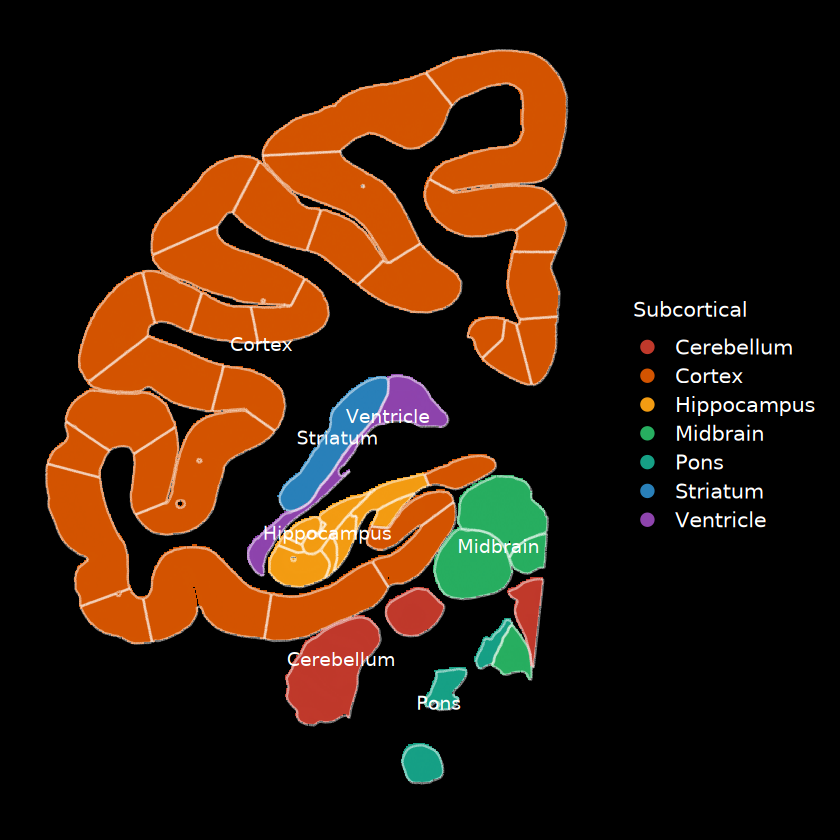

In [ ]:
raster.dpi=c(512, 512)
library(khroma)
parea = ggplot() +
    scattermore::geom_scattermore(
      data = refpos,
      aes(x, y, color = subcortical),
      pixels = raster.dpi,
      pointsize = 1
    ) +
    # geom_point(data = refpos,
    #            aes(x, y, color = subcortical),
    #            size = 0.01) + 
    geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2),
                 size = 0.5,color = "white",alpha = 0.5) + 
    geom_text(data = reflabel, aes(y = ymid, x = xmid, label= subcortical),
              color = "white") +
    scale_color_flatui() +
    theme_presentation() +
    guides(color = guide_legend(override.aes = list(size=4),
                                title = "Subcortical")) +
    # theme(legend.title = element_blank()) +
    scale_y_reverse() + scale_x_reverse()
parea

In [ ]:
ggexport(parea,filename = "result/figure6_other_cmp/subcortical_annotation_spatial_24_11_27.pdf",width = 5,height = 5)

file saved to result/figure6_other_cmp/subcortical_annotation_spatial_24_11_27.pdf



### Annotation cross region

In [362]:
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_22.qs")
head(fsraw.cor)

readid,origin_name,cell_id,cell_type_id,subclass,class,transcript_id,gene_id,x,y,layer,region,lobe,subcortical
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
9eda4dea-9dc0-434f-871e-9448b11daf53-12;st_ed:A:6349-7977;AD:A:adapterC.rc-adapterM;AP:A:RC-Wrong_21-45:-,L-1|2-l1,NA,NA,,,XM_005543577.2,RPS8,10000,26457,l1,1|2,somatosensory,Cortex
8e9fe2ef-d7b3-459a-94a2-f2638c24f2e0-3;st_ed:A:709-1447;AD:A:adapterE-adapterF;AP:A:Correct_695-719:+,L-1|2-l1,NA,NA,,,XM_005594282.1,CXHXorf57,10000,26495,l1,1|2,somatosensory,Cortex
cddeed9c-26d3-4e0f-abb2-709ef8d310c6-4;st_ed:A:803-1394;AD:A:adapterB-adapterC;AP:A:Correct_548-572:+,L-1|2-l2,NA,NA,,,NM_001285041.1,CALM2,10000,26590,l2,1|2,somatosensory,Cortex
03977eea-b45b-42ad-b59d-953ddeb99a39-3;st_ed:A:91-914;AD:A:adapterP.rc-adapterN.rc;AP:A:Jump|AD:A:no-split_21-47:-,L-1|2-l2,NA,NA,,,XM_015437862.1,WBP2,10000,26612,l2,1|2,somatosensory,Cortex
19839030-fc62-41df-9c6f-170ec6b9fb74-15;st_ed:A:6994-7454;AD:A:adapterO-adapterP;AP:A:Correct_417-441:+,L-1|2-l2,NA,NA,,,XM_015437862.1,WBP2,10000,26612,l2,1|2,somatosensory,Cortex
5b2f6398-a7f9-409e-84d3-b492e5bd2168-4;st_ed:A:1607-2156;AD:A:adapterM.rc-adapterL.rc;AP:A:Correct_21-45:-,L-1|2-l2,NA,NA,,,XM_005548045.2,NDUFB4,10000,26652,l2,1|2,somatosensory,Cortex


In [363]:
#head(read.ontd)
read.ontd = qread("data/reads_full_anotation/read_total_annotation_ontdirect_subcortical_25_10_28.qs")
intersect(colnames(read.ontd),colnames(fsraw.cor))

[1] "readid"        "origin_name"   "cell_id"       "cell_type_id" 
 [5] "subclass"      "class"         "gene_id"       "layer"        
 [9] "region"        "subcortical"   "transcript_id" "lobe"

In [366]:
# add subcortical data
read.ontd$x = as.numeric(MySplit(read.ontd$CBZ,":|_",3))
read.ontd$y = as.numeric(MySplit(read.ontd$CBZ,":|_",4))

In [367]:
read.ontd$cid = paste0(read.ontd$x,"_",read.ontd$y)
cellan$cid = paste0(cellan$x,"_",cellan$y)
cellmatch = match(read.ontd$cid,cellan$cid)
read.ontd$cell_id = cellan[cellmatch,]$cell_label
read.ontd$subclass = cellan[cellmatch,]$subclass
read.ontd$class = cellan[cellmatch,]$class

In [368]:
cmid = intersect(colnames(read.ontd),colnames(fsraw.cor))
fsraw.cor = rbind(fsraw.cor[,cmid],read.ontd[,cmid])
qsave(fsraw.cor,"data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")

In [359]:
#head(read.ontd)
#read.ontd[read.ontd$readid == "5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436",]
#fsraw.cor[fsraw.cor$readid == "5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436",]

CBZ,readid,transcript_id,gene_id,x,y,cell_label,gene_area,rx,ry,⋯,cell_type,subclass,class,cell_type_color,layer,region,subcortical,transcript_name,lobe,cid
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>
CB:Z:15320_87919,5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436,NA,NA,15320,87919,535959,1419,52634,74549,⋯,,NA,NA,,cb,cb,Cerebellum,NA,NA,15320_87919
CB:Z:15320_87919,5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436,NA,NA,15320,87919,535959,1419,52634,74549,⋯,,NA,NA,,cb,cb,Cerebellum,NA,NA,15320_87919
CB:Z:15320_87919,5eb21c0c-f945-4434-abfc-b9f63a991d88-5;st_ed:A:1346-1781;AD:A:adapterE-adapterD;AP:A:Wrong-samedirection|ts-te:111-436,NA,NA,15320,87919,535959,1419,52634,74549,⋯,,NA,NA,,cb,cb,Cerebellum,NA,NA,15320_87919


In [335]:
anodf.cb = read.csv("ref/cross_region/macaque_T44_anno.csv")
anodf.cb$subclass = anodf.cb$celltype_new
anodf.cb$class = anodf.cb$celltype_new
anodf.cb[anodf.cb$celltype_new == "Astrocyte",]$subclass = "ASC"
anodf.cb[anodf.cb$celltype_new == "Microglia",]$subclass = "MG"
anodf.cb[anodf.cb$celltype_new == "ODC",]$subclass = "OLG"
anodf.cb[anodf.cb$celltype_new %in% c("MLI1","MLI2"),]$subclass = "MLI"
anodf.cb[anodf.cb$celltype_new %in% c("Granule","UBC"),]$class = "GLU"
anodf.cb[anodf.cb$celltype_new %in% c("Purkinje","Golgi","MLI1","MLI2","PLI"),]$class = "GABA"
anodf.cb[anodf.cb$celltype_new %in% c("Astrocyte","Bergmann","ODC","OPC","Microglia",
                                    "Endothelial_stalk","Fibroblast","Choroid"),]$class = "NonNeuron"
table(anodf.cb$subclass)
table(anodf.cb$class)
write.csv(anodf.cb,file = "ref/cross_region/macaque_T44_myanno.csv",row.names = F, quote = F)


              ASC          Bergmann           Choroid Endothelial_stalk 
             2730              2753              1923              3631 
       Fibroblast             Golgi           Granule                MG 
             1924              1265             32109               714 
              MLI               OLG               OPC               PLI 
             4056               991              1662               400 
         Purkinje               UBC 
             1092              1934 


     GABA       GLU NonNeuron 
     6813     34043     16328 

In [336]:
cell.cb = read.csv("data/cross_region/cellan_cerebellum.csv")
length(unique(cell.cb$cell_label))
cell.cb = merge(cell.cb,anodf.cb[,c("cell_label","subclass","class")],by = "cell_label",all.x = "TRUE")
length(unique(cell.cb[!is.na(cell.cb$subclass),]$cell_label))

[1] 54353

[1] 38839

`summarise()` has grouped output by 'cell_label', 'subclass'. You can override
using the `.groups` argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


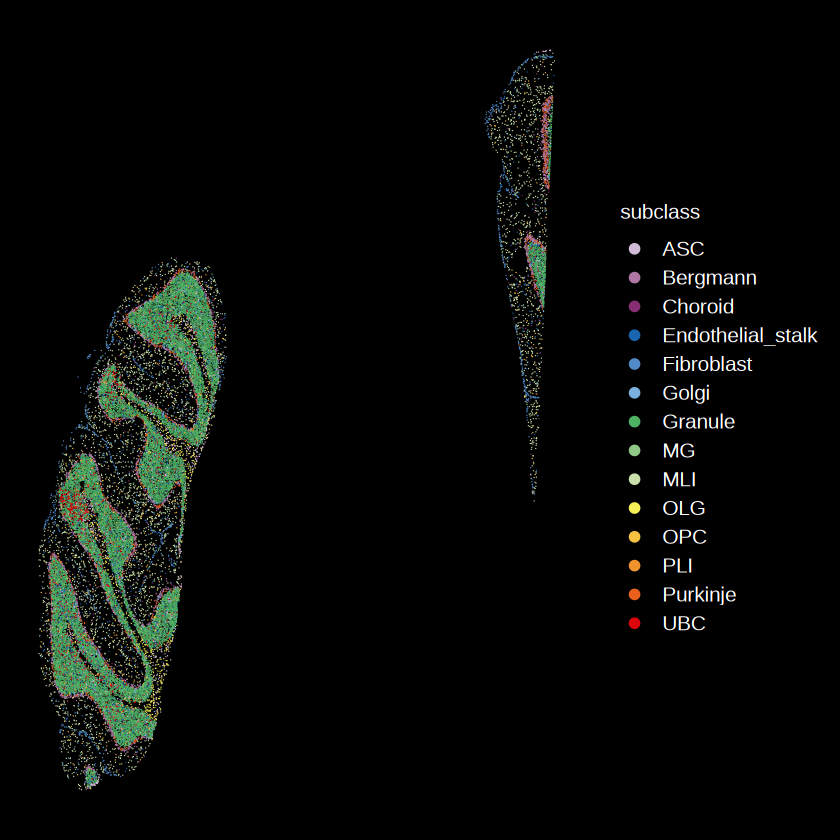

In [40]:
#unique(cell.cb$celltype_new)
cellanuq.cb = cell.cb %>% group_by(cell_label,subclass,class) %>% summarise(x = mean(x),y = mean(y))
#head(cellanuq)
pan1 = ggplot(cellanuq.cb[!is.na(cellanuq.cb$subclass),], aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.1, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  #facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan1

In [334]:
anodf.hp = read.csv("ref/cross_region/T44.hippo.csv")
#table(anodf.hp$cellType)
anodf.hp$subclass = anodf.hp$cellType
anodf.hp$class = anodf.hp$cellType
anodf.hp[anodf.hp$cellType == "astrocyte",]$subclass = "ASC"
anodf.hp[anodf.hp$cellType %in% c("GABA CCK-1","GABA CCK-2","GABA CCK-3","GABA CCK-4"),]$subclass = "CCK"
anodf.hp[anodf.hp$cellType %in% c("GABA LAMP5-1","GABA LAMP5-2","GABA LAMP5-3","GABA LAMP5-4"),]$subclass = "LAMP5"
anodf.hp[anodf.hp$cellType %in% c("GABA PVALB-1","GABA PVALB-2","GABA PVALB-3"),]$subclass = "PVALB"
anodf.hp[anodf.hp$cellType %in% c("GABA SST-1","GABA SST-2"),]$subclass = "SST"
anodf.hp[anodf.hp$cellType %in% c("GABA VIP-1"),]$subclass = "VIP"
anodf.hp[anodf.hp$cellType %in% c("Glu CA1-1","Glu CA1-2","Glu CA2/3-1",
                                  "Glu CA3/4-1","Glu  CA3/4-2","Glu CA3/4-2"),]$subclass = "Pyr"
anodf.hp[anodf.hp$cellType %in% c("Glu DG-1","Glu DG-2","Glu DG-3","Glu DG-4"),]$subclass = "Granule"
anodf.hp[anodf.hp$cellType %in% c("Glu pSUB-deep-1","Glu pSUB-deep-2","Glu pSUB-deep-3","Glu pSUB-int-1",
                                  "Glu pSUB-int-2","Glu pSUB-int-3","Glu pSUB-int-4","Glu pSUB-int-5",
                                  "Glu pSUB-int-6","Glu pSUB-int-7","Glu SUB-1"),]$subclass = "pSUB"
anodf.hp[anodf.hp$cellType %in% c("microglia"),]$subclass = "MG"
anodf.hp[anodf.hp$cellType %in% c("olig"),]$subclass = "OLG"
anodf.hp$class = MySplit(anodf.hp$cellType," ",1)
anodf.hp[anodf.hp$cellType %in% c("astrocyte","microglia","olig","OPC","VLMC"),]$class = "NonNeuron"
anodf.hp[anodf.hp$class == "Glu",]$class = "GLU"
table(anodf.hp$subclass)
table(anodf.hp$class)

write.csv(anodf.hp,file = "ref/cross_region/macaque_T44_myanno_hippo.csv",row.names = F, quote = F)


    ASC     CCK Granule   LAMP5      MG     OLG     OPC    pSUB   PVALB     Pyr 
   4045     306    1873     129     514    2370     160    3421     489    1602 
    SST     VIP    VLMC 
    136      63     197 


     GABA       Glu NonNeuron 
     1123      6896      7286 

In [337]:
cell.hp = read.csv("data/cross_region/Macaque_hippo/cellan_Hippo.csv")
length(unique(cell.hp$cell_label))
cell.hp = merge(cell.hp,anodf.hp[,c("cellID","subclass","class")],by.x = "cell_label",by.y = "cellID",all.x = "TRUE")
#length(unique(cell.hp[!is.na(cell.hp$cellType),]$cell_label))

[1] 19756

`summarise()` has grouped output by 'cell_label'. You can override using the
`.groups` argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


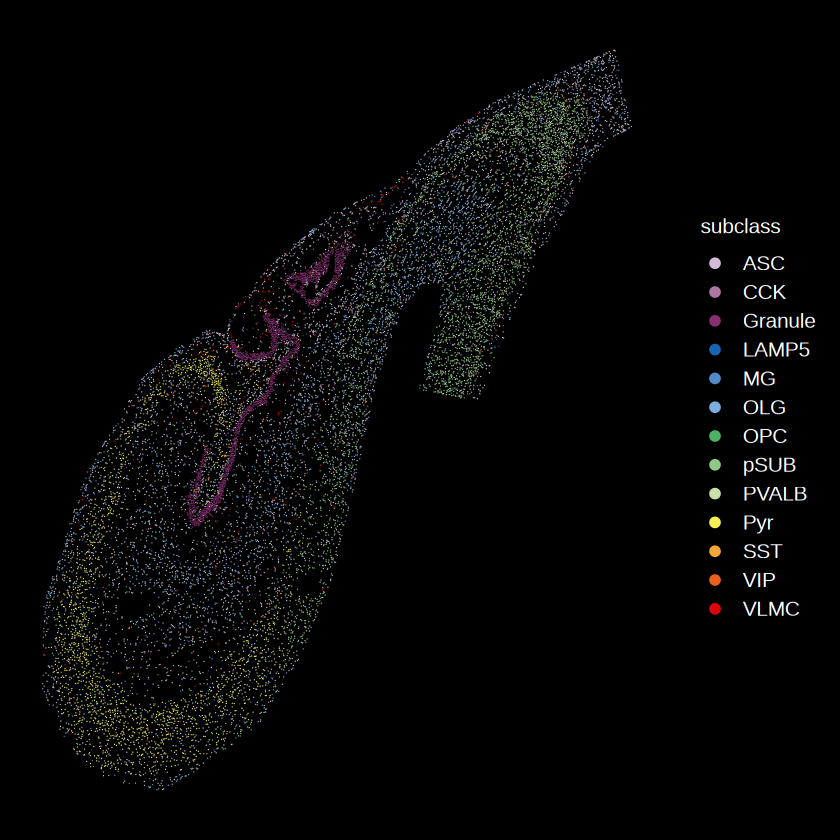

In [43]:
#unique(cell.cb$celltype_new)
cellanuq.hp = cell.hp %>% group_by(cell_label,subclass) %>% summarise(x = mean(x),y = mean(y))
#head(cellanuq)
pan2 = ggplot(cellanuq.hp[!is.na(cellanuq.hp$subclass),], aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.1, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  #facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan2

In [338]:
cellan = rbind(cell.cb,cell.hp)
head(cellan)
qsave(cellan,file = "data/cross_region/cell_cross_region_transfered_annotation_25_10_24.qs")

,cell_label,CBZ,origin_name,cell_type_id,layer,region,subcortical,x,y,subclass,class
,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>
1,5,CB:Z:26955_95855,L-cb-cb,0,cb,cb,Cerebellum,26955,95855,Granule,GLU
2,5,CB:Z:26956_95848,L-cb-cb,0,cb,cb,Cerebellum,26956,95848,Granule,GLU
3,5,CB:Z:26954_95848,L-cb-cb,0,cb,cb,Cerebellum,26954,95848,Granule,GLU
4,5,CB:Z:26951_95847,L-cb-cb,0,cb,cb,Cerebellum,26951,95847,Granule,GLU
5,5,CB:Z:26967_95850,L-cb-cb,0,cb,cb,Cerebellum,26967,95850,Granule,GLU
6,5,CB:Z:26964_95854,L-cb-cb,0,cb,cb,Cerebellum,26964,95854,Granule,GLU


In [511]:
#cellan.cortex
#cellan.ct = read.csv("/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_cell_annotation_T44_macaque_f001_2D_20220928_type20221110-macaque1-contour2.csv")
#cellan.ctp = read.csv("/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/cell_type_type20230220-macaque1-contour2_v1.csv")
#cellan.ct = merge(cellan.ct,cellan.ctp,by = "cell_type_id")
cellan.ct$subcortical = "Cortex"
colnames(cellan.ct)[3] = "cell_label"
cellant = rbind(cellan[,c("cell_label","subclass","class","subcortical")],cellan.ct[,c("cell_label","subclass","class","subcortical")])
head(cellant)
write.csv(cellant,file = "/cluster/home/liuhengxin/P1_brain_nanopore/ref/T44/total_cell_annotation_withcross_25_10_28.csv",row.names = F,quote = F)

,cell_label,subclass,class,subcortical
,<dbl>,<chr>,<chr>,<chr>
1,5,Granule,GLU,Cerebellum
2,5,Granule,GLU,Cerebellum
3,5,Granule,GLU,Cerebellum
4,5,Granule,GLU,Cerebellum
5,5,Granule,GLU,Cerebellum
6,5,Granule,GLU,Cerebellum


In [47]:
#cellan$celltype = cellan$celltype_pred
cellan = cellan[!is.na(cellan$subclass),]
cellanuq = cellan %>% group_by(cell_label,subcortical,subclass,class) %>% summarise(x = mean(x),y = mean(y))
head(cellanuq) 

`summarise()` has grouped output by 'cell_label', 'subcortical', 'subclass'.
You can override using the `.groups` argument.


cell_label,subcortical,subclass,class,x,y
<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
5,Cerebellum,Granule,GLU,26961.11,95849.80
13,Cerebellum,Granule,GLU,30078.90,97249.31
23,Hippocampus,OLG,NonNeuron,27019.98,80759.03
34,Cerebellum,Granule,GLU,28035.90,100615.49
39,Cerebellum,ASC,NonNeuron,24315.22,97323.89
45,Cerebellum,MLI,GABA,29144.95,95807.54


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/cross_region_cellan_spatial_25_10_24.pdf



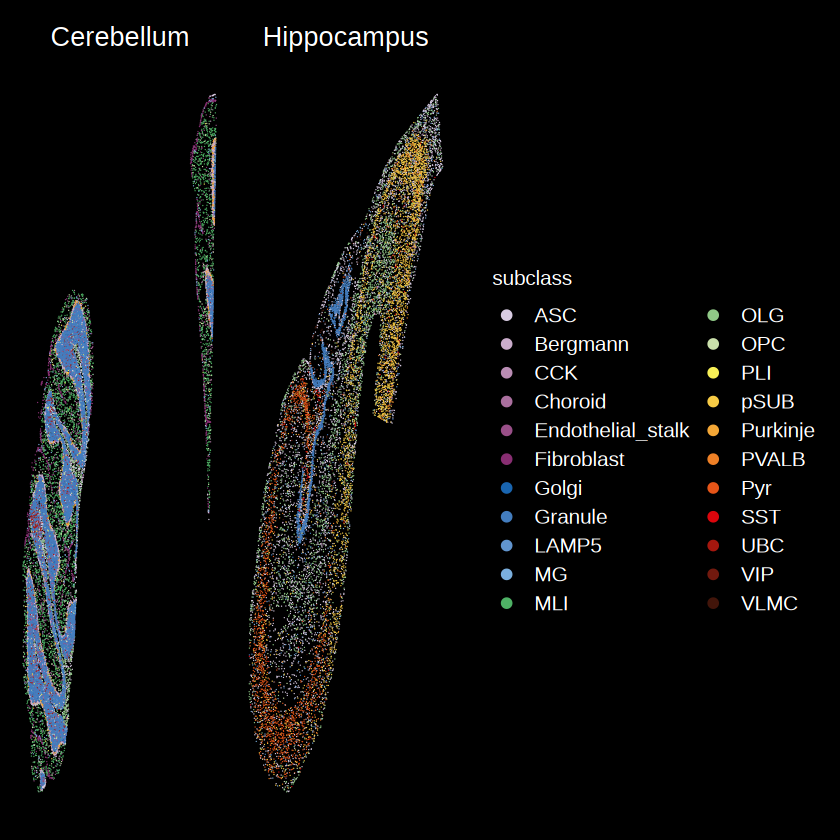

In [49]:
pan = ggplot(cellanuq, aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.1, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan
ggexport(pan,filename = "result/figure_revision/cross_region_cellan_spatial_25_10_24.pdf",width = 9,height = 3.5)


`summarise()` has grouped output by 'subcortical'. You can override using the
`.groups` argument.
file saved to result/figure_revision/cross_region_cellan_composition_25_10_24.pdf



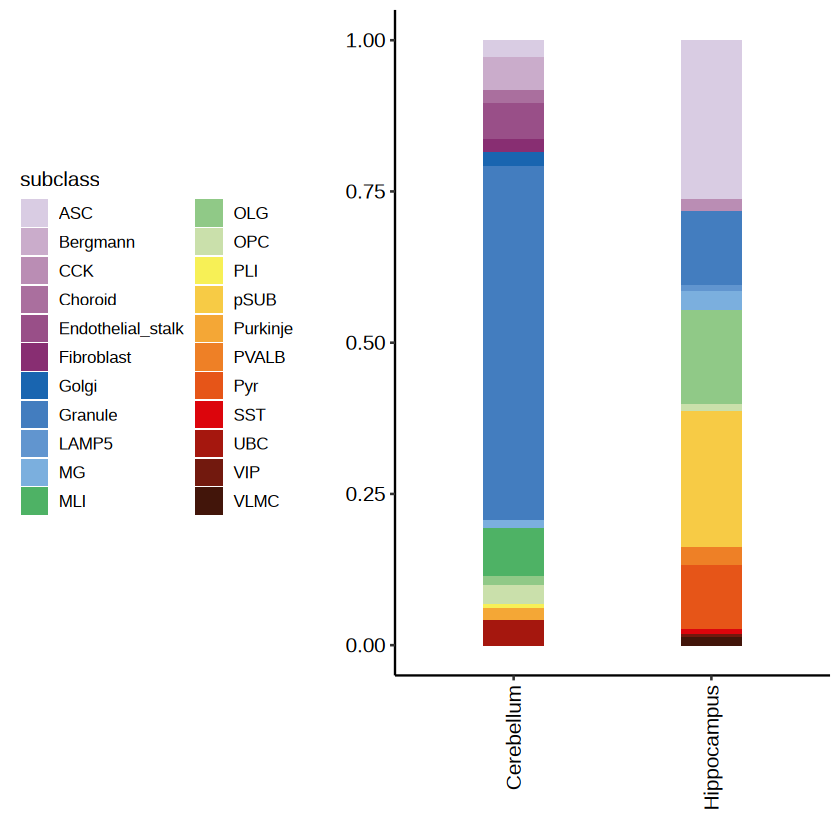

In [57]:
cellanuq.st = cellanuq %>% group_by(subcortical,subclass) %>% summarise(cellnum = length(unique(cell_label)))
p0.1 = ggplot(cellanuq.st, aes(x = subcortical, y = cellnum,fill = subclass)) + 
    geom_bar(stat = "identity",position = "fill",width = 0.3) +  
    scale_fill_discreterainbow() +
    theme_pubr() + theme(axis.text.x = element_text(angle =  90,hjust = 1,vjust = 0.5),legend.position = "left") + 
    xlab("") + ylab("")
p0.1
ggexport(p0.1,filename = "result/figure_revision/cross_region_cellan_composition_25_10_24.pdf",width = 5,height = 4)

In [54]:
fsraw.cor.sub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus"),]
head(fsraw.cor.sub)

readid,origin_name,cell_id,cell_type_id,subclass,class,transcript_id,gene_id,x,y,layer,region,lobe,subcortical
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
8b5e7d1d-2672-490f-9ed4-0d8c9ed586a6-7;st_ed:A:2074-3428;AD:A:adapterD.rc-adapterF;AP:A:RC-Wrong|ts-te:65-731,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
8b5e7d1d-2672-490f-9ed4-0d8c9ed586a6-7;st_ed:A:2074-3428;AD:A:adapterD.rc-adapterF;AP:A:RC-Wrong|ts-te:65-731,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
8b5e7d1d-2672-490f-9ed4-0d8c9ed586a6-7;st_ed:A:2074-3428;AD:A:adapterD.rc-adapterF;AP:A:RC-Wrong|ts-te:65-731,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
acaa5aba-0713-478d-9619-3228701d4bc9-12;st_ed:A:6066-6914;AD:A:adapterF.rc-adapterE.rc;AP:A:Correct_20-43:-,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
acaa5aba-0713-478d-9619-3228701d4bc9-12;st_ed:A:6066-6914;AD:A:adapterF.rc-adapterE.rc;AP:A:Correct_20-43:-,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum
acaa5aba-0713-478d-9619-3228701d4bc9-12;st_ed:A:6066-6914;AD:A:adapterF.rc-adapterE.rc;AP:A:Correct_20-43:-,L-cb-cb,NA,NA,,,XM_005548883.2,APP,15328,87888,cb,cb,NA,Cerebellum


In [55]:
fsraw.cor.sub$cid = paste0(fsraw.cor.sub$x,"_",fsraw.cor.sub$y)
cellan$cid = paste0(cellan$x,"_",cellan$y)
cellmatch = match(fsraw.cor.sub$cid,cellan$cid)
fsraw.cor.sub$cell_id = cellan[cellmatch,]$cell_label
fsraw.cor.sub$subclass = cellan[cellmatch,]$subclass
fsraw.cor.sub$class = cellan[cellmatch,]$class
qsave(fsraw.cor.sub,file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_10_22.qs")
fsraw.cor.sub = fsraw.cor.sub[,colnames(fsraw.cor)]
fsraw.cor = rbind(fsraw.cor[!fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus"),],fsraw.cor.sub)


### Isoform Diversity diger

### Isoform shift stat

In [ ]:
library(dplyr)
library(tidyr)
library(purrr)
# major isoform shift stat
isosigi = isosigls$subcortical
hubgene = unique(isosigi[isosigi$sig != "N",]$gene_id)
isosigi = isosigi[isosigi$gene_id %in% hubgene,]
head(isosigi)
#construct phase dataset
isosigi$ismajor <- FALSE
isosigi <- isosigi %>%
  group_by(areatr, gene_id) %>%
  mutate(ismajor = ifelse(relative == max(relative), TRUE, FALSE)) %>%
  ungroup()
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#isosigi[isosigi$relative > 0.5,]$ismajor = TRUE
isosigi = isosigi[isosigi$ismajor == TRUE | (isosigi$ismajor == FALSE & abs(isosigi$relative - isosigi$otherrelative) > 0.1),]
isosigi = isosigi %>% group_by(transcript_id) %>% filter(length(unique(ismajor)) > 1)
length(unique(isosigi$gene_id))
length(unique(isosigi$transcript_id))
library(tidyr)
df_wide <- pivot_wider(isosigi, 
                       id_cols = transcript_id, 
                       names_from = areatr, 
                       values_from = ismajor)


Attaching package: 'tidyr'


The following object is masked from 'package:reshape2':

    smiths


The following object is masked from 'package:S4Vectors':

    expand



Attaching package: 'purrr'


The following object is masked from 'package:XVector':

    compact


The following object is masked from 'package:GenomicRanges':

    reduce


The following object is masked from 'package:IRanges':

    reduce


The following object is masked from 'package:data.table':

    transpose




,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
9,AACS,NM_001284010.1,Cerebellum,146,158,0.9240506,0.855632,0.8419483,0.08210238,N,0.001852607,0.005294328
10,AACS,NM_001284010.1,Cortex,2879,3272,0.8798900,0.855632,0.8507804,0.02910959,N,0.001852607,0.005294328
11,AACS,NM_001284010.1,Hippocampus,92,117,0.7863248,0.855632,0.8694934,-0.08316864,N,0.001852607,0.005294328
12,AACS,NM_001284010.1,Midbrain,37,48,0.7708333,0.855632,0.8725917,-0.10175838,Down,0.001852607,0.005294328
13,AACS,NM_001284010.1,Striatum,29,31,0.9354839,0.855632,0.8396616,0.09582226,N,0.001852607,0.005294328
14,AACS,NM_001284010.1,Ventricle,36,43,0.8372093,0.855632,0.8593165,-0.02210722,N,0.001852607,0.005294328


[1] 375

[1] 375

In [ ]:
datas5$shift_isoform = isosigi
datas5$shift_isoform_st = df_wide

Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
"Some strata appear at multiple axes."
file saved to result/figure6_other_cmp/sigiso_subcortical_isoform_shift_alluv_25_11_04.pdf



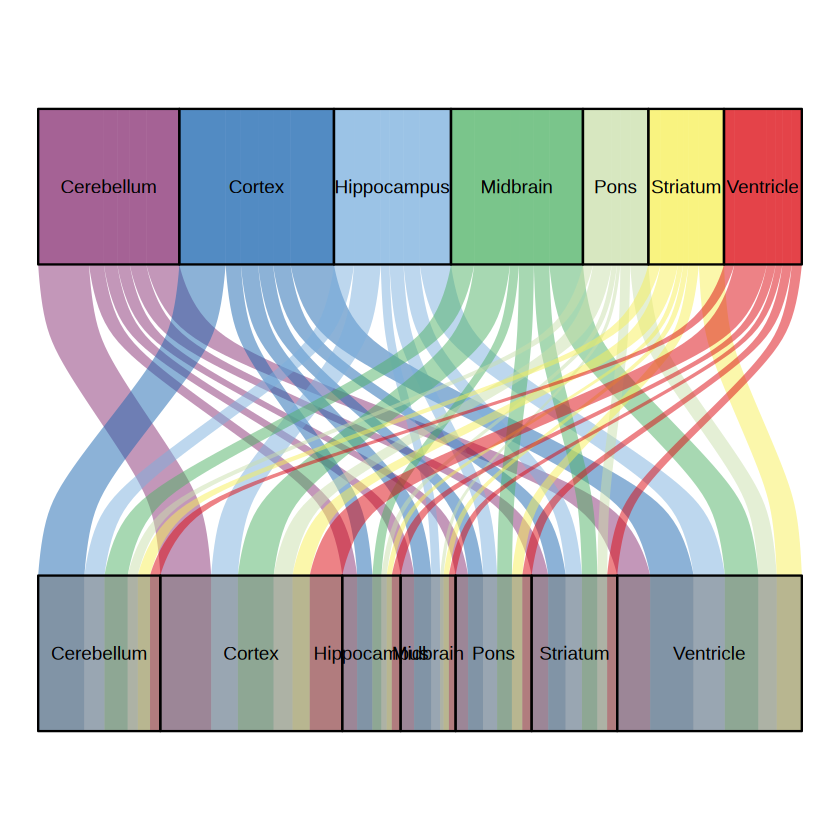

In [ ]:
# #df_wide
# areas <- names(df_wide)[-1] 

# combinations <- expand.grid(ismajorT = areas, ismajorF = areas, stringsAsFactors = FALSE)
# combinations$value = 0
# for(i in 1:nrow(combinations)){
#     x <- combinations[i,"ismajorT"]
#     y <- combinations[i,"ismajorF"]
#     df_widei = df_wide[,c(x,y)]
#     df_widei = df_widei[!is.na(df_widei[,1]) & !is.na(df_widei[,2]),]
#     combinations[i,]$value = nrow(df_widei[df_widei[,1] & !df_widei[,2],])
# }
# combinations

df = df_wide
# 生成单细胞组合统计表
result_single <- df %>%
  pivot_longer(-transcript_id, names_to = "cell_type", values_to = "value") %>%
  filter(!is.na(value)) %>%
  group_by(transcript_id) %>%
  summarise(
    T_cells = list(cell_type[value == TRUE]),
    F_cells = list(cell_type[value == FALSE])
  ) %>%
  filter(lengths(T_cells) > 0 & lengths(F_cells) > 0) %>%
  # 拆分单个细胞并计算权重
  mutate(
    T_single = map(T_cells, ~ {
      if(length(.x) > 0) tibble(T_single = .x, t_weight = 1/length(.x))
    }),
    F_single = map(F_cells, ~ {
      if(length(.x) > 0) tibble(F_single = .x, f_weight = 1/length(.x))
    })
  ) %>%
  dplyr::select(-T_cells, -F_cells) %>%
  # 展开单细胞组合
  unnest(T_single, keep_empty = TRUE) %>%
  unnest(F_single, keep_empty = TRUE) %>%
  # 计算标准化频数
  mutate(norm = t_weight * f_weight,count = 1) %>%
  group_by(T_single, F_single) %>%
  summarise(count = sum(count), 
            norm = sum(norm), 
            .groups = "drop") %>%
  # 格式整理
  arrange(desc(count)) %>%
  filter(!is.na(T_single) & !is.na(F_single))

# 查看结果
# print(result_single)
# result_single$T_single = factor(result_single$T_single,suborder)
# result_single$F_single = factor(result_single$F_single,suborder)
library(ggalluvial)
pf1.1 = ggplot(result_single,
                   aes(axis2 = T_single, axis1 = F_single, y = norm, fill = T_single)) +
        scale_x_discrete(expand = c(.1, .1)) +
        geom_alluvium(aes(fill = T_single)) +
        # geom_flow(aes(color = celltype)) +
        #geom_flow(aes(fill = prog)) +
        geom_stratum(alpha = .5) +
        scale_fill_discreterainbow() + 
        geom_text(stat = "stratum", aes(label = after_stat(stratum))) +
coord_flip() + scale_y_reverse() +
theme_void() + theme(legend.position = "none")
pf1.1 

# library(igraph)
# final_results <- result_single %>%
#     mutate(OR = (count / sum(count)) / ((sum(count) - count) / sum(count))) %>%
#   filter(count >= quantile(count, 0.75)) %>%
#   filter(abs(log(OR)) > 1) %>%
#   arrange(desc(count))

# sum(final_results$count)
# pf1.1 = ggplot(result_single,
#                    aes(axis1 = T_single, axis2 = F_single, y = count, fill = T_single)) +
#         scale_x_discrete(expand = c(.1, .1)) +
#         geom_alluvium(aes(fill = T_single)) +
#         # geom_flow(aes(color = celltype)) +
#         #geom_flow(aes(fill = prog)) +
#         geom_stratum(alpha = .5) +
#         scale_fill_discreterainbow() + 
#         geom_text(stat = "stratum", aes(label = after_stat(stratum))) +
# theme_void()
# pf1.1

# 安装并加载 dplyr 包
#install.packages("dplyr")
#library(dplyr)

ggexport(pf1.1,filename = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_alluv_25_11_04.pdf",
         width = 3.5,height = 5)

In [ ]:
result_single[order(-result_single$count),]

T_single,F_single,count,norm
<chr>,<chr>,<dbl>,<dbl>
Cortex,Ventricle,92,21.327778
Midbrain,Ventricle,87,16.500000
Hippocampus,Ventricle,85,15.344444
Cerebellum,Ventricle,84,16.191667
Cerebellum,Cortex,77,24.958333
Midbrain,Cortex,74,17.577778
Striatum,Ventricle,70,12.336111
Ventricle,Cortex,64,15.969444
Cortex,Cerebellum,63,22.711111


In [ ]:
shiftprop = data.frame()
mkls.region.st$prop = mkls.region.st$genenum / sum(mkls.region.st$genenum)
mkls.region.st$proplabel = paste0(round(mkls.region.st$prop*100,1),"%")
mkls.region.st$group = "region"

mkls.transt = rbind(mkls.layer.st,mkls.lobe.st,mkls.region.st)
mkls.transt
p1.4 = ggplot(mkls.transt[mkls.transt$group == "layer",], aes(x=group, y=prop, fill=transnum)) +
  geom_bar(stat="identity", width = 0.5, color= NA) +
  coord_polar("y", start=0) +
  geom_text(aes(label = proplabel),position = position_stack(0.5), color = "white", size=6) +
  scale_fill_flatui() + theme_void()
p1.4
write.csv(mkls.transt,file = "result/figure2/gene_marker_isoform_heterogeneity_stat_pie_25_11_04.csv")
ggexport(p1.4,filename = "result/figure2/gene_marker_isoform_heterogeneity_stat_pie_25_11_04.pdf",width = 4,height = 5)

ERROR: Error: object 'mkls.region.st' not found


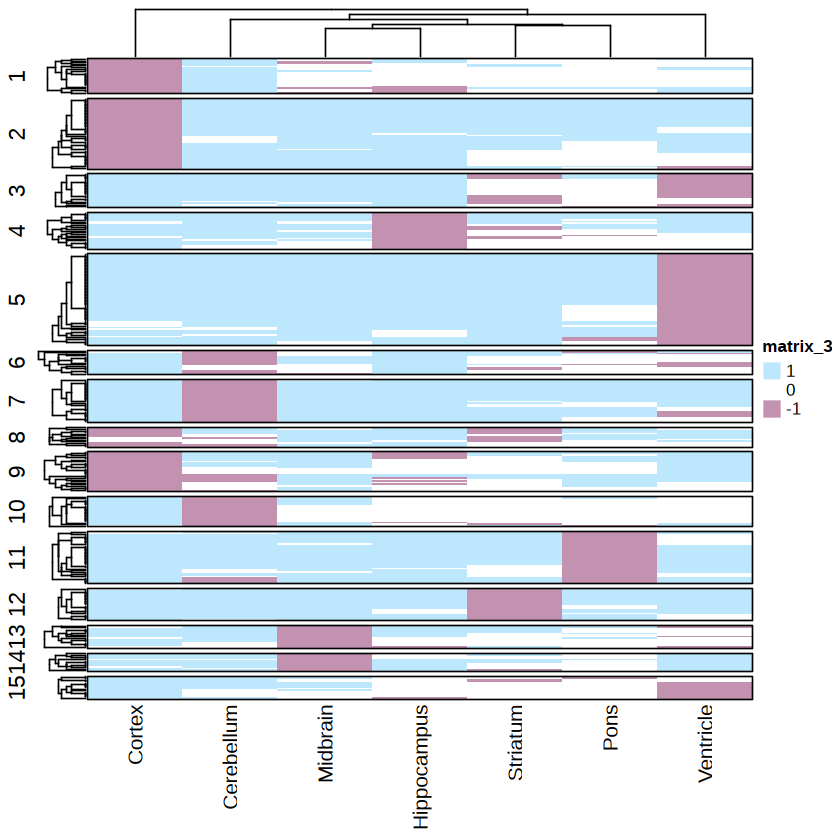

In [ ]:
# 转换逻辑值为数值
df_numeric <- df_wide %>%
  mutate(across(
    everything(),
    function(x) {
      x %>%
        replace(is.na(x), 0) %>%  # 将 NA 替换为 0
        replace(x == TRUE, 1) %>%  # 将 TRUE 替换为 1
        replace(x == FALSE, -1)    # 将 FALSE 替换为 -1
    }
  ))

# 查看结果
#print(df_numeric)
df_numeric = as.data.frame(df_numeric)
gtdf = unique(isosigi[,c("gene_id","transcript_id")])
rownames(df_numeric) = gtdf[match(df_numeric$transcript_id,gtdf$transcript_id),]$gene_id
df_numeric = df_numeric[,-1]

dist_na <- function(x) {
  dist(x, method = "euclidean", diag = FALSE, upper = FALSE, p = 2)
}

library(ComplexHeatmap)
n = 15
fit = kmeans(df_numeric,n)
split <- factor(as.character(fit$cluster), levels=as.character(c(1:n)))

ht = Heatmap(as.matrix(df_numeric),show_row_names = F,border = T,row_split = split,
        col = c("#C492B1","white","#BCE7FD"),cluster_row_slices = FALSE,cluster_rows = T)
ht
#ggexport(p,filename = "result/figure6_other_cmp/iso_sig_subclass_subcortical_cor_heatmap_24_11_27.pdf",width = 4,height = 5)

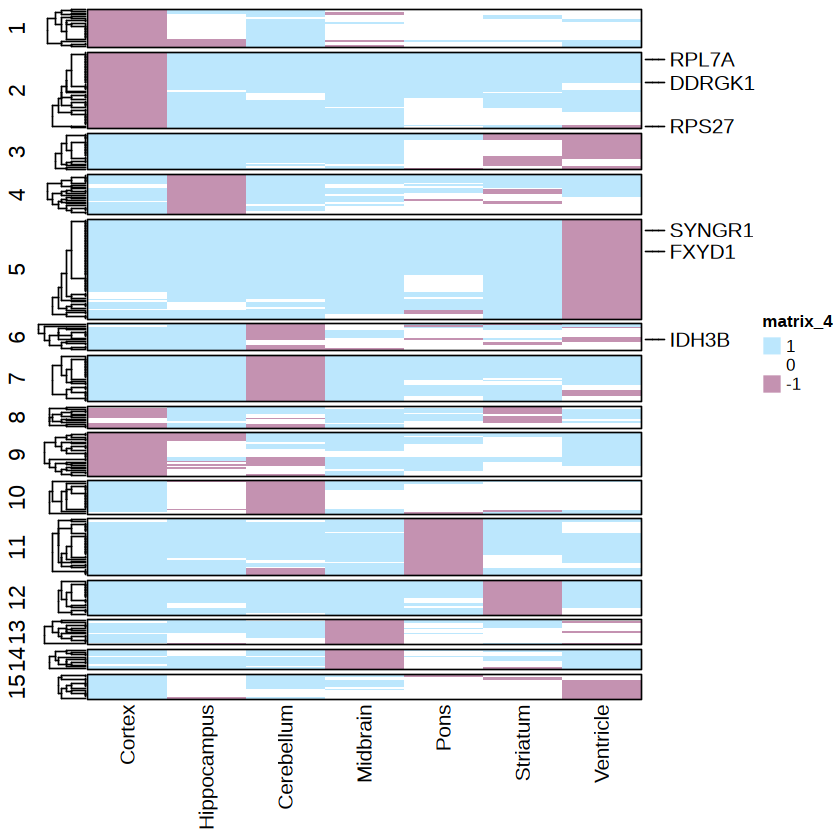

In [ ]:
colorder = c("Cortex","Hippocampus","Cerebellum","Midbrain","Pons","Striatum","Ventricle")
annoid = c("ARPP19","ARPP21","DDRGK1","RPS27","PPP3CB","IDH3B","SYNGR1","FXYD1","EPB41","PDHA1","SLC8A1","RPL7A")
df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(df_numeric) %in% annoid), 
                                    labels = rownames(df_numeric)[which(rownames(df_numeric) %in% annoid)]))
Heatmap(as.matrix(df_numeric),show_row_names = F,border = T,row_split = split,cluster_columns = F,
        col = c("#C492B1","white","#BCE7FD"),cluster_row_slices = FALSE,cluster_rows = T,
        right_annotation = ha,row_names_side = "left", row_names_gp = gpar(fontsize = 4))

file saved to result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.pdf



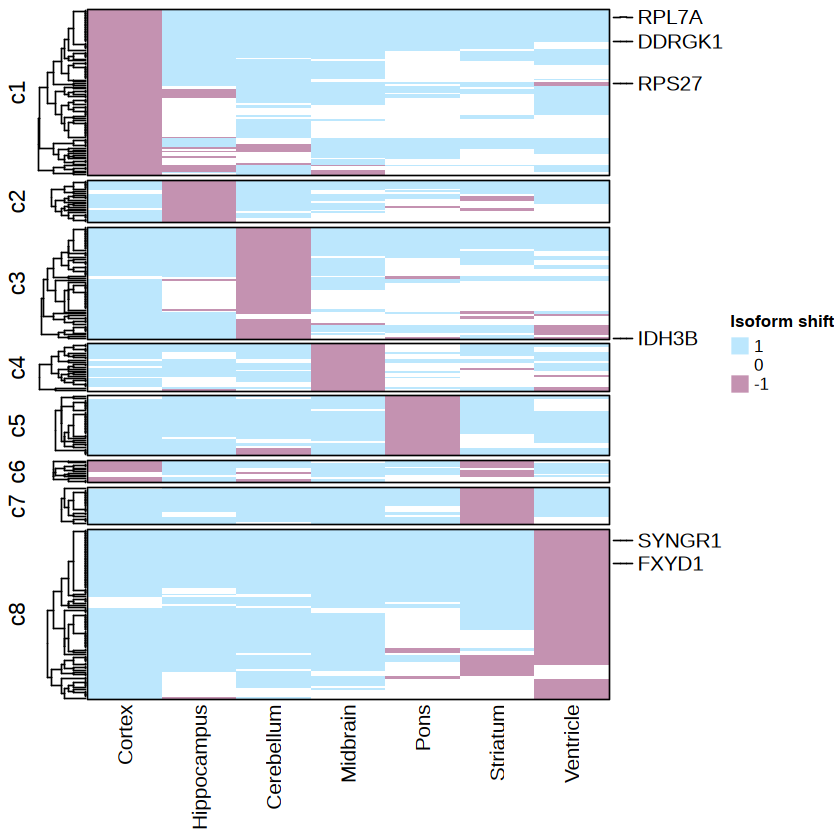

In [ ]:
clist = list("c1" = c(1,2,9),"c2" = c(4),"c3" = c(6,7,10),"c4" = c(13,14),"c5" = c(11),
             "c6" = c(8),"c7" = c(12),"c8" = c(3,15,5))

MergeCluster = function(htls,clist){
  #merge cluster
  split = as.character(htls$rowcluster)
  for (i in 1:length(clist)) {
    split[which(as.character(split) %in% as.character(clist[[i]]))] = names(clist)[i]
  }
  # 
  split = factor(as.character(split), levels = names(clist))
  names(split) = names(htls$rowcluster)
  reorder.hmap = Heatmap(htls$ht@matrix, 
                         name = "delta Isoform\n ratio",
                         row_split = split,
                         # cluster_rows = F,
                         cluster_columns = F,
                         cluster_row_slices = FALSE,
                         #cluster_column_slices = FALSE,
                         show_row_names = F,
                         col = colorRamp2(c(-0.4,0,0.4), 
                                          c("#08306B", "white", "red")),
                         column_order = htls$colorder
  )
  reorder.hmap
  htls$rowcluster = split
  htls$ht = reorder.hmap
  return(htls)
}
htls = list(rowcluster = split,ht = ht,colorder = colorder)
htls = MergeCluster(htls,clist)
htmx = htls$ht@matrix
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(df_numeric) %in% annoid), 
                                    labels = rownames(df_numeric)[which(rownames(df_numeric) %in% annoid)]))
pclonehti2 = Heatmap(htmx, name = "Isoform shift",
                         row_split = htls$rowcluster,
                         # cluster_rows = F,
                         cluster_columns = F,
                         cluster_row_slices = FALSE,
                         #cluster_column_slices = FALSE,
                         show_row_names = F,
                         col = c("#C492B1","white","#BCE7FD"),
                         column_order = htls$colorder,
                         border = TRUE,right_annotation = ha,row_names_side = "left")
pclonehti2
ggexport(pclonehti2,filename = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.pdf",
         width =7,height = 7)

In [ ]:
htls$rowcluster


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
9983,DISP2,DISP2-FS-1,Cerebellum,109,205,0.53170732,0.1980009,0.08676548,0.44494184,Up,4.370178e-38,1.534681e-36
9984,DISP2,DISP2-FS-1,Cortex,154,1094,0.14076782,0.1980009,0.21707865,-0.07631082,N,4.370178e-38,1.534681e-36
9985,DISP2,DISP2-FS-1,Hippocampus,1,22,0.04545455,0.1980009,0.24884974,-0.20339519,N,4.370178e-38,1.534681e-36
9986,DISP2,DISP2-FS-1,Midbrain,4,54,0.07407407,0.1980009,0.23930990,-0.16523582,N,4.370178e-38,1.534681e-36
9987,DISP2,XM_005559173.2,Cerebellum,96,205,0.46829268,0.8019991,0.91323452,-0.44494184,Down,4.370178e-38,1.534681e-36
9988,DISP2,XM_005559173.2,Cortex,940,1094,0.85923218,0.8019991,0.78292135,0.07631082,N,4.370178e-38,1.534681e-36
9989,DISP2,XM_005559173.2,Hippocampus,21,22,0.95454545,0.8019991,0.75115026,0.20339519,Up,4.370178e-38,1.534681e-36
9990,DISP2,XM_005559173.2,Midbrain,50,54,0.92592593,0.8019991,0.76069010,0.16523582,Up,4.370178e-38,1.534681e-36


In [ ]:
isosigt = isosigls$subcortical
isosigt[isosigt$gene_id %in% "DISP2",]
shiftgcl = data.frame("gene_id" = rownames(df_numeric),"cluster" = htls$rowcluster)
hubiso = isosigi[isosigi$gene_id %in% shiftgcl[as.character(shiftgcl$cluster) == "c4",]$gene_id,]
hubiso = hubiso[hubiso$sig != "N" & hubiso$areatr == "Cerebellum" & abs(hubiso$dr) > 0.2,]
hubiso
#hubiso[hubiso$gene_id %in% "DISP2",]

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,ismajor
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<lgl>
ELMO1,XM_005549786.2,Cerebellum,109,127,0.8582677,0.6158379,0.5350280,0.3232397,Up,1.988401e-15,2.710065e-14,TRUE
TNNC1,XM_005547346.2,Cerebellum,135,141,0.9574468,0.7411016,0.6689866,0.2884602,Up,1.022443e-21,1.934701e-20,TRUE


In [ ]:
#shiftgcl
write.csv(shiftgcl,file = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.csv",quote = F,row.names = F)

gene_id,cluster
<chr>,<fct>
ABCE1,c7
ACLY,c4
ACSF2,c1
AK1,c1
ALG13,c8
ALKBH6,c1
ANKRD65,c1
AP1S2,c8
APIP,c5


In [ ]:
df = df_wide
# 生成单细胞组合统计表
result_single <- df %>%
  pivot_longer(-transcript_id, names_to = "cell_type", values_to = "value") %>%
  filter(!is.na(value)) %>% 


  group_by(transcript_id) %>%
  summarise(
    T_cells = list(cell_type[value == TRUE]),
    F_cells = list(cell_type[value == FALSE])
  ) %>%
  filter(lengths(T_cells) > 0 & lengths(F_cells) > 0) %>%
  # 拆分单个细胞并计算权重
  mutate(
    T_single = map(T_cells, ~ {
      if(length(.x) > 0) tibble(T_single = .x, t_weight = 1/length(.x))
    }),
    F_single = map(F_cells, ~ {
      if(length(.x) > 0) tibble(F_single = .x, f_weight = 1/length(.x))
    })
  ) %>%
  select(-T_cells, -F_cells) %>%
  # 展开单细胞组合
  unnest(T_single, keep_empty = TRUE) %>%
  unnest(F_single, keep_empty = TRUE) %>%
  # 计算标准化频数
  mutate(count = t_weight * f_weight) %>%
  group_by(F_single) %>%
  mutate(F_isonum = length(unique(transcript_id))) %>%
  group_by(T_single, F_single) %>%
  summarise(count = sum(count), .groups = "drop", 
            isonum = length(unique(transcript_id)),F_isonum = unique(F_isonum)) %>%
  # 格式整理
  arrange(desc(count)) %>%
  filter(!is.na(T_single) & !is.na(F_single))


# 查看结果
print(result_single)
library(ggalluvial)
result_single$celltype = result_single$F_single

# A tibble: 42 × 5
   T_single    F_single   count isonum F_isonum
   <chr>       <chr>      <dbl>  <int>    <int>
 1 Cerebellum  Cortex      25.0     77      104
 2 Cortex      Cerebellum  22.7     63       74
 3 Cortex      Ventricle   21.3     92      102
 4 Midbrain    Cortex      17.6     74      104
 5 Midbrain    Ventricle   16.5     87      102
 6 Cerebellum  Ventricle   16.2     84      102
 7 Ventricle   Cortex      16.0     64      104
 8 Hippocampus Ventricle   15.3     85      102
 9 Hippocampus Cortex      13.1     59      104
10 Striatum    Ventricle   12.3     70      102
# ℹ 32 more rows


In [ ]:
head(result_single)

T_single,F_single,count,isonum,F_isonum,celltype
<chr>,<chr>,<dbl>,<int>,<int>,<chr>
Cerebellum,Cortex,24.95833,77,104,Cortex
Cortex,Cerebellum,22.71111,63,74,Cerebellum
Cortex,Ventricle,21.32778,92,102,Ventricle
Midbrain,Cortex,17.57778,74,104,Cortex
Midbrain,Ventricle,16.50000,87,102,Ventricle
Cerebellum,Ventricle,16.19167,84,102,Ventricle


file saved to result/figure6_other_cmp/sigiso_subcortical_isoform_shift_stat_25_11_04.pdf



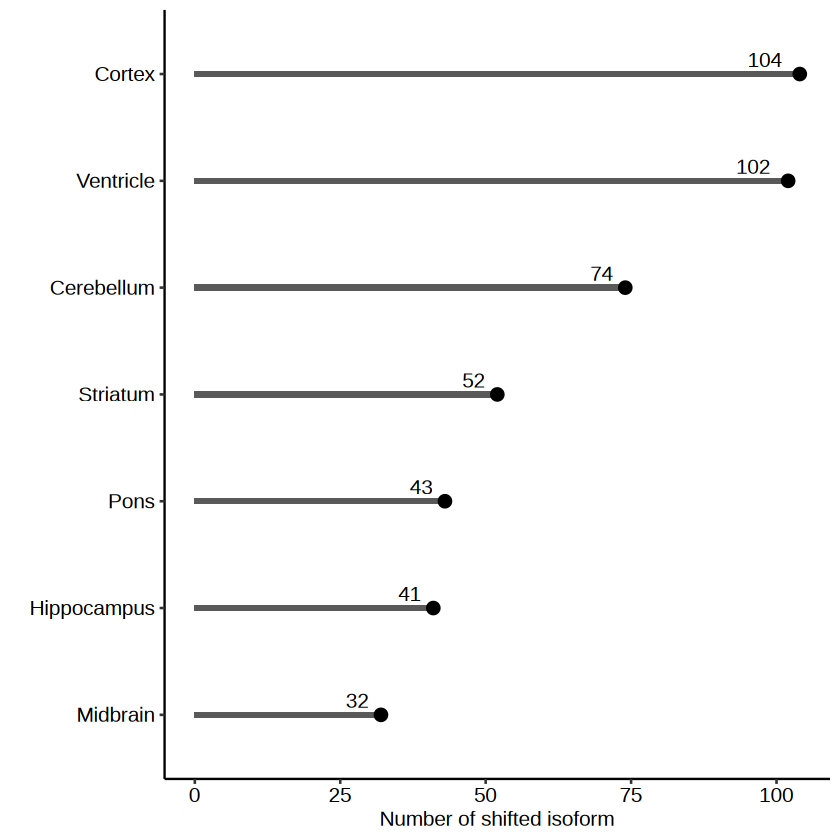

In [ ]:
result_single.st = unique(result_single[,c("F_single","F_isonum")])
# head(result_single.st)
# ggplot(result_single,aes(x = T_single, y = F_single,size = isonum,color = log(count))) + geom_point() + 
# scale_color_viridis(option = "A") + coord_fixed() + theme_bw()
#result_single.st = result_single.st[order(result_single.st),]
result_single.st = result_single.st[order(result_single.st$F_isonum),]
result_single.st$F_single = factor(result_single.st$F_single,levels = unique(result_single.st$F_single))
p2 = ggplot(result_single.st,aes(y = F_single,x = F_isonum)) + 
    geom_bar(stat = "identity",width = 0.05) + 
    geom_point(size = 3) +
    geom_text(aes(label = F_isonum),hjust = 1.5,vjust = -0.5) +
    scale_fill_viridis(option = "A") + theme_pubr() + ylab("") + xlab("Number of shifted isoform")
p2
ggexport(p2,filename = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_stat_25_11_04.pdf",
         width = 3,height = 4)

$rowcluster
  [1] c7 c4 c1 c1 c8 c1 c1 c8 c5 c1 c3 c8 c5 c3 c2 c3 c1 c5 c8 c8 c8 c8 c1 c6 c8
 [26] c8 c3 c6 c4 c1 c7 c3 c3 c8 c5 c7 c4 c6 c1 c1 c1 c7 c8 c1 c8 c5 c3 c3 c2 c7
 [51] c3 c8 c8 c8 c2 c8 c8 c3 c1 c8 c8 c8 c3 c8 c1 c5 c1 c1 c3 c2 c8 c1 c4 c8 c3
 [76] c2 c8 c8 c8 c8 c3 c1 c2 c7 c5 c8 c8 c4 c8 c5 c1 c3 c5 c1 c1 c1 c5 c8 c2 c1
[101] c8 c8 c3 c1 c4 c7 c4 c1 c4 c1 c1 c8 c2 c3 c5 c5 c6 c5 c1 c3 c8 c8 c5 c1 c3
[126] c3 c1 c1 c8 c8 c8 c2 c1 c1 c3 c2 c4 c8 c5 c8 c5 c7 c1 c8 c5 c8 c4 c6 c7 c4
[151] c2 c1 c8 c2 c7 c8 c6 c3 c8 c8 c1 c2 c2 c7 c1 c8 c4 c3 c4 c3 c3 c1 c3 c3 c1
[176] c1 c1 c8 c3 c1 c3 c8 c1 c8 c1 c4 c8 c1 c6 c8 c1 c1 c4 c3 c1 c4 c1 c1 c8 c8
[201] c8 c8 c3 c1 c3 c7 c2 c3 c7 c8 c8 c4 c8 c4 c1 c8 c7 c3 c5 c1 c1 c3 c1 c7 c4
[226] c5 c2 c1 c3 c5 c5 c2 c1 c8 c5 c1 c1 c1 c5 c8 c7 c1 c3 c4 c1 c1 c3 c8 c8 c1
[251] c3 c8 c3 c1 c1 c3 c5 c4 c8 c6 c8 c8 c7 c1 c1 c7 c1 c8 c8 c1 c1 c8 c8 c1 c6
[276] c5 c1 c1 c8 c3 c1 c1 c5 c3 c1 c6 c1 c8 c8 c3 c7 c1 c8 c3 c8 c3 c8 c3 c3 c2
[301] c5 c5 c1 c

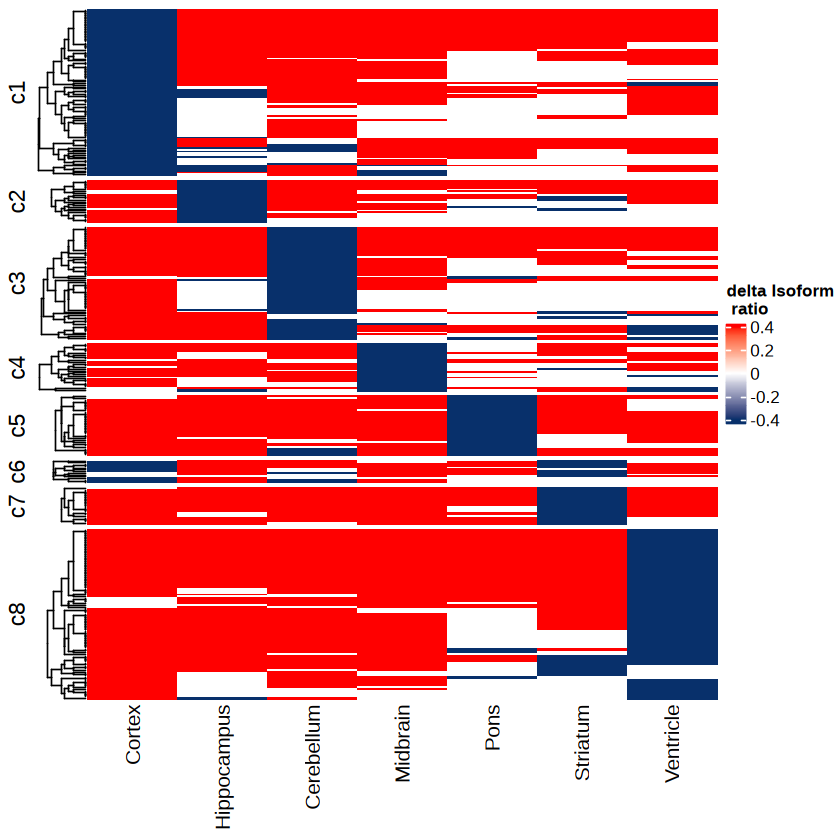

In [ ]:
htls

#### Total subcortical diversity

In [ ]:
ReadIsoNumRandom = function(npclfglu,n = 500,mygroup){
    readids = unique(npclfglu$readid)
    readid1 = readids[sample(1:length(readids),n)]
    transt1 = npclfglu[npclfglu$readid %in% readid1,]
    transt1 = transt1[order(transt1$readid,transt1$gene_id,
                            transt1$transcript_id),]
    transt1 = transt1[!duplicated(transt1[c("readid","gene_id")]),]
    
    transt1 = transt1 %>% group_by(gene_id) %>% 
      summarise(transnum = length(unique(transcript_id)),
                readnum = length(unique(readid)))
    transt1f = transt1[transt1$readnum > 1,]
    median(transt1f$transnum)
    
    resdf = data.frame("mison" = mean(transt1f$transnum),
                       "isot" = sum(transt1$transnum),
                       "genet" = nrow(transt1),
                       "readnum" = n,
                       "group" = mygroup)
    
    return(resdf)
}

groupanid = unique(fsraw.cor$subcortical)
fsrawdpls = list()
for (i in 1:length(groupanid)) {
    fsrawdpls[[i]] = fsraw.cor[fsraw.cor$subcortical == groupanid[i],]
}
names(fsrawdpls) = groupanid

k = 100000
cellrdsto = NULL
for (i in 1:100) {
    print(i)
    for (j in 1:length(fsrawdpls)) {
      cellrdti = ReadIsoNumRandom(fsrawdpls[[j]],k,names(fsrawdpls)[j])
      cellrdsto = rbind(cellrdsto,cellrdti)
    }
}
qsave(cellrdsto,"result/figure6_other_cmp/bambu_subcortical_isoform_diversity_cmp_25_12_05.qs")


In [17]:
cellrdsto = qread("result/figure6_other_cmp/bambu_subcortical_isoform_diversity_cmp_25_12_05.qs")

file saved to result/figure6_other_cmp/subcortical_isoform_diversity_cmp_box_25_12_05.pdf



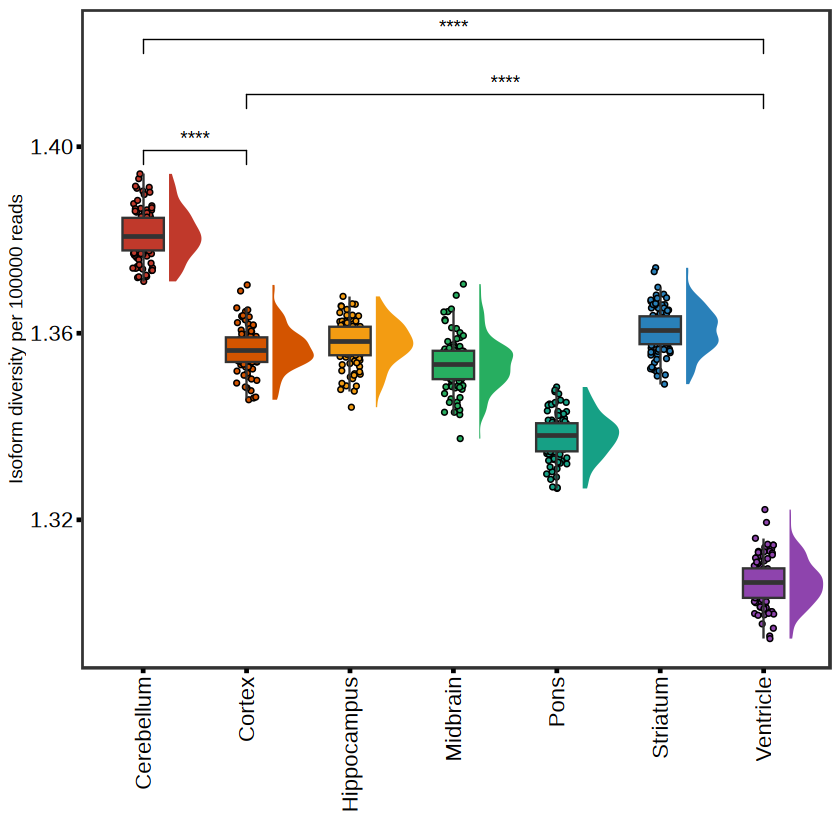

In [19]:
library(gghalves)
pt1 = ggplot(cellrdsto,aes(x = group, y = mison, fill = group))+
      geom_jitter(aes(fill = group),shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,comparison = list(c("Cerebellum","Cortex"),
                                                                                            c("Cortex","Ventricle"),
                                                                                            c("Cerebellum","Ventricle")))  +
      theme_bw()+
      theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),legend.position = "none",
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1,vjust = 0.5),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform diversity per 100000 reads") + xlab("") 
pt1
ggexport(pt1,filename = "result/figure6_other_cmp/subcortical_isoform_diversity_cmp_box_25_12_05.pdf", width = 3.5,height = 4)


#### single cell subcortical diversity

In [5]:
fsraw.cor = qread("data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_25_10_28.qs")
fsraw.cor.sub = fsraw.cor[fsraw.cor$subcortical %in% c("Cerebellum","Hippocampus","Cortex"),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$cell_id) & fsraw.cor.sub$cell_id != "",]
unique(fsraw.cor.sub$class)

[1] "GLU"       "GABA"      "NonNeuron" "Glu"       NA

In [5]:
#fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass) & fsraw.cor.sub$subclass != "",]

In [370]:
#total cell level and total reads level
#fsraw.cor.sub
rdstot = fsraw.cor.sub %>% group_by(areatr) %>% 
              mutate(cellnum = length(unique(cell_id))) %>%
                group_by(areatr,gene_id) %>% 
              summarise(transnum = length(unique(transcript_id)),
                        readnum = length(unique(readid)),cellnum = cellnum[1])
rdstot = rdstot %>% group_by(areatr) %>% 
              summarise(mison = mean(transnum),
                        isot = sum(transnum),
                       readnum = sum(readnum),
                       cellnum = cellnum[1])
rdstot

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


areatr,mison,isot,readnum,cellnum
<chr>,<dbl>,<int>,<int>,<int>
Cerebellum-ASC,1.166543,7887,36425,1112
Cerebellum-Bergmann,1.234728,11036,89383,2123
Cerebellum-Choroid,1.149269,6683,31107,839
Cerebellum-Endothelial_stalk,1.240769,10652,84206,2262
Cerebellum-Fibroblast,1.102448,5585,19020,872
Cerebellum-Golgi,1.196436,8393,48736,887
Cerebellum-Granule,1.552284,23826,1047196,22713
Cerebellum-MG,1.076882,4048,11141,479
Cerebellum-MLI,1.264894,12654,110265,3115


In [373]:
# subclst = fsraw.cor %>% group_by(class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
# subclst
ReadIsoNumRandom = function(npclfglu,n = 500,time){
    areatrs = unique(npclfglu$areatr)
    resdf = NULL
    for (i in 1:length(areatrs)) {
        npclfi = npclfglu[npclfglu$areatr == areatrs[i],]
        readids = unique(npclfi$readid)
        if(length(readids) < n) next;
        for (j in 1:time) {
            readid1 = readids[sample(1:length(readids),n,replace = FALSE)]
            transt1 = npclfi[npclfi$readid %in% readid1,]
            cellnum = length(unique(transt1$cell_id))
            transt1 = transt1[order(transt1$readid,transt1$gene_id,
                                    transt1$transcript_id),]
            transt1 = transt1[!duplicated(transt1[c("readid","gene_id")]),]
            
            transt1 = transt1 %>% group_by(gene_id) %>% 
              summarise(transnum = length(unique(transcript_id)),
                        readnum = length(unique(readid)))
            #transt1f = transt1[transt1$readnum > 1,]
            
            resdfi = data.frame("mison" = mean(transt1$transnum),
                               "isot" = sum(transt1$transnum),
                               "genet" = nrow(transt1),
                               "readnum" = n,
                                "cellnum" = cellnum,
                               "group" = areatrs[i])
            resdf = rbind(resdf,resdfi)
        }
    }
    return(resdf)
}

CellIsoNumRandom = function(fsraw.cor,n = 100,time = 10){
    areatrs = unique(fsraw.cor$areatr)
    cellrdsto = NULL
    for (i in 1:length(areatrs)) {
        fsrawi = fsraw.cor[fsraw.cor$areatr == areatrs[i],]
        cellids = unique(fsrawi$cell_id)
        if(length(cellids) < n) next;
        for (j in 1:time) {
            cellid.down = cellids[sample(1:length(cellids),n)]
            fsrawij = fsrawi[fsrawi$cell_id %in% cellid.down,]
            
            transtj = fsrawij %>% group_by(gene_id) %>% 
                summarise(transnum = length(unique(transcript_id)),
                readnum = length(unique(readid)))
            #transtjf = transtj[transtj$readnum > 1,]
            cellrdti = data.frame("mison" = mean(transtj$transnum),
                       "isot" = sum(transtj$transnum),
                       "genet" = nrow(transtj),
                       "cellnum" = n,
                        "readnum" = sum(transtj$readnum),
                       "group" = areatrs[i])
            cellrdsto = rbind(cellrdsto,cellrdti)
        }
    }
    return(cellrdsto)
}

CellReadIsoNumRandom = function(fsraw.cor,cn = 100,rn = 4000,time = 10){
    areatrs = unique(fsraw.cor$areatr)
    cellrdsto = NULL
    for (i in 1:length(areatrs)) {
        fsrawi = fsraw.cor[fsraw.cor$areatr == areatrs[i],]
        cellids = unique(fsrawi$cell_id)
        if(length(cellids) < cn) next;
        for (j in 1:time) {
            cellid.down = cellids[sample(1:length(cellids),cn,replace = FALSE)]
            fsrawij = fsrawi[fsrawi$cell_id %in% cellid.down,]
            readids = unique(fsrawij$readid)
            if(length(readids) < rn) next;
            readid1 = readids[sample(1:length(readids),rn,replace = FALSE)]
            fsrawij = fsrawij[fsrawij$readid %in% readid1,]
            transtj = fsrawij %>% group_by(gene_id) %>% 
                summarise(transnum = length(unique(transcript_id)),
                readnum = length(unique(readid)))
            #transtjf = transtj[transtj$readnum > 1,]
            cellrdti = data.frame("mison" = mean(transtj$transnum),
                       "isot" = sum(transtj$transnum),
                       "genet" = nrow(transtj),
                       "cellnum" = length(unique(fsrawij$cell_id)),
                        "readnum" = sum(transtj$readnum),
                       "group" = areatrs[i])
            cellrdsto = rbind(cellrdsto,cellrdti)
        }
    }
    return(cellrdsto)
}


# fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
# cellrdsto2 = CellIsoNumRandom(fsraw.cor.sub,n = 100,time = 10)
#fsraw.cor.sub$areatr = fsraw.cor.sub$subcortical
#fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$subclass)
cellrdsto = CellReadIsoNumRandom(fsraw.cor.sub,1000,10000,time = 100)
qsave(cellrdsto,file = "result/figure_revision/cross_region_isodiv_time100_25_10_28.qs")
#cellrdsto2 = CellIsoNumRandom(fsraw.cor.sub,n = 50000,time = 10)

In [374]:
classan = unique(cellan[,c("subclass","class")])
classan

,subclass,class
,<chr>,<chr>
1,Granule,GLU
210,NA,NA
730,ASC,NonNeuron
872,MLI,GABA
2593,Purkinje,GABA
3432,Endothelial_stalk,NonNeuron
4065,OPC,NonNeuron
4589,Fibroblast,NonNeuron
5123,UBC,GLU


In [375]:
#
cellrdsto$subclass = MySplit(cellrdsto$group,"-",2)
cellrdsto = merge(cellrdsto,classan,by = "subclass")

In [70]:
#cellrdsto[cellrdsto$class == "Glu",]$class = "GLU"

file saved to result/figure_revision/cross_region_cmp_isoform_diversity_equally_25_10_28.pdf



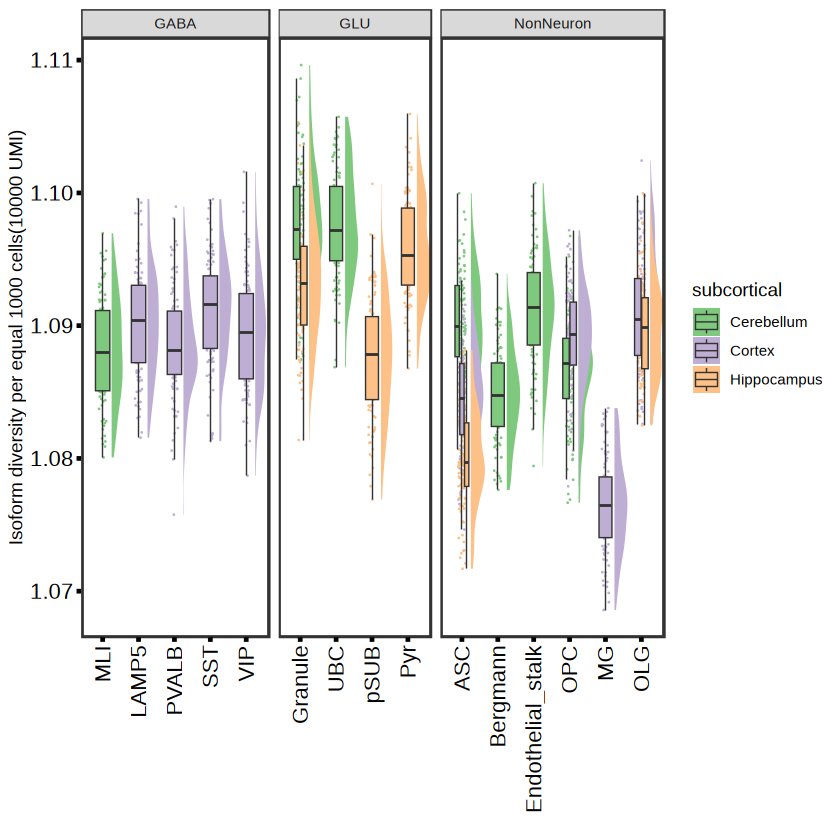

In [376]:
library(gghalves)
cellrdsto$subcortical = MySplit(cellrdsto$group,"-",1)
cellrdsto$subclass = MySplit(cellrdsto$group,"-",2)
cellrdsto = cellrdsto[order(cellrdsto$subcortical,cellrdsto$subclass),]
cellrdsto$subclass = factor(cellrdsto$subclass,levels = unique(cellrdsto$subclass))
pt1.1 = ggplot(cellrdsto,aes(x = subclass, y = mison,fill = subcortical))+
      geom_jitter(shape=21,size=0.5,width=0.1,stroke = 0) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA,linewidth = 0.3) +
      facet_grid(~class,space = "free",scales = "free") +
      theme_bw()+
      theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1,vjust = 0.5),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_brewer(palette = "Accent") + 
    ylab("Isoform diversity per equal 1000 cells(10000 UMI)") + xlab("")

# pt1.2 = ggplot(cellrdsto,aes(x = subclass, y = readnum,fill = subcortical)) +
#       geom_jitter(shape=21,size=1,width=0.1) +
#       geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
#       geom_boxplot(width=0.4,size=0.5, outlier.color =NA,linewidth = 0.3) +
#       stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
#                      ref.group = ".all.")  +
#       theme_bw()+
#       theme(panel.grid = element_blank(),
#         panel.border = element_rect(size = 1),
#         axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
#         axis.text.y = element_text(color = "black",size = 13),
#         axis.ticks = element_line(color="black",linewidth = 1)) +
#       #scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + 
#     ylab("Isoform diversity per 10000 cells") + xlab("")

# pt1.3 = ggplot(cellrdsto,aes(x = subclass, y = cellnum,fill = subcortical))+
#       geom_jitter(shape=21,size=0.1,width=0.1) +
#       geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
#       geom_boxplot(width=0.4,size=0.5, outlier.color =NA,linewidth = 0.3) +
#       stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
#                      ref.group = ".all.")  +
#       theme_bw()+
#       theme(panel.grid = element_blank(),
#         panel.border = element_rect(size = 1),
#         axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
#         axis.text.y = element_text(color = "black",size = 13),
#         axis.ticks = element_line(color="black",linewidth = 1)) +
#       #scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + 
#     ylab("Isoform diversity per 10000 cells") + xlab("")
# pt1.1
# pt1.2
# pt1.3
pt1.1
ggexport(pt1.1,filename = "result/figure_revision/cross_region_cmp_isoform_diversity_equally_25_10_28.pdf",
         width = 7,height = 4)
#pt1.1+pt1.2+pt1.3

### DTU analysis for cross region cell

[1] 1445

Warning message in (function (mapping = NULL, data = NULL, stat = "count", position = "stack", :
"Ignoring unknown parameters: `size`"
Warning message:
"The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead."


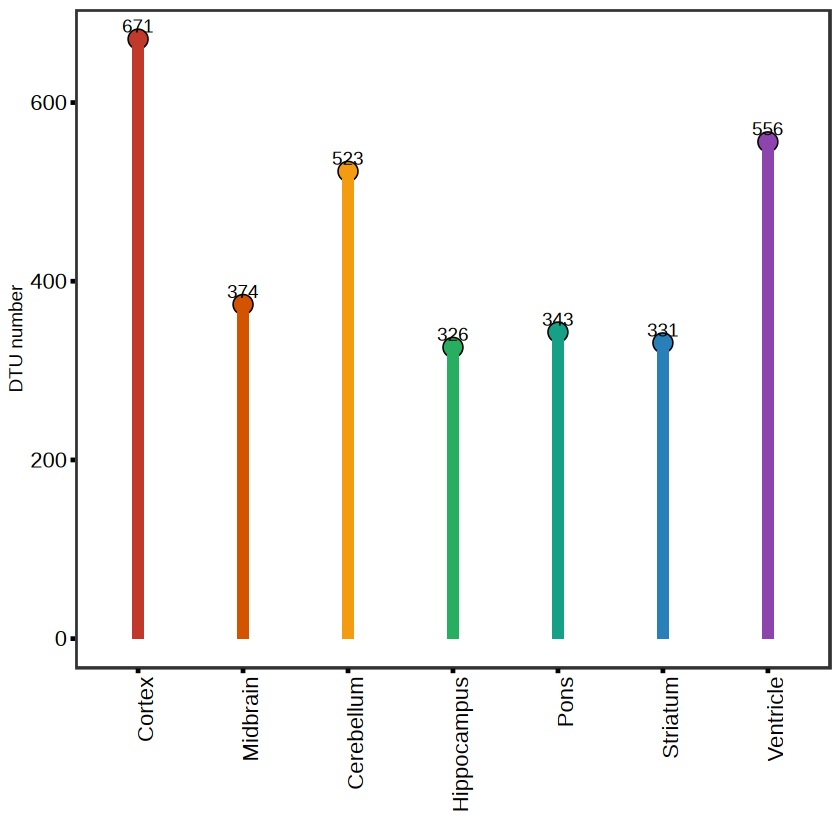

In [5]:
isosig = isosigls$subcortical
isosigf = isosig[isosig$sig != "N" ,]
length(unique(isosigf$gene_id))
#isosigf.st = isosigf %>% group_by(gene_id) %>% filter(length(unique(areatr)) == 1)
isosigf.st = isosigf %>% group_by(areatr) %>% summarise(genenum = length(unique(gene_id)))
isosigf.st$areatr = factor(isosigf.st$areatr,levels = c("Cortex","Midbrain","Cerebellum","Hippocampus",
                                                  "Pons","Striatum","Ventricle"))
p1.1 = ggplot(isosigf.st,
                aes(x= areatr, y=genenum,fill = areatr)) +
  geom_point(aes(fill = areatr),shape=21,size = 5) +
  geom_bar(width=0.1,size=0.5, stat = "identity") +
  geom_text(aes(label = genenum),vjust = -0.5) +
  theme_bw()+
  scale_fill_flatui() + ylab("DTU number") + xlab("") +
  theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1))
p1.1
# ggexport(p1.1,filename = "result/figure6_other_cmp/isosig_stat_otheregion_25_12_08.pdf",width = 3,height = 4)

file saved to result/figure_revision/cross_region_cellan_gene_qc_show_barplot_25_11_05.pdf



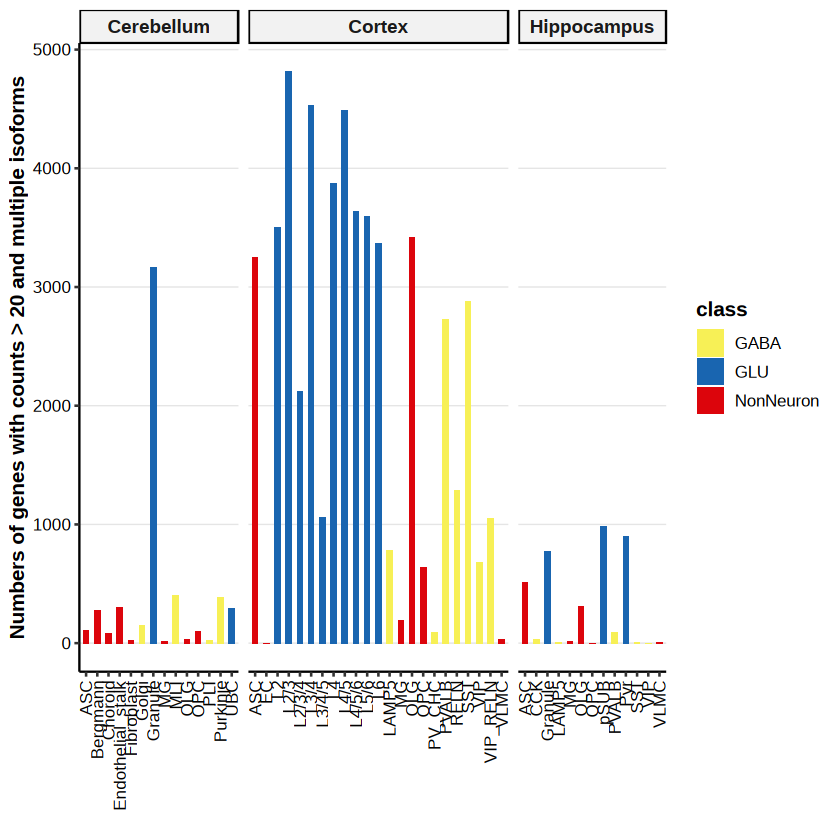

In [169]:
#qc for explain the difficulty to detect cell type level isoform different
# subst = fsraw.cor.sub %>% group_by(gene_id,class,subcortical, subclass) %>% 
#         summarise(count = length(unique(readid)),transnum = length(unique(transcript_id)))
# substm = subst[subst$count > 20 & subst$transnum > 1,] %>% 
#         group_by(class,subcortical, subclass) %>% summarise(genenumber = length(unique(gene_id)))

p1.0 = ggplot(substm, aes(x = subclass, y = genenumber, fill = class)) + 
      geom_bar(stat = "identity",width = 0.5) + 
      facet_grid( ~ subcortical, scales = "free",space = "free") + 
      scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + # 使用Brewer配色
      theme_pubr() + 
      theme(
        axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 10),
        axis.text.y = element_text(size = 10),
        axis.title = element_text(face = "bold", size = 12),
        strip.text = element_text(face = "bold", size = 11), # 分面标签
        legend.position = "right",
        legend.title = element_text(face = "bold"),
        panel.grid.major.y = element_line(color = "gray90", size = 0.3) # 添加横向网格线
      ) + 
      xlab("") + 
      ylab("Numbers of genes with counts > 20 and multiple isoforms")
p1.0
ggexport(p1.0,filename = "result/figure_revision/cross_region_cellan_gene_qc_show_barplot_25_11_05.pdf",width = 7,height = 5)

In [7]:
#calculate isosigi
FullLengthTranSt = function(fs.info,threld){
      transt = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transt = transt[transt$areatr != "" &
                          !is.na(transt$areatr),]

        transt$relative = transt$count/transt$genecount
        #transtf = transt[transt$count > 5,]
        transtf = transt[transt$genecount > threld,]
        transtf = transtf %>% group_by(transcript_id) %>% 
          mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1))
        transtf = transtf[which(transtf$meanrelative > 0.05),]
    
        arean = length(unique(transtf$areatr))
    
        #areanth = arean*(1/3)
       # print(areanth)
        transtf = transtf %>% group_by(transcript_id) %>% 
           filter(length(unique(areatr)) > 1)
        transtf = transtf %>% group_by(gene_id) %>% 
          filter(length(unique(transcript_id))>1)
        
        # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
        transtf$dr = transtf$relative - transtf$otherrelative
      return(transtf)
}
    
#layer


CalSigIsoform = function(transtf){
    transtf$sig = "N"
    table(transtf$sig)
    
    #transtf$pvalue = 1
    MyChiqTest = function(transcript_id, areatr, count){
      dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                       count = count)
      dat = dcast(dat, areatr~transcript_id,
                  value.var = "count",
                  fun.aggregate = sum)
      rownames(dat) = dat$areatr;dat = dat[-1]
      p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                   error = function(e) NA)
      return(p)
    }
    pvdf = transtf %>% group_by(gene_id) %>% summarise(pvalue = MyChiqTest(transcript_id, areatr, count))
    pvdf$padj = p.adjust(pvdf$pvalue,method = "BH")
    transtf = merge(transtf,pvdf,by = "gene_id")
    #print(head(transtf))
    # table(transtf[transtf$padj < 0.05,]$sig)
    #transtf[transtf$padj < 0.05,]$sig = "Y"
    transtf[which(transtf$dr > 0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Up"
    transtf[which(transtf$dr < -0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Down"
    return(transtf)
}


In [104]:
#try inner subregion DTU analysis
fsraw.cor.sub = fsraw.cor.sub[fsraw.cor.sub$subclass != "",]
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",
                              fsraw.cor.sub$class,"-",
                              fsraw.cor.sub$subclass)
transt = FullLengthTranSt(fsraw.cor.sub,20)
qsave(transt,file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
# isosig.sc = CalSigIsoform(transt)
# head(isosig.sc)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [78]:
#subcortical dtu stat
#transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$subclass
transt.hp.sub = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",],threld)
transt.cb.sub = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",],threld)
isosig.hp.sub = CalSigIsoform(transt.hp.sub)
isosig.cb.sub = CalSigIsoform(transt.cb.sub)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 493 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "ABCF1"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 492 remaining warnings."
Warning message:
"There were 357 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAMDC"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 356 remaining warnings."


file saved to result/figure_revision/dtu_number_stat_subclass_stat_total_hippocampus_25_11_04.pdf



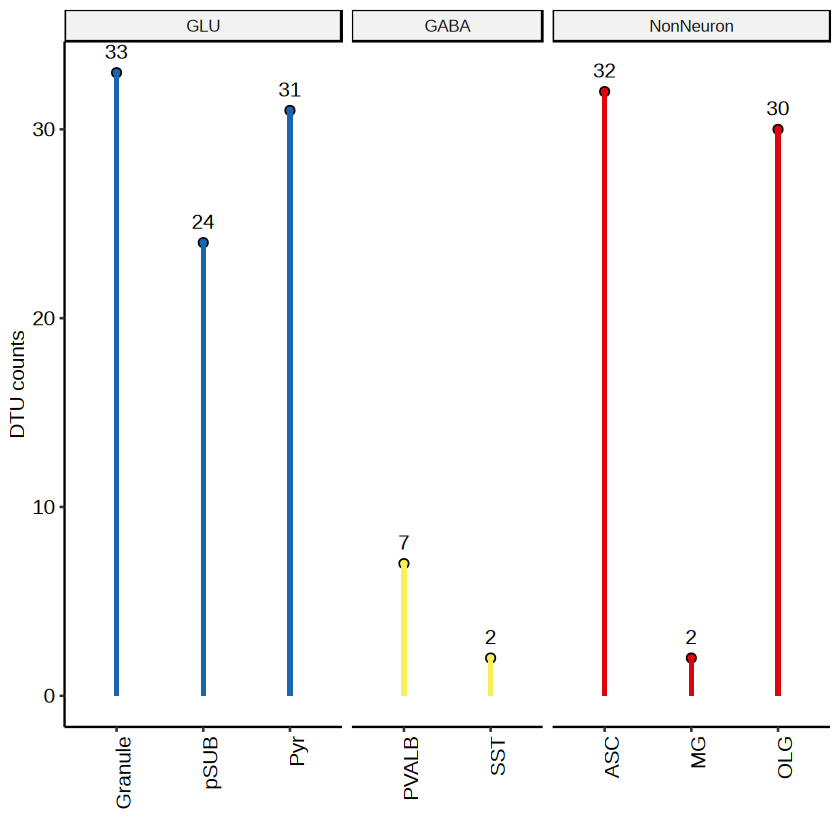

file saved to result/figure_revision/dtu_number_stat_subclass_stat_total_cerebellum_25_11_04.pdf



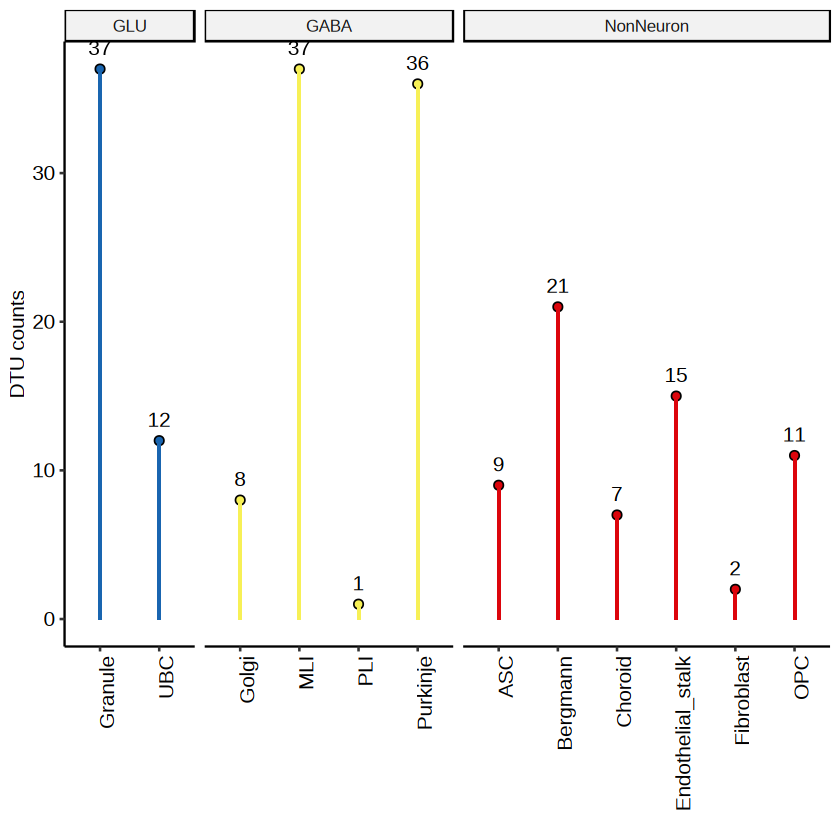

In [83]:
isosigi = isosig.hp.sub
isosigi = isosigi[isosigi$sig != "N",]
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdfg$class = factor(dtustdfg$class,levels = c("GLU","GABA","NonNeuron"))
pison1 = ggplot(data = dtustdfg,aes(x = areatr,y = count,fill = class))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~class,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    scale_color_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
    xlab("") + ylab("DTU counts")
pison1

ggexport(pison1,filename = "result/figure_revision/dtu_number_stat_subclass_stat_total_hippocampus_25_11_04.pdf",
         width = 4,height = 3)

isosigi = isosig.cb.sub
isosigi = isosigi[isosigi$sig != "N",]
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdfg$class = factor(dtustdfg$class,levels = c("GLU","GABA","NonNeuron"))
pison2 = ggplot(data = dtustdfg,aes(x = areatr,y = count,fill = class))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~class,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    scale_color_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
    xlab("") + ylab("DTU counts")
pison2

ggexport(pison2,filename = "result/figure_revision/dtu_number_stat_subclass_stat_total_cerebellum_25_11_04.pdf",
         width = 4,height = 3)

In [309]:
#subcortical dtu stat
#transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$subcortical
transt.glu = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$class == "GLU",],threld)
transt.gaba = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$class == "GABA",],threld)
transt.nn = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$class == "NonNeuron",],threld)
isosig.glu = CalSigIsoform(transt.glu)
isosig.gaba = CalSigIsoform(transt.gaba)
isosig.nn = CalSigIsoform(transt.nn)
isosig.glu$group = "GLU"
isosig.gaba$group = "GABA"
isosig.nn$group = "NonNeuron"

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 1303 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 1302 remaining warnings."
Warning message:
"There were 508 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 2: `gene_id = "ABAT"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 507 remain

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


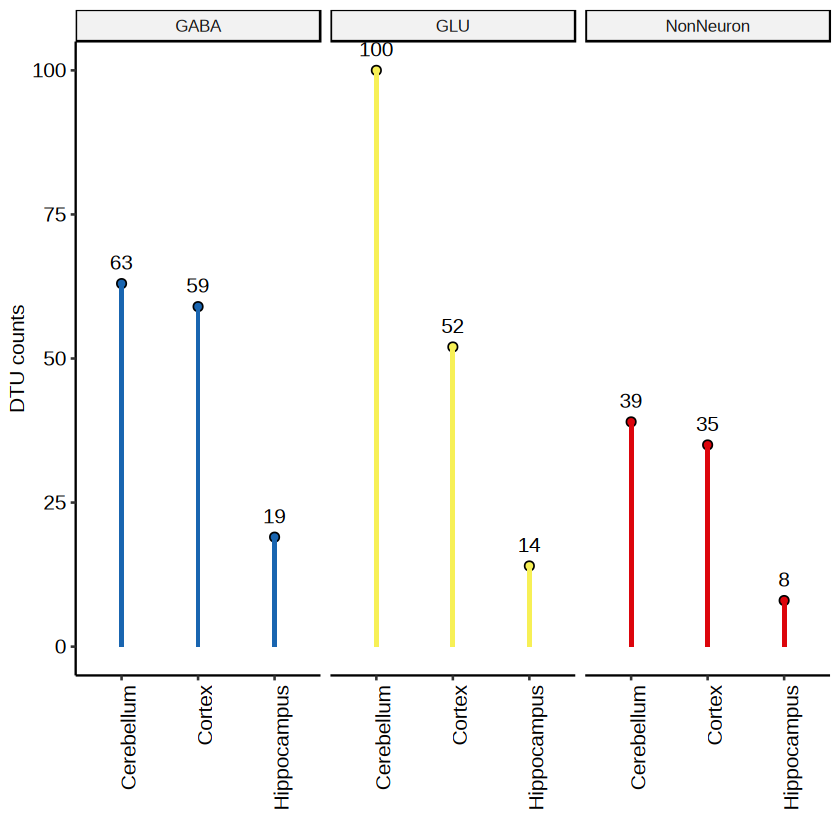

In [326]:
isosigi = rbind(isosig.glu,isosig.gaba,isosig.nn)
isosigi = isosigi %>% group_by(transcript_id,areatr) %>% filter(length(unique(group)) > 2)
isosigi = isosigi[isosigi$sig != "N",]
dtustdfg = isosigi %>% group_by(areatr,group) %>% summarise(count = length(unique(gene_id)))
#dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdfg$class = factor(dtustdfg$group,levels = c("GLU","GABA","NonNeuron"))
pison1 = ggplot(data = dtustdfg,aes(x = areatr,y = count,fill = group))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~group,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    scale_color_manual(values = c('#1965B0',"#F7F056",'#DC050C')) +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
    xlab("") + ylab("DTU counts")
pison1

library(ggvenn)


In [546]:
library(circlize)
col_fun = colorRamp2(c(-0.4,-0.1, 0,0.1, 0.4), hcl_palette = "RdBu",reverse = T)

isosigi = isosig.hp.sub
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
isosigi = isosig.hp.sub[isosig.hp.sub$transcript_id %in% hubtrans,]
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isomx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$gene_id;isomx = isomx[,-1]
isomx = isomx[,colSums(isomx != 0) > 10]
nrow(isomx)
annoid = c("DBNDD2","TUBA8","CDC42","GRIA2","CALB1","YWHAH","C7H14orf132")
#df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))


pht1 = Heatmap(isomx,name = "Delta u",
               row_km = 7,
               right_annotation = ha,row_names_side = "left",
              #row_km = 5,
              show_row_names = F,border = TRUE,
              #row_split = split,
              #column_split = col_groups,
              #top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht1
ggexport(pht1,filename = "result/figure_revision/subcortical_hp_cell_subclass_DTU_heatmap_25_11_04.pdf",width = 5,height = 6)


[1] 67

Warning message:
"The input is a data frame-like object, convert it to a matrix."


pdf 
  2

file saved to result/figure_revision/subcortical_hp_cell_subclass_DTU_heatmap_25_11_04.pdf



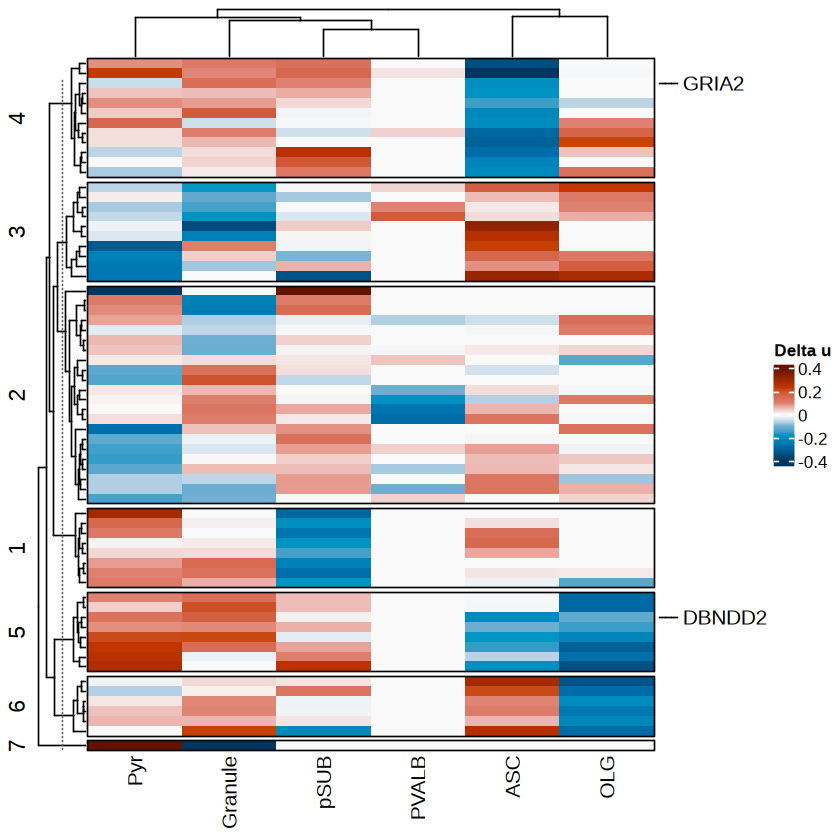

In [550]:
pht1
ggexport(pht1,filename = "result/figure_revision/subcortical_hp_cell_subclass_DTU_heatmap_25_11_04.pdf",width = 5,height = 6)

[1] 81

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cb_cell_subclass_DTU_heatmap_25_11_04.pdf



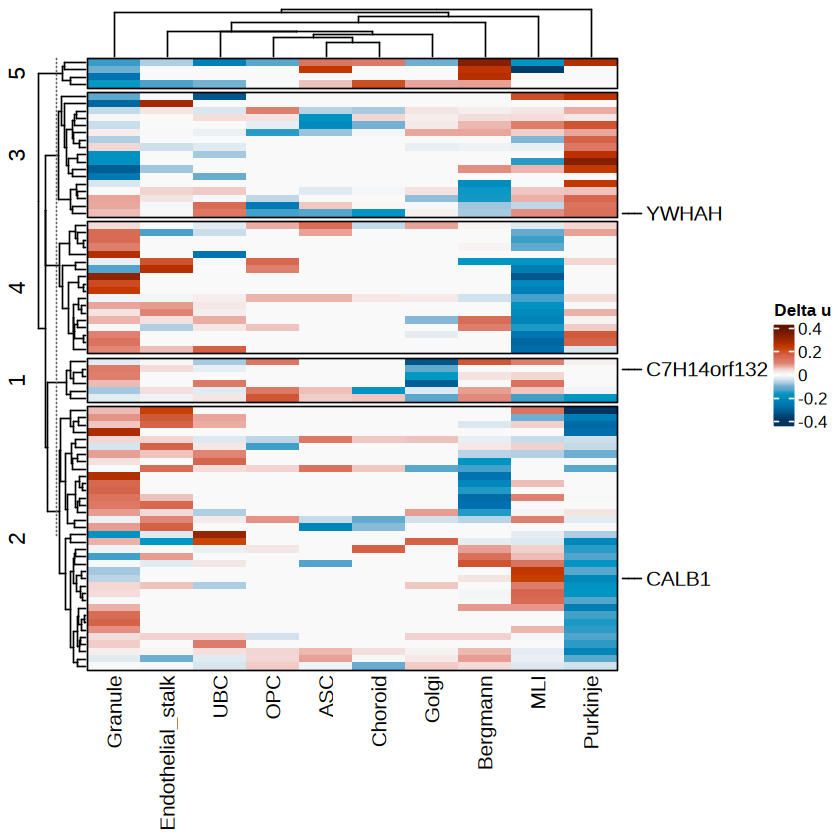

In [551]:
isosigi = isosig.cb.sub
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
isosigi = isosig.cb.sub[isosig.cb.sub$transcript_id %in% hubtrans,]
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isomx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$gene_id;isomx = isomx[,-1]
isomx = isomx[,colSums(isomx != 0) > 10]
nrow(isomx)
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))

In [571]:
threld = 20
fsraw.cor.sub$areatr = fsraw.cor.sub$class
transt.hp.cl = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",],threld)
transt.cb.cl = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",],threld)
isosig.hp.cl = CalSigIsoform(transt.hp.cl)
isosig.cb.cl = CalSigIsoform(transt.cb.cl)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 402 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAMDC"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 401 remaining warnings."
Warning message:
"There were 605 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 2: `gene_id = "ABAT"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 604 remaining warnings."


Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cb_cell_subclass_DTU_heatmap_25_11_04.pdf



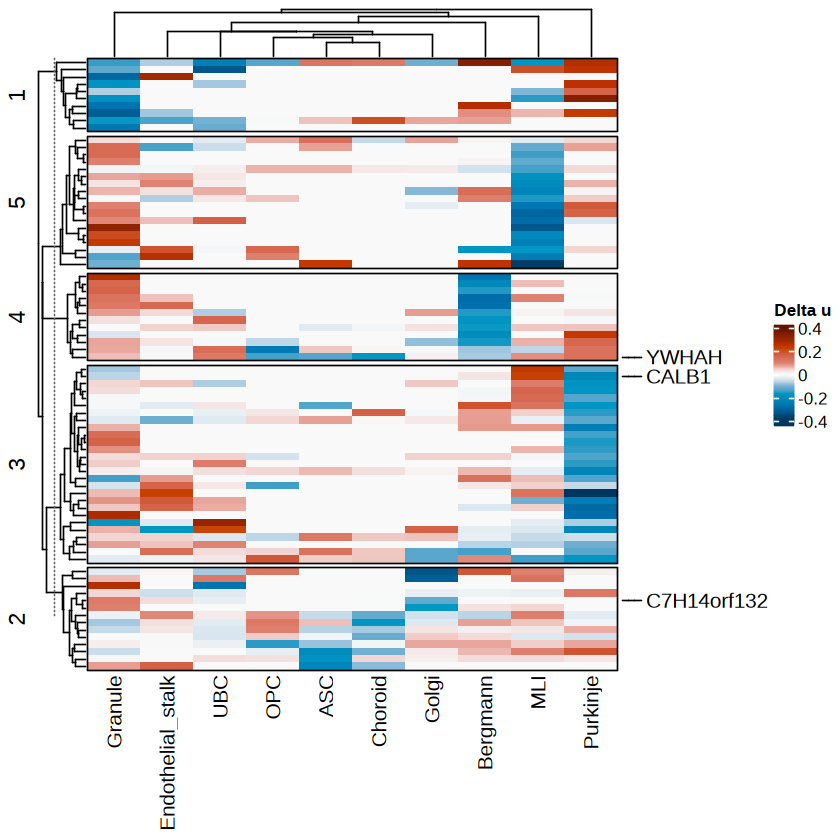

In [557]:
pht2 = Heatmap(isomx,name = "Delta u",
              row_km = 5,
              show_row_names = F,border = TRUE,
              #row_split = split,
              #column_split = col_groups,
              #top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
               right_annotation = ha,row_names_side = "left",
              column_gap = unit(2, "mm"))
pht2

ggexport(pht2,filename = "result/figure_revision/subcortical_cb_cell_subclass_DTU_heatmap_25_11_04.pdf",width = 5,height = 6)

In [374]:
threld = 20
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",fsraw.cor.sub$class)
transt.cl = FullLengthTranSt(fsraw.cor.sub,threld)
isosig.cl = CalSigIsoform(transt.cl)
isosig.cl

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2630 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2629 remaining warnings."


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
AAAS,AAAS-FS-1,Cerebellum-GLU,5,29,0.17241379,0.1011077,0.07733900,0.0950747922,N,0.2055856,0.3354159
AAAS,AAAS-FS-1,Cortex-GABA,6,55,0.10909091,0.1011077,0.09844663,0.0106442802,N,0.2055856,0.3354159
AAAS,AAAS-FS-1,Cortex-GLU,15,234,0.06410256,0.1011077,0.11344274,-0.0493401798,N,0.2055856,0.3354159
AAAS,AAAS-FS-1,Cortex-NonNeuron,2,34,0.05882353,0.1011077,0.11520242,-0.0563788927,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cerebellum-GLU,22,29,0.75862069,0.8311447,0.85531941,-0.0966987186,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cortex-GABA,47,55,0.85454545,0.8311447,0.82334449,0.0312009679,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cortex-GLU,194,234,0.82905983,0.8311447,0.83183970,-0.0027798661,N,0.2055856,0.3354159
AAAS,XM_005571000.2,Cortex-NonNeuron,30,34,0.88235294,0.8311447,0.81407532,0.0682776168,N,0.2055856,0.3354159
AACS,NM_001284010.1,Cerebellum-GLU,55,65,0.84615385,0.8286517,0.82427615,0.0218776914,N,0.2239977,0.3575931


Warning message:
"The input is a data frame-like object, convert it to a matrix."


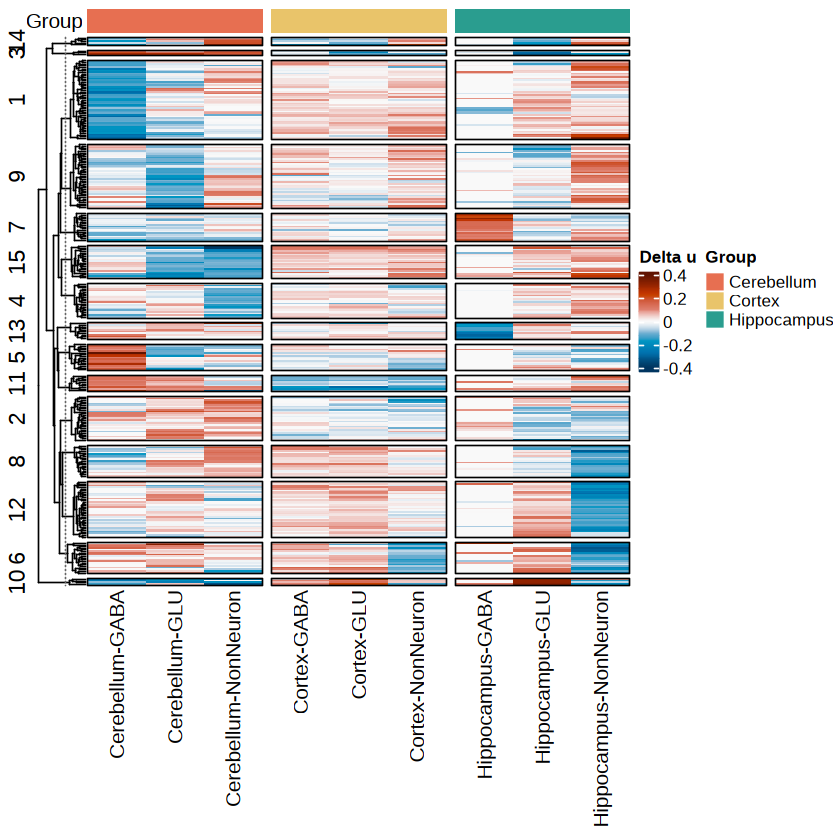

In [ ]:

isosigi = isosig.cl
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
isosigi = isosig.cl[isosig.cl$transcript_id %in% hubtrans,]

isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isomx = dcast(isosigi,gene_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$gene_id;isomx = isomx[,-1]
isomx = isomx[(rowSums(isomx[,1:3] != 0) > 1) & (rowSums(isomx[,4:6] != 0) > 1) & (rowSums(isomx[,7:9] != 0) > 1),]
col_groups <- MySplit(colnames(isomx),"-",1)
library(circlize)
#col_groups <- sapply(strsplit(colnames(isomx), "-"), function(x) x[1])

top_annotation <- HeatmapAnnotation(
  Group = col_groups,
  col = list(Group = c("Cerebellum" = "#e76f51", "Cortex" = "#e9c46a", "Hippocampus" = "#2a9d8f")),
  annotation_name_side = "left"
)
col_fun = colorRamp2(c(-0.4,-0.1, 0,0.1, 0.4), hcl_palette = "RdBu",reverse = T)
n = 15
fit = kmeans(isomx,n)
split <- factor(as.character(fit$cluster), levels=as.character(c(1:n)))

pht = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,
              row_split = split,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht
#ggexport(pht,filename = "result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_25_11_04.pdf",width = 6,height = 8)

Warning message:
"The input is a data frame-like object, convert it to a matrix."


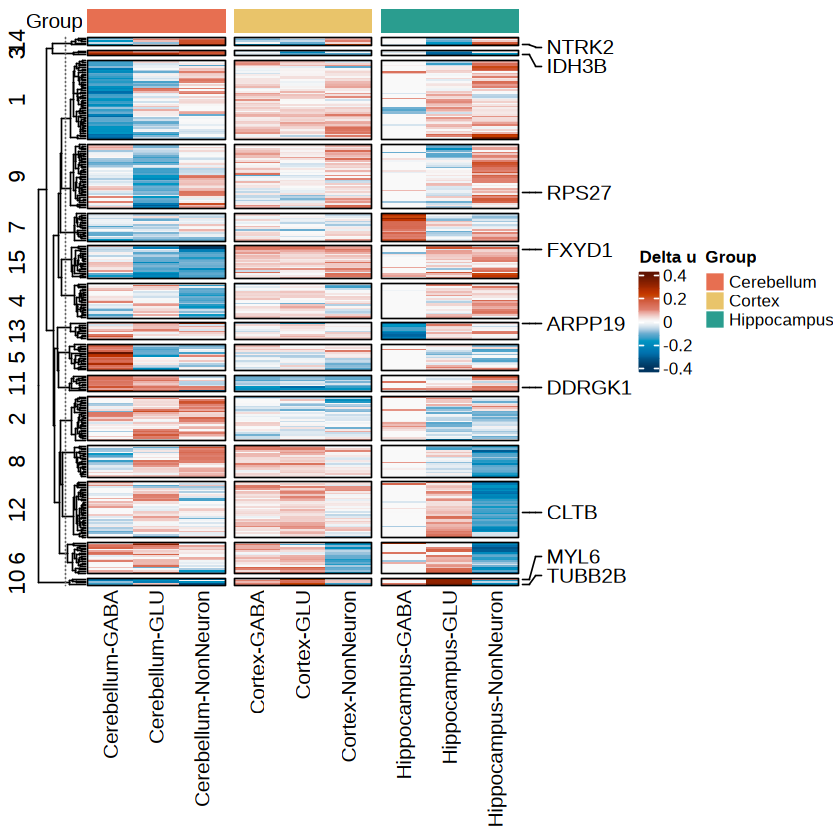

In [404]:
annoid = c("ARPP19","ARPP21","DDRGK1","RPS27","PPP3CB","IDH3B","SYNGR1","FXYD1","EPB41",
           "PDHA1","SLC8A1","RPL7A","NTRK2","TUBB2B","CLTB","MYL6")
#df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))
pht = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,
              row_split = split,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              right_annotation = ha,row_names_side = "left",
              column_gap = unit(2, "mm"))
pht


Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure6_other_cmp/sigiso_subcortical_class_DTU_cluster_heatmap_clone_25_11_06.pdf



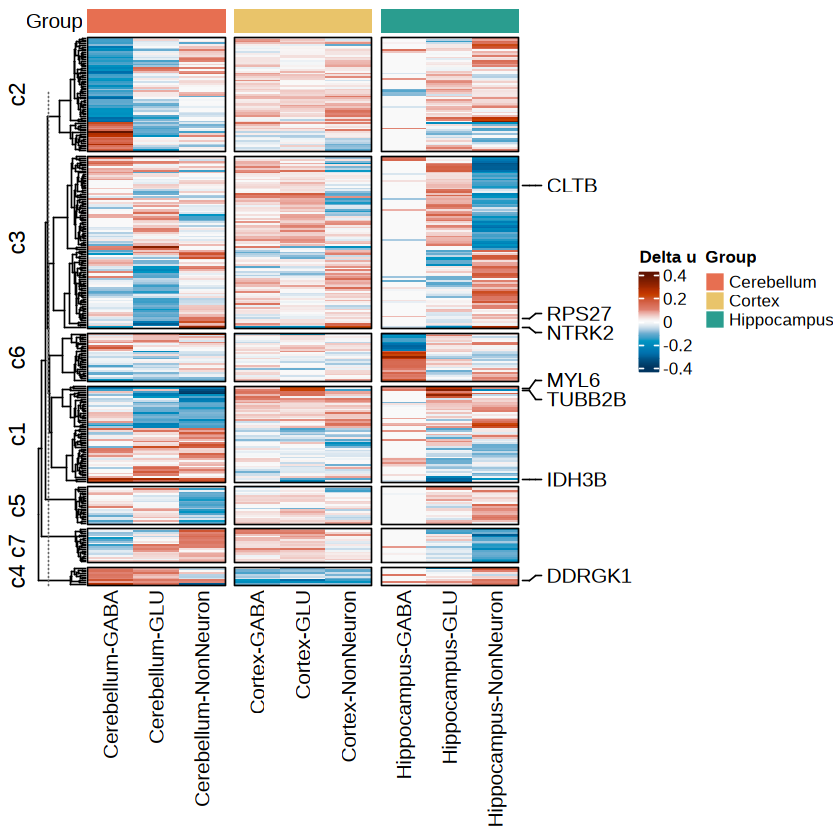

In [433]:
clist = list("c1" = c(10,3,15,2),"c2" = c(1,5),"c3" = c(9,14,6,12),"c4" = c(11),
             "c5" = c(4),
             "c6" = c(13,7),"c7" = c(8))

MergeCluster = function(htls,clist){
  #merge cluster
  split = as.character(htls$rowcluster)
  for (i in 1:length(clist)) {
    split[which(as.character(split) %in% as.character(clist[[i]]))] = names(clist)[i]
  }
  # 
  split = factor(as.character(split), levels = names(clist))
  names(split) = names(htls$rowcluster)
  reorder.hmap = Heatmap(htls$ht@matrix, 
                         name = "delta Isoform\n ratio",
                         row_split = split,
                         # cluster_rows = F,
                         cluster_columns = F,
                         cluster_row_slices = FALSE,
                         #cluster_column_slices = FALSE,
                         show_row_names = F,
                         col = colorRamp2(c(-0.4,0,0.4), 
                                          c("#08306B", "white", "red")),
                         column_order = htls$colorder
  )
  reorder.hmap
  htls$rowcluster = split
  htls$ht = reorder.hmap
  return(htls)
}
htls = list(rowcluster = split,ht = pht)
htls = MergeCluster(htls,clist)
htmx = htls$ht@matrix

annoid = c("DDRGK1","RPS27","IDH3B","SYNGR1","NTRK2","TUBB2B","CLTB","MYL6")
#df_numeric = df_numeric[,colorder]
ha = rowAnnotation(foo =  anno_mark(at = which(rownames(isomx) %in% annoid), 
                                    labels = rownames(isomx)[which(rownames(isomx) %in% annoid)]))

pht2 = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,
               right_annotation = ha,row_names_side = "left",
              #row_km = 15,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"),
              row_split = htls$rowcluster)
pht2
ggexport(pht2,filename = "result/figure6_other_cmp/sigiso_subcortical_class_DTU_cluster_heatmap_clone_25_11_06.pdf",
         width =7,height = 7)

### Isoform similarity compare

In [8]:
#fsraw.cor$areatr = fsraw.cor$subcortical
# fsraw.cor.sub[fsraw.cor.sub$areatr != "Cortex",]$areatr = paste0(fsraw.cor.sub[fsraw.cor.sub$areatr != "Cortex",]$subcortical,
#                                                                 fsraw.cor.sub[fsraw.cor.sub$areatr != "Cortex",]$subclass)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",
                              fsraw.cor.sub$subclass)
transt = FullLengthTranSt(fsraw.cor.sub,20)
isosig.sc = CalSigIsoform(transt)
#only for 
# isosigi = isosig3

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2933 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2932 remaining warnings."


In [108]:
# isosig.sc = CalSigIsoform(transt)
# head(isosig.sc)
# transt$relative = transt$count/transt$genecount
# transt = transt %>% group_by(transcript_id) %>% 
#       mutate(meanrelative = mean(relative),
#              otherrelative = (sum(relative) - relative)/(n() - 1))
# transt$dr = transt$relative - transt$otherrelative

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2929 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2928 remaining warnings."


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,AAAS,AAAS-FS-1,Cerebellum-GLU-Granule,5,29,0.17241379,0.1068386,0.09590945,0.07650435,N,0.1094977,0.182641
2,AAAS,AAAS-FS-1,Cortex-GABA-PVALB,5,32,0.15625000,0.1068386,0.09860341,0.05764659,N,0.1094977,0.182641
3,AAAS,AAAS-FS-1,Cortex-GLU-L2/3,8,43,0.18604651,0.1068386,0.09363733,0.09240918,N,0.1094977,0.182641
4,AAAS,AAAS-FS-1,Cortex-GLU-L3/4,3,50,0.06000000,0.1068386,0.11464508,-0.05464508,N,0.1094977,0.182641
5,AAAS,AAAS-FS-1,Cortex-GLU-L4,1,33,0.03030303,0.1068386,0.11959457,-0.08929154,N,0.1094977,0.182641
6,AAAS,AAAS-FS-1,Cortex-GLU-L4/5/6,2,21,0.09523810,0.1068386,0.10877206,-0.01353397,N,0.1094977,0.182641


In [114]:
#transt$areatr = gsub(transt$areatr,pattern = "Glu",replacement = "GLU")
qsave(isosig.sc,file = "data/cross_region/DTU_ls_subcell_level_25_10_28.qs")
qsave(transt,file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")

#### Correlation issue

In [6]:
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <ce>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <b4>"
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <ce>"
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)' in 'mbcsToSbcs': dot substituted for <b4>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on 'Pearson Correlat

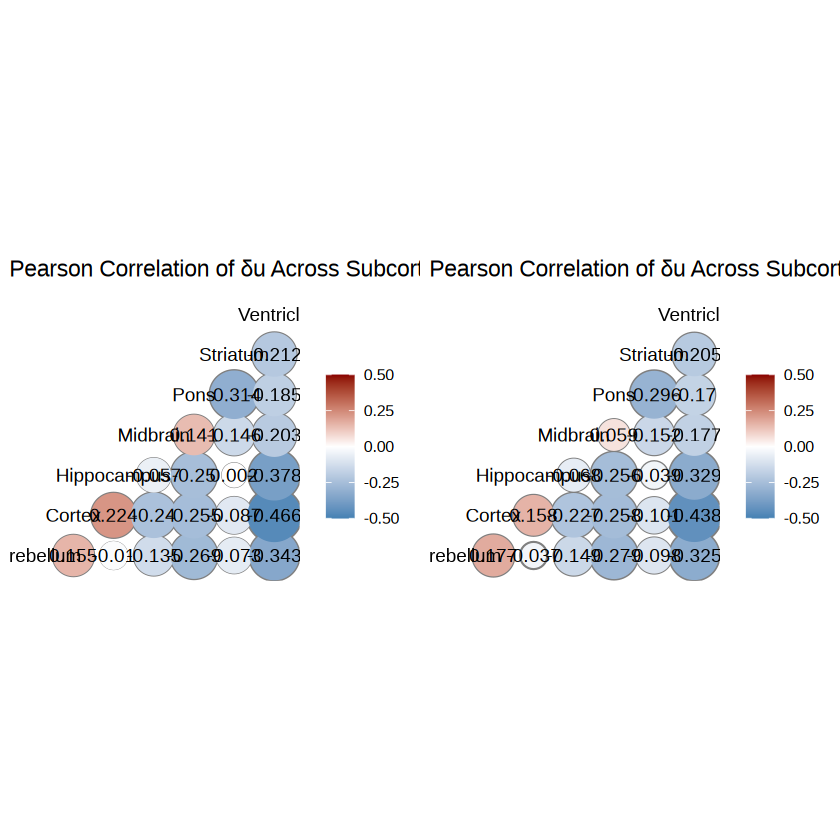

In [38]:
#correlation issue
isosigi = isosigls$subcortical
isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]
#pheatmap(subcor.pr)

pcor1 = GGally::ggcorr(isosigf.mx, 
               label = TRUE,
               limits = c(-0.5,0.5),midpoint = 0,
                      min_size = 6, max_size = 15,label_round = 3,
               method =  c("pairwise", "pearson"), geom = "circle", 
               low = "steelblue", mid = "white", high = "darkred")
pcor1 = pcor1 + ggtitle("Pearson Correlation of δu Across Subcortical Regions (DTU Isoforms)")

isosigi = isosigls$subcortical
#isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]
pcor2 = GGally::ggcorr(isosigf.mx, 
               label = TRUE,
               limits = c(-0.5,0.5),midpoint = 0,
                      min_size = 6, max_size = 15,label_round = 3,
               method =  c("pairwise", "pearson"), geom = "circle", 
               low = "steelblue", mid = "white", high = "darkred")
pcor2 = pcor2 + ggtitle("Pearson Correlation of δu Across Subcortical Regions (All Isoforms)")

# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "relative",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# #isosigf.mx = isosigf.mx[,1:6]
# #isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > 2,]
# pcor3 = GGally::ggcorr(isosigf.mx, 
#                label = TRUE,
#                limits = c(0.5,0.9),midpoint = 0.75,
#                       min_size = 6, max_size = 15,label_round = 3,
#                method =  c("pairwise", "pearson"), geom = "circle", 
#                low = "steelblue", mid = "white", high = "darkred")
# pcor3 = pcor3 + ggtitle("Correlation by u value of all isoform")

# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# #isosigf.mx = isosigf.mx[,1:6]
# #isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0)  > 2,]
# pcor4 = GGally::ggcorr(isosigf.mx, 
#                label = TRUE,
#                limits = c(-0.5,0.5),midpoint = 0,
#                       min_size = 6, max_size = 15,label_round = 3,
#                method =  c("pairwise", "pearson"), geom = "circle", 
#                low = "steelblue", mid = "white", high = "darkred")
# pcor4 = pcor4 + ggtitle("Correlation by u value of all isoform")
pcorls = ggarrange(pcor1,pcor2,nrow = 1,ncol = 2)
pcorls
ggexport(pcorls,filename = "result/figure_revision/cross_region_cor_reason_analysis_25_11_10.pdf",width = 10,height = 5)

In [39]:
table(fsraw.cor.sub$subcortical)


 Cerebellum      Cortex Hippocampus 
    4462461    23441688      998615 

[1] 3551   46

[1] 3643    7

Warning message:
"The input is a data frame-like object, convert it to a matrix."
`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



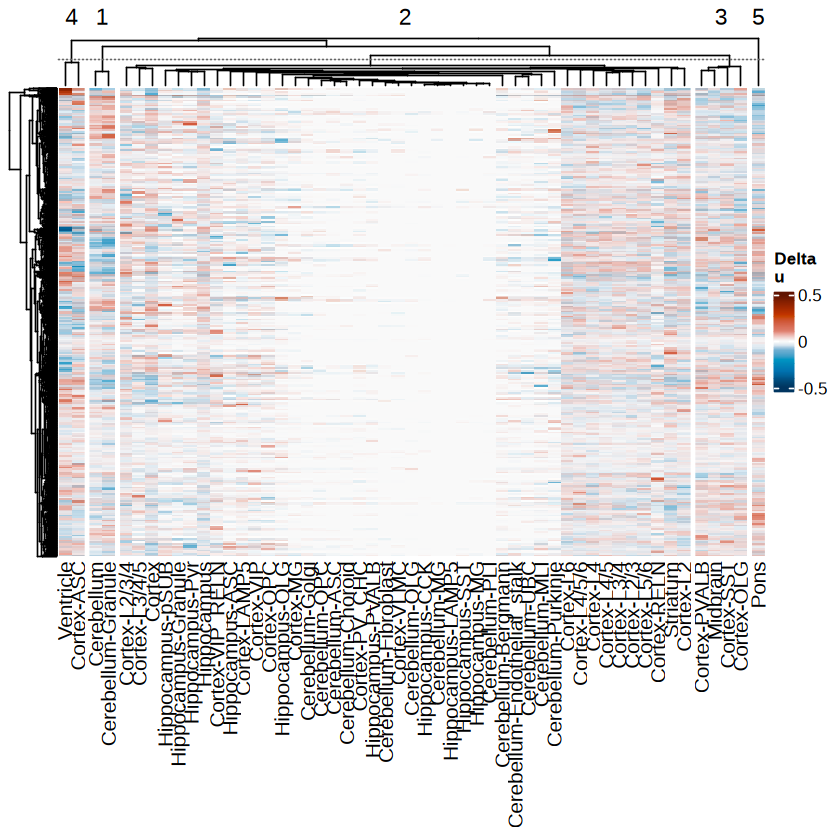

In [31]:
# isosigi = isosigls$subcortical
# #isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "relative",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]
library(circlize)
library(ComplexHeatmap)
isosigi = isosigls$subcortical
#isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx1 = isosigf.mx[rowSums(isosigf.mx != 0) == 7,]

isosigi = transt[transt$transcript_id %in% rownames(isosigf.mx1),]
isosigi = isosigi[!is.na(isosigi$dr),]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx2 = as.data.frame(isosigf.mx)
dim(isosigf.mx2)
dim(isosigf.mx1)
isosigf.mx = cbind(isosigf.mx1[rownames(isosigf.mx2),],isosigf.mx2)
subcor.pr = cor(isosigf.mx)
# subcor.pr[subcor.pr == 1] = NA
library(pheatmap)
library(ComplexHeatmap)
#pdf("result/figure_revision/crossregion_subclass_isoform_heatmap_hubisoform_25_10_28.pdf",width = 8,height = 8)
col_fun = colorRamp2(c(-0.5, -0.1, 0, 0.1, 0.5), hcl_palette = "RdBu",reverse = T)
pht = Heatmap(isosigf.mx,show_row_names = FALSE,column_km = 5,name = "Delta\nu",col = col_fun)
pht
#dev.off()
#cor(isosigf.mx)
# unique(transt$areatr)
# colnames(isosigf.mx)

[1] 122

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/crossregion_class_isoform_heatmap_correlation_25_11_05.pdf



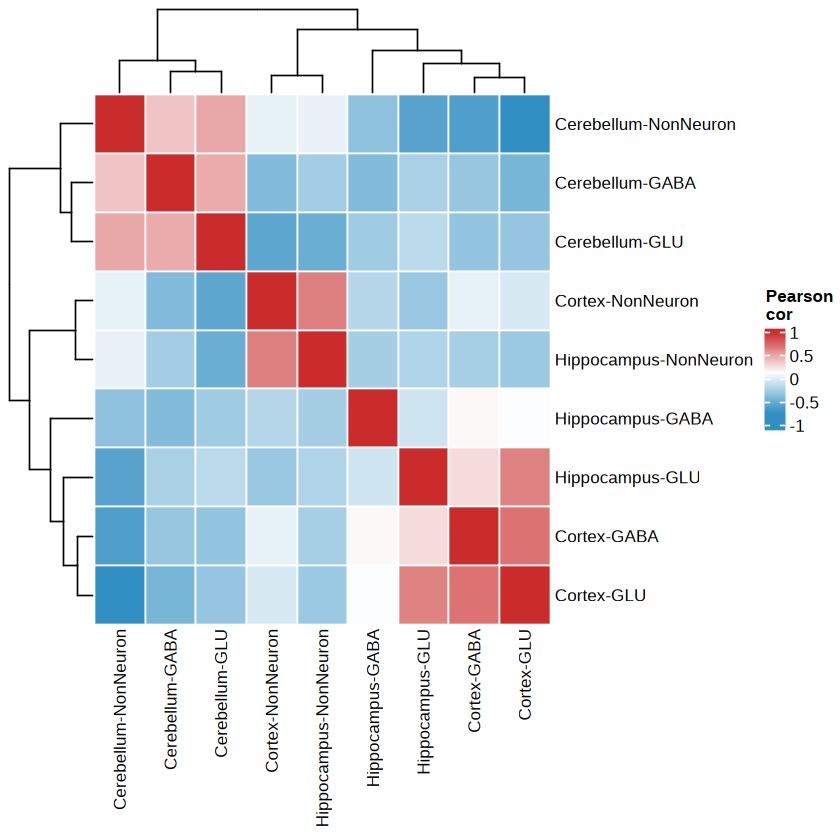

In [241]:
# fsraw.cor.sub = fsraw.cor.sub[fsraw.cor.sub$subclass != "",]
# fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$subclass),]
# fsraw.cor.sub$areatr = paste0(fsraw.cor.sub$subcortical,"-",
#                               fsraw.cor.sub$class)
# transt.cc = FullLengthTranSt(fsraw.cor.sub,20)
# qsave(transt.cc,file = "data/cross_region/transt_subcortical_cell_class_level_25_10_28.qs")
# isosig.cc = CalSigIsoform(transt.cc)


library(circlize)
hubtrans = unique(isosig.cc[isosig.cc$sig != "N",]$transcript_id)
isosigi = transt.cc[transt.cc$transcript_id %in% hubtrans,] %>% 
                    group_by(areatr,gene_id) %>% filter(genecount > 20)
#isosigi = transt.cc %>% group_by(areatr,gene_id) %>% filter(genecount > 20)
#isosigi = isosigi[isosigi$count > 10,]
isosigi = isosigi[!is.na(isosigi$dr),]
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > ncol(isosigf.mx)-1,]
nrow(isosigf.mx)
subcor.pr = cor(isosigf.mx)
library(ComplexHeatmap)
col_fun = colorRamp2(c(-0.5, -0.1, 0, 0.1, 0.5), hcl_palette = "RdBu",reverse = T)
pht = Heatmap(isosigf.mx,show_row_names = FALSE,column_km = 5,name = "Delta\nu",col = col_fun)
pht
pht1 = pheatmap(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white")
pht1
ggexport(pht1,filename = "result/figure_revision/crossregion_class_isoform_heatmap_correlation_25_11_05.pdf",width = 5.7,height = 5)


[1] 2647

[1] 106

Warning message:
"The input is a data frame-like object, convert it to a matrix."
Warning message:
"package 'rstatix' was built under R version 4.3.3"

Attaching package: 'rstatix'


The following object is masked from 'package:AnnotationDbi':

    select


The following object is masked from 'package:IRanges':

    desc


The following object is masked from 'package:stats':

    filter




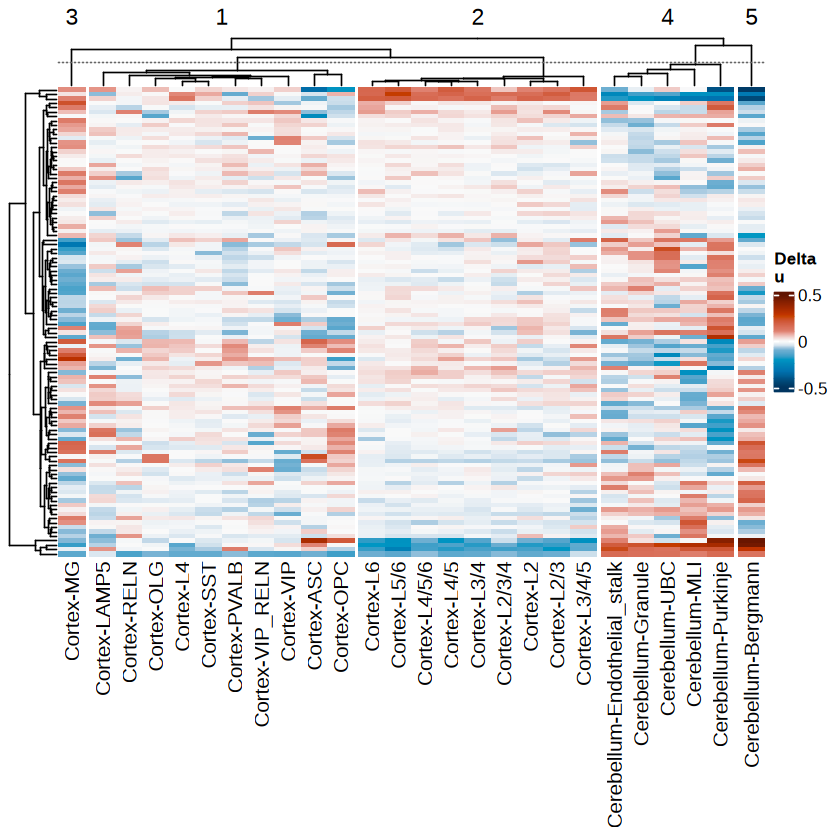

file saved to result/figure_revision/crossregion_subclass_isoform_heatmap_detailed_cerrebellum_25_10_22.pdf



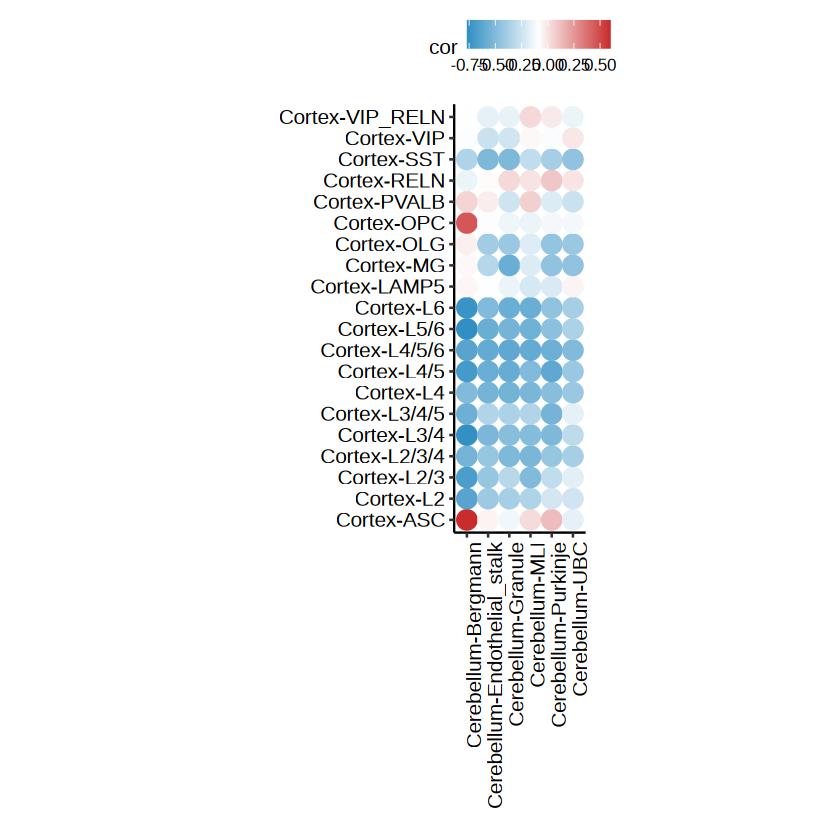

In [40]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt[transt$transcript_id %in% hubtrans,] %>% 
                    group_by(areatr,gene_id) %>% filter(genecount > 10)
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Cerebellum"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
nrow(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
nrow(isosigf.mx)
col_fun = colorRamp2(c(-0.5, -0.1, 0, 0.1, 0.5), hcl_palette = "RdBu",reverse = T)
pht = Heatmap(isosigf.mx,show_row_names = FALSE,column_km = 5,name = "Delta\nu",col = col_fun)
pht

library(rstatix)
subcor.prp = cor_test(isosigf.mx)
#subcor.prp
# subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Cerebellum") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
pht2 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht2
ggexport(pht,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_detailed_cerrebellum_25_10_22.pdf",
        width = 5,height = 8)
# ggexport(pht2,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_cerrebellum_25_10_22.pdf",
#         width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")

[1] 2647

[1] 166

file saved to result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf



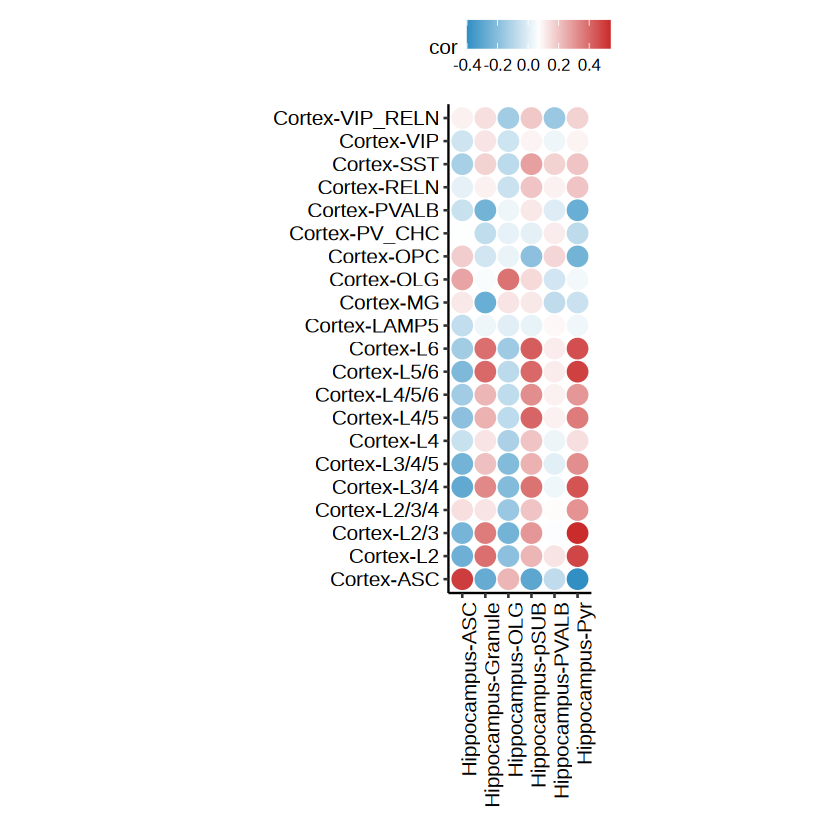

In [385]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt[transt$transcript_id %in% hubtrans,] %>% 
                    group_by(areatr,gene_id) %>% filter(genecount > 10)
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
nrow(isosigf.mx)
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
nrow(isosigf.mx)
library(rstatix)
subcor.prp = cor_test(isosigf.mx)
#subcor.prp
# subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
                      (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
pht3
ggexport(pht3,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf",
        width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")

### MGE and CGE-derived cell compare

[1] 38

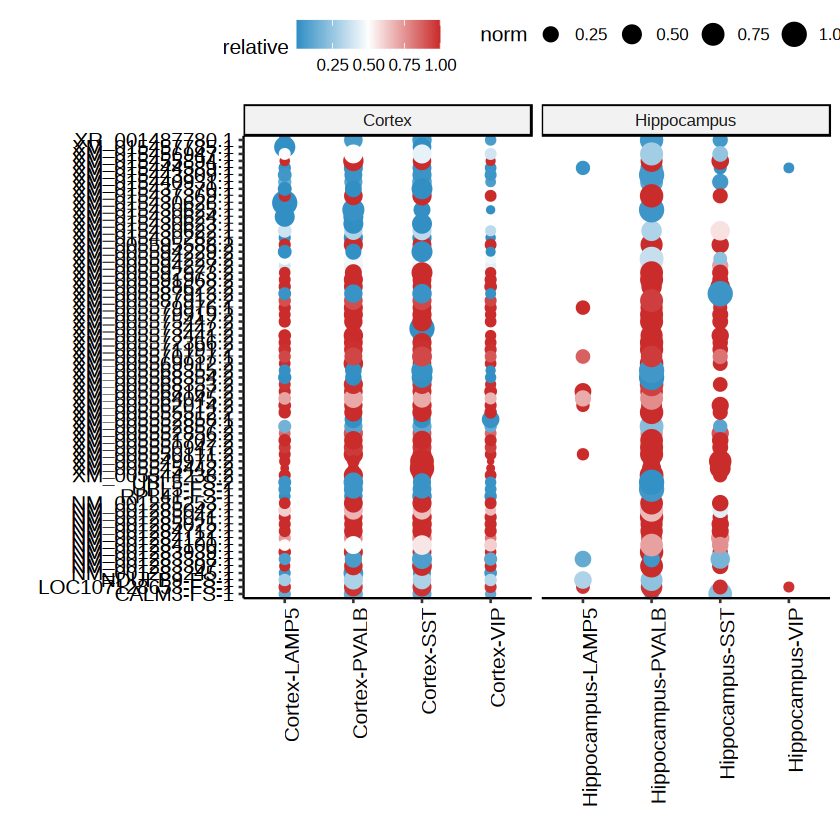

In [11]:
library(circlize)
hubtrans = unique(isosig.sc[isosig.sc$sig != "N",]$transcript_id)
isosigi = transt %>% group_by(areatr,gene_id) %>% filter(genecount > 20)

#isosigi = transt
isosigi = isosigi[!is.na(isosigi$dr),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex","Hippocampus"),]
isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("LAMP5","PVALB","VIP","SST"),]
isosigi = isosigi %>% group_by(gene_id) %>% filter(length(unique(areatr)) > 5)
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 50)
length(unique(isosigi$gene_id))
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi = isosigi %>% group_by(subcortical,gene_id,transcript_id) %>% mutate(norm = count/sum(count))
pt = ggplot(isosigi,aes(x = areatr,y = transcript_id,color = relative,size = norm)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt

# isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
# rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
# isosigf.mx = as.data.frame(isosigf.mx)
# nrow(isosigf.mx)
# isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
# nrow(isosigf.mx)
# library(rstatix)
# subcor.prp = cor_test(isosigf.mx)
# #subcor.prp
# # subcor.pr = cor(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)
# # subcor.pr = cor.test(isosigf.mx);subcor.pr = melt(subcor.pr);subcor.pr$Var1 = as.character(subcor.pr$Var1);subcor.pr$Var2 = as.character(subcor.pr$Var2)

# subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
#                       (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
# pht4 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
#                     scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
#                     theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
#pht4
# ggexport(pht3,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_hippo_25_10_22.pdf",
#         width = 5,height = 8)
# pheatmapht2p(subcor.pr,color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
#                 name = "Pearson\ncor",border_color = "white")


In [238]:
isosigpv = isosigls$subclass
isosigpv = isosigpv[isosigpv$sig != "N",]
isosigpv = isosigpv %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("PVALB")) > 0 & length(unique(areatr)) < 5)
nrow(isosigpv)
hubtrans = unique(isosigpv$transcript_id)
length(hubtrans)

[1] 489

[1] 188

In [252]:
ngscount.hp = read.csv("data/cross_region/total_genecount_df_hippocampus.csv")
head(ngscount.hp)

,gene_id,cell_label,count,x,y
,<chr>,<int>,<int>,<dbl>,<dbl>
1,A2M,23,2,35514.00,80727.00
2,A2M,2005,4,31049.67,80426.67
3,A2M,4076,2,31993.00,82718.00
4,A2M,8465,2,18525.00,74764.00
5,A2M,11034,1,26034.00,78404.00
6,A2M,11678,1,19582.00,74038.00


In [254]:
filcell = unique(ngscount.hp[ngscount.hp$gene_id == "PVALB",]$cell_label)
length(filcell)
filcell2 =.
.unique(fsraw.cor.sub[fsraw.cor.sub$areatr == "Hippocampus-PVALB",]$cell_id)
length(intersect(filcell,filcell2)) 

[1] 582

[1] 66

In [250]:
cellan = unique(fsraw.cor.sub[,c("subcortical","subclass","cell_id")])

In [251]:
#fsraw.cor.sub$subclass2 = fsraw.cor.sub$subclass
cellan$areatr = paste0(cellan$subcortical,"-",cellan$subclass)
table(cellan$areatr)
filcell = fsraw.cor.sub[fsraw.cor.sub$areatr == "Hippocampus-PVALB",]
filcell = unique(filcell[filcell$gene_id == "PVALB",]$cell_id)
length(filcell)
#fsraw.cor.sub = fsraw.cor.sub[fsraw.cor.sub$areatr != "Hippocampus-PVALB" | fsraw.cor.sub$cell_id %in% filcell,]


              Cerebellum-ASC          Cerebellum-Bergmann 
                        1112                         2123 
          Cerebellum-Choroid Cerebellum-Endothelial_stalk 
                         839                         2262 
       Cerebellum-Fibroblast             Cerebellum-Golgi 
                         872                          887 
          Cerebellum-Granule                Cerebellum-MG 
                       22713                          479 
              Cerebellum-MLI               Cerebellum-OLG 
                        3115                          554 
              Cerebellum-OPC               Cerebellum-PLI 
                        1215                          284 
         Cerebellum-Purkinje               Cerebellum-UBC 
                         768                         1579 
                  Cortex-ASC                    Cortex-EC 
                       27040                          106 
                   Cortex-L2                  Cortex-L2

[1] 23

In [9]:
transt = fsraw.cor.sub %>% group_by(areatr) %>% 
        mutate(cellnumt = length(unique(cell_id))) %>%
        group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),cellnum = length(unique(cell_id)),
                 cellprop = cellnum/cellnumt[1])
transt = transt[transt$areatr != "" & !is.na(transt$areatr),]
transt$relative = transt$count/transt$genecount
transt = transt %>% group_by(areatr) %>% mutate(norm = count/sum(count))
transt = transt %>% group_by(transcript_id) %>% 
          mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1))
transtf = transt %>% group_by(transcript_id) %>% 
           filter(length(unique(areatr)) > 1)
transtf = transtf %>% group_by(gene_id) %>% 
          filter(length(unique(transcript_id))>1)
transtf$dr = transtf$relative - transtf$otherrelative

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


[1] "Cortex-ASC"          "Cortex-L2"           "Cortex-L2/3"        
 [4] "Cortex-L2/3/4"       "Cortex-L3/4"         "Cortex-L3/4/5"      
 [7] "Cortex-L4"           "Cortex-L4/5"         "Cortex-L4/5/6"      
[10] "Cortex-L5/6"         "Cortex-L6"           "Cortex-OLG"         
[13] "Cortex-OPC"          "Cortex-PVALB"        "Cortex-RELN"        
[16] "Cortex-SST"          "Cortex-VIP_RELN"     "Hippocampus-Pyr"    
[19] "Hippocampus-pSUB"    "Cortex-LAMP5"        "Hippocampus-ASC"    
[22] "Hippocampus-Granule" "Hippocampus-OLG"     "Cortex-VIP"         
[25] "Cortex-MG"           "Cortex-PV_CHC"       "Hippocampus-CCK"    
[28] "Hippocampus-PVALB"   "Cortex-VLMC"         "Hippocampus-MG"     
[31] "Hippocampus-SST"

[1] 21

[1] 21 24

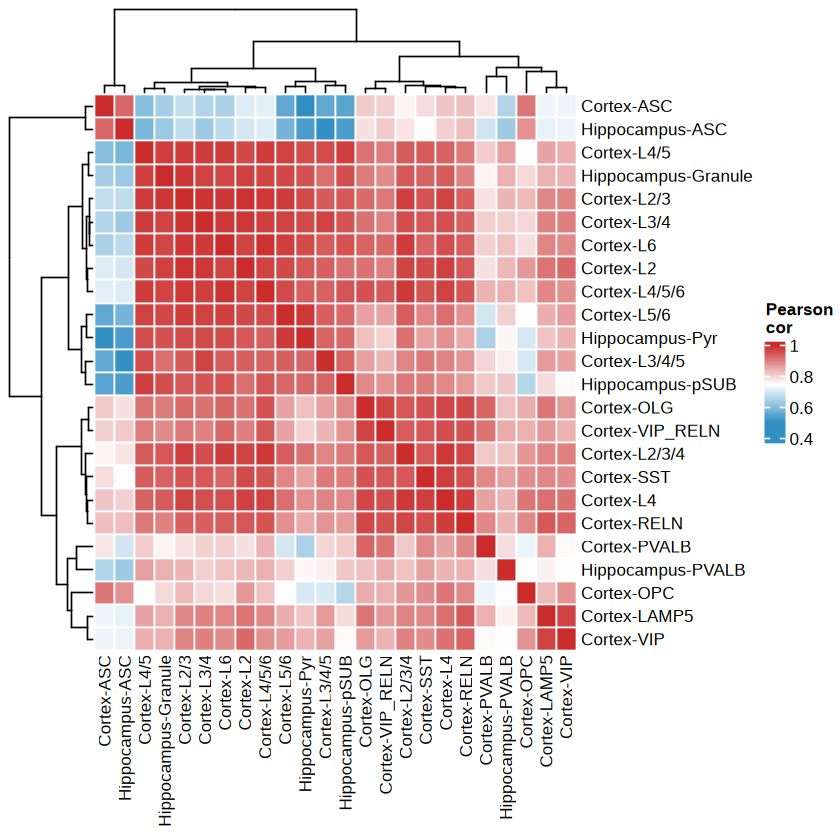

In [114]:
library(circlize)
hubgene = c('SNAP25','SLC17A7','GAD1','CHN1','PVALB','ERBB4','SST','GRIK1','LAMP5','SGCZ','CXCL14','CCK','RELN','ADARB2',
            'VIP','SOX6','PTPRZ1',
             'NELL2','PPFIA2','PROX1','NPY1R',
             'MBP','PLP1','SLC1A3','SLC1A2','APOE','LCAT',
             'KCND2','KCNIP4',
             'ZIC1','CHGB','KLHL1','VCAN',
             'CLDN5','CBLN1','EOMES',
             'TTR','LGI2','GRID2','PCP4','NEFM',
             'CD74','CSF1R','A2M','ATP10A','CGNL1','PTGDS','OGN','GFAP')
isosig.ref = isosigls$subclass
#isosig.ref = isosig.sc
hubtrans = unique(isosig.ref[isosig.ref$sig != "N" & 
                            isosig.ref$areatr %in% c(
                                                     "PV_CHC","PVALB"
                            ),]$transcript_id)
#hubtrans = unique(isosig.ref[isosig.ref$sig != "N",]$transcript_id)
# hubtrans = unique(isosig.ref[isosig.ref$sig != "N" & 
#                             isosig.ref$areatr %in% c(
#                                                      "Cortex-PV_CHC","Cortex-PVALB"
#                                                     #"Hippocampus-PVALB"
#                                                      #"Cortex-SST","Hippocampus-SST"
#                                                      #"Cortex-LAMP5","Cortex-VIP"
#                             ),]$transcript_id)
#length(unique(hubtrans))
isosigi = transtf[transtf$transcript_id %in% hubtrans,]
#isosigi = transt
#isosigi = transtf
#length(unique(isosigi$transcript_id))

#transt
#isosigi = transt %>% group_by(areatr,gene_id) %>% filter(length(unique(transcript_id))>1)
isosigi = isosigi %>% group_by(areatr,transcript_id) %>% filter(genecount > 10)
isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Hippocampus","Cortex"),]
#isosigi = isosigi[!is.na(isosigi$dr),]
#isosigi = isosigi[MySplit(isosigi$areatr,"-",2) %in% c("PVALB","LAMP5","VIP","SST","PV_CHC"),]
unique(isosigi$areatr)
# isosigi = isosigi[MySplit(isosigi$areatr,"-",1) %in% c("Cortex") | 
#                   isosigi$areatr %in% c("Hippocampus-PVALB","Hippocampus-SST","Hippocampus-VIP"),]
# isosigi = isosigi[isosigi$areatr %in% c("Hippocampus-PVALB","Hippocampus-SST","Hippocampus-LAMP5",
#                                        "Cortex-PVALB","Cortex-SST","Cortex-LAMP5","Cortex-VIP"),]
              # isosigi$areatr %in% c("Hippocampus-PVALB"),]
#isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(gene_id)) > 100)
#isosigi$subclass = MySplit(isosigi$areatr,"-",2)
#length(unique(isosigi$transcript_id))
isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Hippocampus-PVALB")) > 0)
length(unique(isosigi$transcript_id))
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Cortex-PVALB","Hippocampus-PVALB")) > 1 | 
#                                                         sum(areatr %in% c("Cortex-SST","Hippocampus-SST")) > 1)
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% c("Hippocampus-PVALB",
#                                                                            "Hippocampus-LAMP5",
#                                                                            "Hippocampus-VIP",
#                                                                           "Hippocampus-SST")) > 3)
# isosigi = isosigi %>% group_by(transcript_id) %>% filter(sum(areatr %in% 
#                                                              c("Hippocampus-PVALB")) > 0)
#length(unique(isosigi$transcript_id))
#isosigi
isosigi$transcript_id = paste0(isosigi$gene_id,"-",isosigi$transcript_id)
isosigf.mx = dcast(isosigi,transcript_id~areatr,value.var = "relative",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
isosigf.mx = as.data.frame(isosigf.mx)
#nrow(isosigf.mx)
isosigf.mx = isosigf.mx[ ,colSums(isosigf.mx != 0) >  20]
isosigf.mx = isosigf.mx[rowSums(isosigf.mx != 0) > (ncol(isosigf.mx) - 1),]
dim(isosigf.mx)
#nrow(isosigf.mx)
# library(rstatix)
# subcor.prp = cor_test(isosigf.mx)
# subcor.prp = subcor.prp[(MySplit(subcor.prp$var1,"-",1) == "Hippocampus") &
#                       (MySplit(subcor.prp$var2,"-",1) == "Cortex"),]
#subcor.prp = subcor.prp[subcor.prp$cor > 0.9,]
# pht3 = ggplot(subcor.prp,aes(x = var1,y = var2,color = cor)) + geom_point(size = 5) + theme_pubr() + 
#                     scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) +
#                     theme(axis.text.x = element_text(angle = 90,hjust = 1)) + coord_fixed() + xlab("") + ylab("")
# pht3
library(ComplexHeatmap)
# pht = Heatmap(cor(isosigf.mx))
# pht
pht1 = pheatmap(cor(isosigf.mx),color = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200),
                name = "Pearson\ncor",border_color = "white",clustering_method = "ward.D2")
pht1
ggexport(pht1,filename = "result/figure_revision/crossregion_subclass_isoform_heatmap_correlation_PVALB_25_11_17.pdf",width = 8,height = 7)


## Region isoform shift DTU diger

In [3]:
#sp cases plot
pref = qread("../ref/area_figure_an.qs")
subcoran = unique(fsraw.cor[,c("region","subcortical")])
edgesdf = pref$areaedges
edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
library(randomcoloR)
mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
names(mycolor) = unique(edgesdf$subcortical)

SpCasePlot = function(fsraw.cor,geneex,hubtrans,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    # hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]

    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      theme_void() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()  + ggtitle(geneex)
    return(pmkpti1)
}



ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': object 'fsraw.cor' not found


In [6]:
#shiftgcl
shiftgcl = read.csv(file = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.csv")
nrow(shiftgcl)
shiftgcl[shiftgcl$cluster == "c4",]

[1] 375

,gene_id,cluster
,<chr>,<chr>
2,ACLY,c4
29,C15H9orf142,c4
37,C7H14orf119,c4
73,DDX19B,c4
88,ELMO1,c4
105,FBXO8,c4
107,FNDC4,c4
109,FRMD3,c4
137,KIAA1586,c4


In [106]:
isosigi2 = isosigls$subcortical
isosigi2[isosigi2$transcript_id == "XM_005563216.2",]
isosigi2.hub = isosigi2[isosigi2$gene_id %in% shiftgcl[shiftgcl$cluster == "c4",]$gene_id & isosigi2$sig != "N",]
isosigi2.hub = isosigi2[isosigi2$sig != "N",]
isosigi2.hub = isosigi2.hub[abs(isosigi2.hub$dr) > 0.2 & isosigi2.hub$areatr == "Midbrain",]
isosigi2.hub[order(-abs(isosigi2.hub$genecount)),]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
39233,SMIM19,XM_005563216.2,Cerebellum,196,467,0.4197002,0.4326814,0.4348449,-0.0151446646,N,2.433153e-06,1.290399e-05
39234,SMIM19,XM_005563216.2,Cortex,2822,6870,0.4107715,0.4326814,0.4363330,-0.0255615325,N,2.433153e-06,1.290399e-05
39235,SMIM19,XM_005563216.2,Hippocampus,126,251,0.5019920,0.4326814,0.4211296,0.0808624561,N,2.433153e-06,1.290399e-05
39236,SMIM19,XM_005563216.2,Midbrain,132,226,0.5840708,0.4326814,0.4074498,0.1766210148,Up,2.433153e-06,1.290399e-05
39237,SMIM19,XM_005563216.2,Pons,18,54,0.3333333,0.4326814,0.4492394,-0.1159060255,Down,2.433153e-06,1.290399e-05
39238,SMIM19,XM_005563216.2,Striatum,55,159,0.3459119,0.4326814,0.4471429,-0.1012309731,Down,2.433153e-06,1.290399e-05
39239,SMIM19,XM_005563216.2,Ventricle,42,97,0.4329897,0.4326814,0.4326300,0.0003597248,N,2.433153e-06,1.290399e-05


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
12998,FAM206A,FAM206A-FS-2,Midbrain,66,179,0.3687151,0.1650978,0.13116159,0.2375535,Up,6.703861e-12,7.159356e-11
13005,FAM206A,XM_005581115.2,Midbrain,102,179,0.5698324,0.7561717,0.78722822,-0.2173958,Down,6.703861e-12,7.159356e-11
48246,ZNF528,ZNF528-FS-1,Midbrain,99,155,0.6387097,0.4465261,0.41449547,0.2242142,Up,7.773401e-07,4.442920e-06
17239,IFT20,XM_005583208.2,Midbrain,57,118,0.4830508,0.6711311,0.70247783,-0.2194270,Down,6.041501e-18,9.651546e-17
22117,LOC102139028,XR_001491793.1,Midbrain,40,102,0.3921569,0.2219595,0.18791997,0.2042369,Up,9.117865e-10,7.676336e-09
31752,PLPP1,XM_005556904.2,Midbrain,31,87,0.3563218,0.1783171,0.14864959,0.2076722,Up,2.272767e-05,1.023008e-04
12864,FAM183A,XR_001485770.1,Midbrain,52,77,0.6753247,0.5135140,0.47306139,0.2022633,Up,9.513173e-38,3.310924e-36
6441,CDC42SE1,XM_005541942.2,Midbrain,33,69,0.4782609,0.2894353,0.25167025,0.2265906,Up,2.070238e-04,7.641845e-04
6447,CDC42SE1,XM_005541943.2,Midbrain,36,69,0.5217391,0.7105647,0.74832975,-0.2265906,Down,2.070238e-04,7.641845e-04


,areatr,gene_id,1,2,3,groupid,geneidn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Cerebellum,ARPP19,0.09631148,0.7254098,0.0000000,3,1
2,Cerebellum,ARPP21,0.40000000,0.1294118,0.1411765,3,3
3,Cerebellum,DDRGK1,0.30785340,0.6921466,0.0000000,3,2
4,Cerebellum,FXYD1,0.32934683,0.6540938,0.0000000,3,10
5,Cerebellum,IDH3B,0.65820643,0.3062606,0.0000000,3,7
6,Cerebellum,NKX6-2,0.28662420,0.2165605,0.0000000,3,9


file saved to result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08.pdf



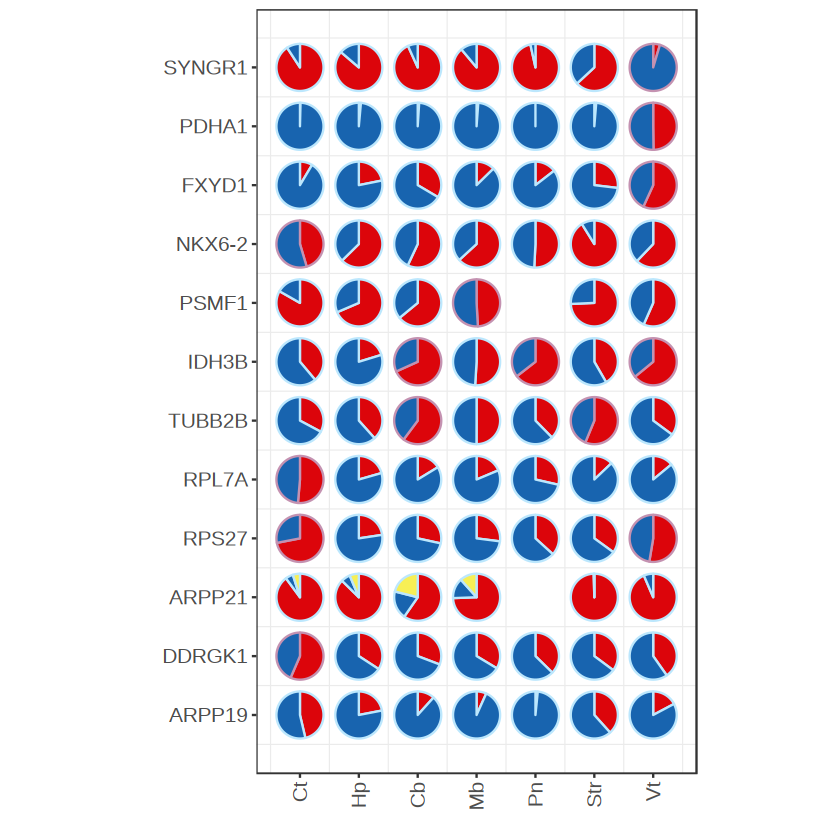

In [16]:
#case plot
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","ARPP21","RPS27","RPL7A","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
#caseg = colnames(isosigimx)
isosigi2 = isosigls$subcortical
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans,]
isosigi2 = isosigi2[isosigi2$sig == "Up",]

#casecti = casecti[casecti$genecount > 10,]

# casecti = casecti %>% group_by(transcript_id) %>% mutate(tcount = sum(count))
# casecti = casecti[order(casecti$gene_id,casecti$tcount),]
# transorder = unique(casecti$transcript_id)
# casecti$transcript_id = factor(casecti$transcript_id,levels = transorder)
casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = c("Cortex","Hippocampus","Cerebellum","Midbrain","Pons","Striatum","Ventricle")))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$major = 'Yes'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
transcolors = c("")
highlight = c("DDRGK1-Cortex","RPS27-Cortex","RPS27-Ventricle","RPL7A-Cortex",
              "TUBB2B-Cerebellum","TUBB2B-Striatum",
              "IDH3B-Cerebellum","IDH3B-Pons","IDH3B-Ventricle",
              "PSMF1-Midbrain","NKX6-2-Cortex",
              "FXYD1-Ventricle",
              "SYNGR1-Ventricle",
             "PDHA1-Ventricle")
casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$major = "No"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
xlabel = c("Ct","Hp","Cb","Mb","Pn","Str","Vt")
plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid,color = major,
                                           r = 0.4),
                      cols= colnames(casectl)[3:(3+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = xlabel) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("#C492B1","#BCE7FD")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08.pdf",width = 7,height = 4)


In [9]:
hubgene = c("ARPP19","DDRGK1","RPS27","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1","RPL7A","ARPP21")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
plmkt.sp = list()
for (i in c(1,2,4)) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.cor,
                               hubgene[i],hubtrans,ptsize = 0.5,mycolor,0.5)
}

for (i in c(3,5:length(hubgene))) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.cor,hubgene[i],hubtrans,ptsize = 0.5,mycolor)
}
plmkt.spt = ggarrange(plotlist = plmkt.sp,ncol = 8,nrow = 2)
ggexport(plmkt.spt,filename = "result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_total_case_25_12_08.pdf", 
         width = 12/4*8,height = 16/3*2)

[1] "ARPP19"
[1] "DDRGK1"
[1] "TUBB2B"
[1] "RPS27"
[1] "IDH3B"
[1] "PSMF1"
[1] "NKX6-2"
[1] "FXYD1"
[1] "PDHA1"
[1] "SYNGR1"
[1] "RPL7A"
[1] "ARPP21"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

In [92]:
#only see the isoform switched cases
library(dplyr)
library(tidyr)
library(purrr)
# major isoform shift stat
isosigi = isosigls$subcortical
hubgene = unique(isosigi[isosigi$sig != "N",]$gene_id)
isosigi = isosigi[isosigi$gene_id %in% hubgene,]
head(isosigi)
#construct phase dataset
isosigi$ismajor <- FALSE
isosigi <- isosigi %>%
  group_by(areatr, gene_id) %>%
  mutate(ismajor = ifelse(relative == max(relative), TRUE, FALSE)) %>%
  ungroup()
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#isosigi[isosigi$relative > 0.5,]$ismajor = TRUE
isosigi = isosigi[isosigi$ismajor == TRUE | (isosigi$ismajor == FALSE & abs(isosigi$relative - isosigi$otherrelative) > 0.1),]
isosigi = isosigi %>% group_by(transcript_id) %>% filter(length(unique(ismajor)) > 1)
length(unique(isosigi$gene_id))
hubtransid = unique(isosigi$transcript_id)

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
9,AACS,NM_001284010.1,Cerebellum,146,158,0.9240506,0.855632,0.8419483,0.08210238,N,0.001852607,0.005294328
10,AACS,NM_001284010.1,Cortex,2879,3272,0.8798900,0.855632,0.8507804,0.02910959,N,0.001852607,0.005294328
11,AACS,NM_001284010.1,Hippocampus,92,117,0.7863248,0.855632,0.8694934,-0.08316864,N,0.001852607,0.005294328
12,AACS,NM_001284010.1,Midbrain,37,48,0.7708333,0.855632,0.8725917,-0.10175838,Down,0.001852607,0.005294328
13,AACS,NM_001284010.1,Striatum,29,31,0.9354839,0.855632,0.8396616,0.09582226,N,0.001852607,0.005294328
14,AACS,NM_001284010.1,Ventricle,36,43,0.8372093,0.855632,0.8593165,-0.02210722,N,0.001852607,0.005294328


[1] 375

file saved to result/figure_revision/crossregion_subclass_isoform_shift_cb_show_25_10_22.pdf



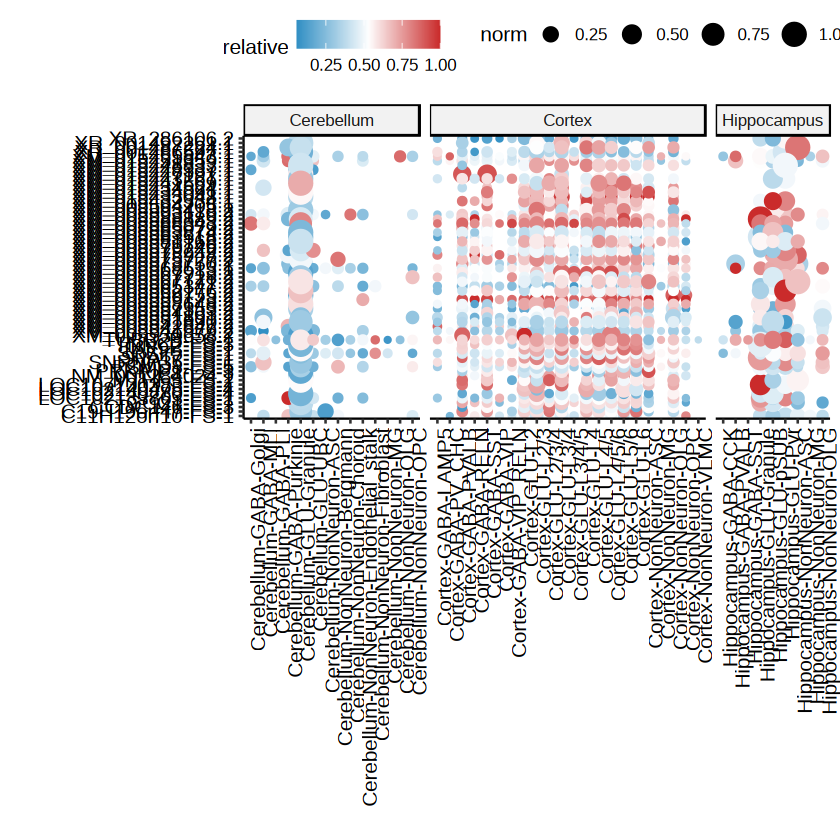

In [110]:
hubgene = shiftgcl[shiftgcl$cluster == "c3",]$gene_id
isosigi = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi = isosigi %>% group_by(subcortical,gene_id,transcript_id) %>% mutate(norm = count/sum(count))
pt = ggplot(isosigi,aes(x = areatr,y = transcript_id,color = relative,size = norm)) + geom_point() +
                    scale_color_gradientn(colors = colorRampPalette(c('#318fc4',"white",'#ca2b2b'))(200)) + 
                    facet_grid(~subcortical,space = "free",scales = "free") +
                    theme_pubr() +
                    theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
                    #coord_fixed() + 
                    xlab("") + ylab("")
pt
ggexport(pt,filename = "result/figure_revision/crossregion_subclass_isoform_shift_cb_show_25_10_22.pdf",
        width = 10,height = 12)

`summarise()` has grouped output by 'subcortical', 'subclass'. You can override
using the `.groups` argument.
Warning message:
"Removed 71 rows containing missing values or values outside the scale range
(`geom_text()`)."


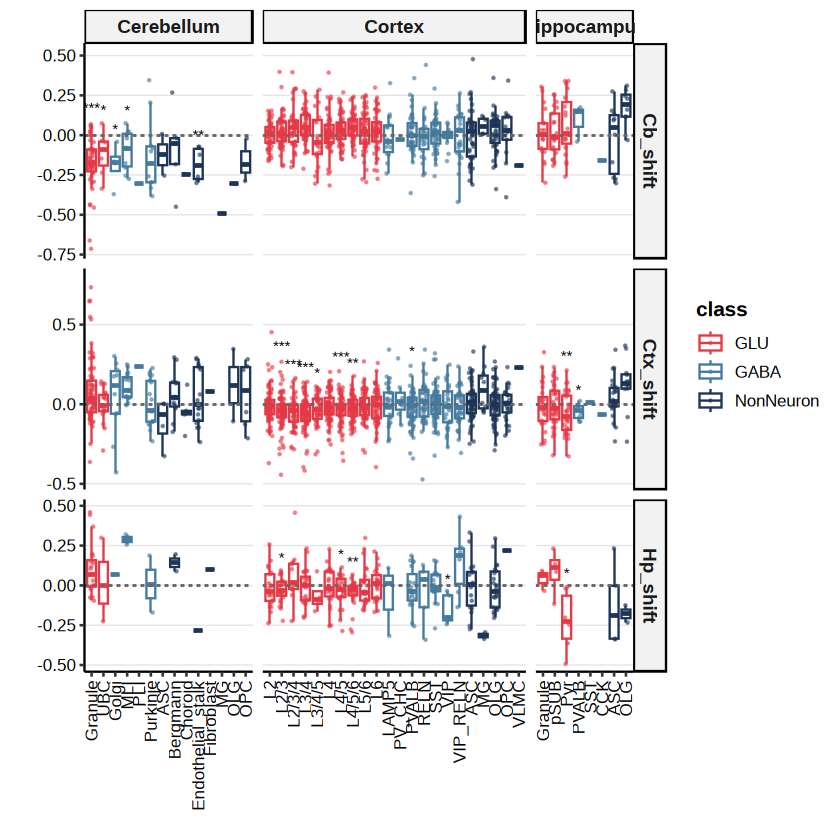

In [ ]:
hubgene = shiftgcl[shiftgcl$cluster == "c3",]$gene_id
isosigi.cb = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi.cb$group = "Cb_shift"
hubgene = shiftgcl[shiftgcl$cluster == "c2",]$gene_id
isosigi.hp = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi.hp$group = "Hp_shift"
hubgene = shiftgcl[shiftgcl$cluster == "c1",]$gene_id
isosigi.ctx = transt[transt$gene_id %in% hubgene & transt$transcript_id %in% hubtransid,]
isosigi.ctx$group = "Ctx_shift"
isosigi = rbind(isosigi.cb,isosigi.hp,isosigi.ctx)
isosigi$subcortical = MySplit(isosigi$areatr,"-",1)
isosigi$class = MySplit(isosigi$areatr,"-",2)
isosigi$subclass = MySplit(isosigi$areatr,"-",3)
isosigi$class = factor(isosigi$class,levels = c("GLU","GABA","NonNeuron"))
isosigi = isosigi[order(isosigi$class,isosigi$subcortical,isosigi$subclass),]
isosigi$subclass = factor(isosigi$subclass,levels = unique(isosigi$subclass))
isosigi = isosigi[isosigi$genecount > 10, ]
sig_labels <- isosigi %>%
  group_by(subcortical,subclass,group) %>%
  filter(n() > 3) %>%
  summarize(
    p_value = t.test(dr, mu = 0, alternative = "less")$p.value,

    label = case_when(
      p_value < 0.001 ~ "***",
      p_value < 0.01 ~ "**",
      p_value < 0.05 ~ "*",
      TRUE ~ NA 
    ),

    y_position = max(dr, na.rm = TRUE) + 0.05 * diff(range(dr, na.rm = TRUE))
  )

p1.1 = ggplot(isosigi, aes(x = subclass, y = dr, color = class)) + 
      geom_boxplot(outlier.stroke = 0,

        outlier.size = 0,
        alpha = 0.7, 
        size = 0.5 
      ) + 
      geom_hline(yintercept = 0, linetype = "dashed", color = "gray40", size = 0.6) +
      geom_jitter(width = 0.2, alpha = 0.5, size = 0.2) +
      geom_text(data = sig_labels, 
            aes(x = subclass, y = y_position, label = label), 
            color = "black",
            vjust = -0.5, 
            size = 3) + 
      facet_grid(group ~ subcortical, scales = "free",space = "free") + 
      scale_color_manual(values = c("#e63946",'#457b9d','#1d3557')) +
      theme_pubr() + 
      theme(
        axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 10),
        axis.text.y = element_text(size = 10),
        axis.title = element_text(face = "bold", size = 12),
        strip.text = element_text(face = "bold", size = 11), 
        legend.position = "right",
        legend.title = element_text(face = "bold"),
        panel.grid.major.y = element_line(color = "gray90", size = 0.3) 
      ) + 
      xlab("") + 
      ylab("")
p1.1
# p1.cb = PlotCloneCell(hubgene,transt)
# hubgene = shiftgcl[shiftgcl$cluster == "c2",]$gene_id
# p1.hp = PlotCloneCell(hubgene,transt)
# hubgene = shiftgcl[shiftgcl$cluster == "c1",]$gene_id
# p1.ctx = PlotCloneCell(hubgene,transt)
# p1t = ggarrange(p1.cb,p1.hp,p1.ctx,nrow = 3,common.legend = T)
# p1t
# isomx

In [471]:
ggexport(p1.1,filename = "result/figure_revision/crossregion_subclass_isoform_shift_cortex_boxplot_25_11_04.pdf",width = 8,height = 4)

Warning message:
"Removed 71 rows containing missing values or values outside the scale range
(`geom_text()`)."
file saved to result/figure_revision/crossregion_subclass_isoform_shift_cortex_boxplot_25_11_04.pdf



## G model analysis

In [3]:
transt = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
transt$subcortical = MySplit(transt$areatr,"-",1)
transt$class = MySplit(transt$areatr,"-",2)
transt$subclass = MySplit(transt$areatr,"-",3)
#unique(transt[,c("class","subclass")])
transt[transt$class != "NonNeuron",]$subclass = transt[transt$class != "NonNeuron",]$class
transt = transt %>% group_by(subclass,subcortical,gene_id,transcript_id) %>% 
            summarise(count = sum(count),genecount = sum(genecount),relative = count/genecount)
#head(transt)
transtf = transt %>% group_by(subcortical,gene_id) %>% 
      filter(length(unique(transcript_id))>1)
transtf = transtf[transtf$count > 10,]
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
# #transtf = transtf[paste0(transtf$subclass,transtf$layer) %in% paste0(substf$subclass,substf$layer),]
# transtf = transtf %>% group_by(gene_id,transcript_id,class,subcortical) %>% summarise(count = sum(count),
#                                                                                       genecount = sum(genecount),
#                                                                                      relative = count/genecount)
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% mutate(subcortm = sum(count)/sum(genecount))

`summarise()` has grouped output by 'subclass', 'subcortical', 'gene_id'. You
can override using the `.groups` argument.


In [4]:
transtf.cl = transtf %>% group_by(gene_id,transcript_id,subclass) %>% summarise(relative = sum(count)/sum(genecount))
transtf.sb = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% summarise(relative = sum(count)/sum(genecount))
transtf.cl = transtf.cl %>% group_by(gene_id,transcript_id) %>% filter(n() > 1) %>% summarise(celldr = max(relative) - min(relative))
transtf.sb = transtf.sb %>% group_by(gene_id,transcript_id) %>% filter(n() > 1) %>% summarise(subdr = max(relative) - min(relative))
compardf = merge(transtf.cl,transtf.sb,by = c("gene_id","transcript_id"))

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


file saved to result/figure_revision/cross_region_subclass_maxchange_26_01_08.pdf



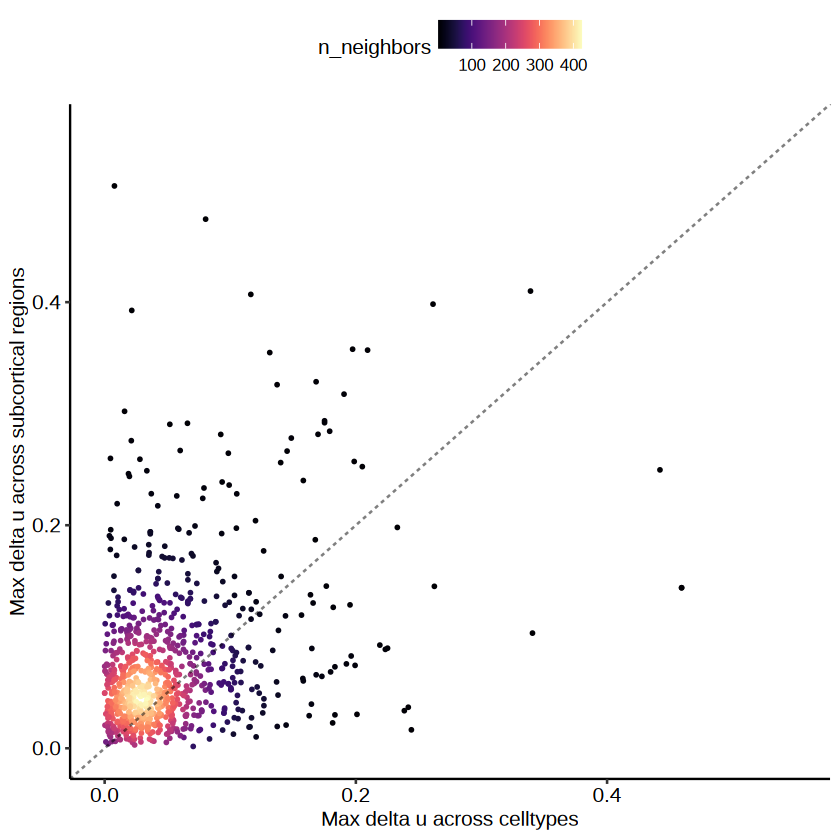

In [14]:
library(ggpointdensity)
p1.0 = ggplot(compardf,aes(x = celldr,y = subdr)) + geom_pointdensity(size = 0.5,adjust = 0.1) + 
        geom_abline(intercept = 0,linetype = 2,alpha = 0.5) +
        scale_color_viridis(option = "A") + 
        xlim(c(0,0.55)) + ylim(c(0,0.55)) + theme_pubr() + xlab("Max delta u across celltypes") + 
        ylab("Max delta u across subcortical regions")
p1.0
ggexport(p1.0,filename = "result/figure_revision/cross_region_subclass_maxchange_26_01_08.pdf",width = 4,height = 4)

In [192]:
unique(transtf$subcortical)

[1] "Cerebellum"  "Cortex"      "Hippocampus"

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


gene_id,transcript_id,subclass,cbdr,hpdr
<chr>,<chr>,<chr>,<dbl>,<dbl>
AAMDC,XM_005579175.2,GLU,0.117577161,0.192111322
AAMP,XM_005574266.2,GLU,0.027439614,0.030742205
ABAT,XM_005591210.2,GLU,0.033092369,0.005002869
ABCF1,XM_005553641.2,GLU,0.019985570,0.042207792
ABHD2,XM_005560462.2,GLU,0.005493485,0.127159576
ACOT8,XM_005569186.2,GLU,0.009753959,0.063866513


file saved to result/figure_revision/cross_region_subclass_change_facet_25_11_20.pdf



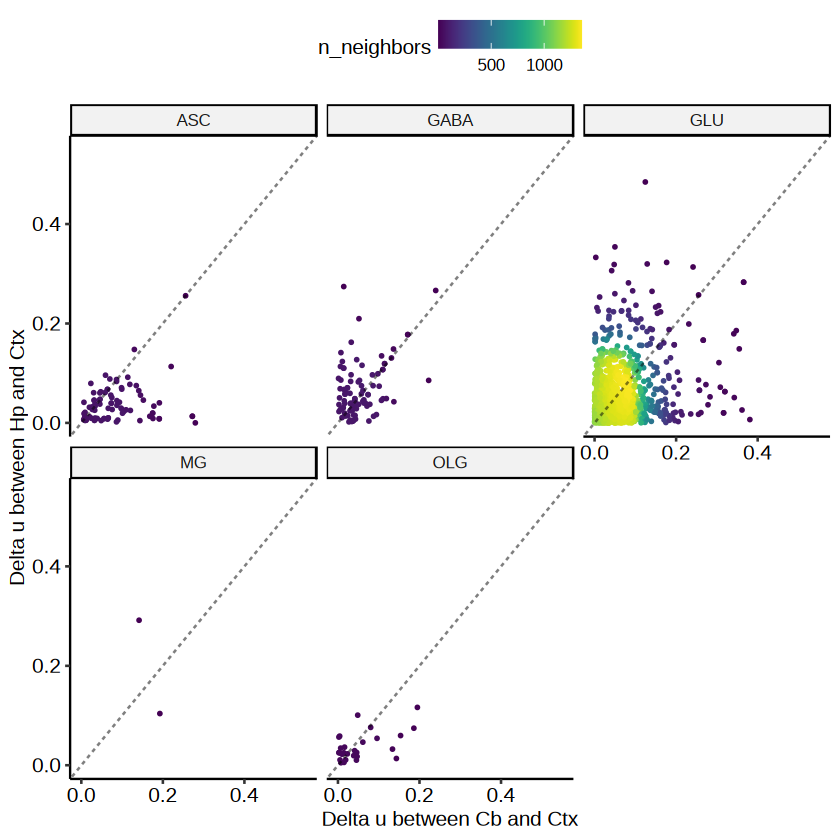

In [197]:
compardf.sb = transtf %>% group_by(gene_id,transcript_id,subclass) %>% filter(length(unique(subcortical)) == 3) %>% 
            summarise(cbdr = abs(relative[subcortical == "Cerebellum"] - relative[subcortical == "Cortex"]),
                      hpdr = abs(relative[subcortical == "Hippocampus"] - relative[subcortical == "Cortex"]))
head(compardf.sb)
p1.1 = ggplot(compardf.sb,aes(x = cbdr,y = hpdr)) + geom_pointdensity(size = 0.5) + 
        geom_abline(intercept = 0,linetype = 2,alpha = 0.5) +
        facet_wrap(~subclass) +
        scale_color_viridis() + 
        xlim(c(0,0.55)) + ylim(c(0,0.55)) + theme_pubr() + xlab("Delta u between Cb and Ctx") + 
        ylab("Delta u between Hp and Ctx")
p1.1
ggexport(p1.1,filename = "result/figure_revision/cross_region_subclass_change_facet_25_11_20.pdf",width = 6,height = 5)

In [222]:
transt = qread(file = "data/cross_region/transt_subcortical_cell_level_25_10_28.qs")
transt$subcortical = MySplit(transt$areatr,"-",1)
transt$class = MySplit(transt$areatr,"-",2)
transt$subclass = MySplit(transt$areatr,"-",3)
#unique(transt[,c("class","subclass")])
transt[transt$class != "NonNeuron",]$subclass = transt[transt$class != "NonNeuron",]$class
transt = transt %>% group_by(subclass,subcortical,gene_id,transcript_id) %>% 
            summarise(count = sum(count),genecount = sum(genecount),relative = count/genecount)
#head(transt)
transtf = transt %>% group_by(subcortical,gene_id) %>% 
      filter(length(unique(transcript_id))>1)
transtf = transtf[transtf$count > 20,]
transtf = transtf %>% group_by(subclass,transcript_id) %>% 
       filter(length(unique(subcortical)) > 1)
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,subcortical) %>% mutate(subcortm = sum(count)/sum(genecount))

`summarise()` has grouped output by 'subclass', 'subcortical', 'gene_id'. You
can override using the `.groups` argument.


In [247]:
##plot G model results
library(lme4)
modelcoef2 = NULL
length(unique(transtf$transcript_id))
for(i in unique(transtf$gene_id)){
    model_with_region = tryCatch(glmer(relative ~  cellm + subcortm + (1|transcript_id),
                            family = binomial(),
                            data = transtf[transtf$gene_id == i,],
                            na.action = na.exclude), 
                   error = function(e) NA)

    if(!is.na(model_with_region)){
        modelsm = tryCatch(summary(model_with_region),error = function(e) NA)
        if(length(modelsm) == 1) next;
        modelsmdf = as.data.frame(modelsm$coefficients)
        modelsmdf$gene_id = i
        # gi = transt.lobei[transt.lobei$transcript_id == i,]$gene_id[1]
        # modelsmdf$gene_id = gi
        modelsmdf$areatr = rownames(modelsmdf)
        modelcoef2 = rbind(modelcoef2,modelsmdf)
    }    
    
   # print(summary(model_with_region))
}
modelcoef2

# modelcoef2 = qread("data/dtu_analysis/subcortical_subclass_isoform_model_tri_onlyregion_25_10_31.qs")
# head(modelcoef2)

[1] 2925

Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')

Warning message in is.na(model_with_region):
"is.na() applied to non-(list or vector) of type 'S4'"
Warning message in vcov.merMod(object, use.hessian = use.hessian):
"variance-covariance matrix computed from finite-difference Hessian is
not positive definite or contains NA values: falling back to var-cov estimated from RX"
Warning message in vcov.merMod(object, correlation = correlation, sigm = sig):
"variance-covariance matrix computed from finite-difference Hessian is
not positive definite or contains NA values: falling back to var-cov estimated from RX"
Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')

Warning message in is.na(model_with_region):
"is.na() applied to non-(list or vector) of type 'S4'"
Warning message in vcov.merMod(object, use.hessian =

,Estimate,Std. Error,z value,Pr(>|z|),gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
(Intercept),-63.111482,4.244725e+07,-1.486822e-06,0.9999988,ATP5H,(Intercept)
cellm,109.183931,8.045627e+08,1.357059e-07,0.9999999,ATP5H,cellm
subcortm,119.152315,7.964192e+08,1.496100e-07,0.9999999,ATP5H,subcortm
(Intercept)1,-51.246943,2.117247e+07,-2.420452e-06,0.9999981,ATP5J,(Intercept)
cellm1,56.893613,3.764434e+08,1.511346e-07,0.9999999,ATP5J,cellm
subcortm1,66.547514,3.919146e+08,1.698010e-07,0.9999999,ATP5J,subcortm
(Intercept)2,-68.872947,9.360515e+01,-7.357816e-01,0.4618636,C11H12orf57,(Intercept)
cellm2,8.947914,1.695798e+02,5.276520e-02,0.9579190,C11H12orf57,cellm
subcortm2,127.264069,1.696252e+02,7.502662e-01,0.4530944,C11H12orf57,subcortm


In [248]:
colnames(modelcoef2)[4] = "pvalue"
modelcoef2[modelcoef2$pvalue < 0.05,]

,Estimate,Std. Error,z value,pvalue,gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
(Intercept)33,-32.59602,14.840488,-2.196425,2.806152e-02,SNRPN,(Intercept)
cellm41,13.18934,5.247332,2.513533,1.195285e-02,TUBB2B,cellm
(Intercept)66,-22.22986,11.265339,-1.973297,4.846176e-02,CAMK2B,(Intercept)
(Intercept)88,-22.65246,9.904491,-2.287090,2.219058e-02,FKBP2,(Intercept)
subcortm116,249.65805,107.922509,2.313308,2.070569e-02,LOC102140594,subcortm
(Intercept)154,-94.91522,40.117280,-2.365944,1.798418e-02,PSMD4,(Intercept)
subcortm154,162.77946,40.887904,3.981115,6.859267e-05,PSMD4,subcortm
subcortm162,106.95425,52.773320,2.026673,4.269590e-02,RPSA,subcortm


In [227]:
modelmx1.hub = modelmx1
modelmx1.hub$sig <- sapply(1:nrow(modelmx1.hub), function(i) {
  significant_cols <- names(modelmx1.hub)[-1][modelmx1.hub[i, -1] > -log10(0.05)]
  paste(significant_cols, collapse = "-")
})

In [ ]:
library(ggrepel)
thred = -log10(0.05)
isosigtri = modelmx1.hub
#isosigtri[isosigtri$cell > (-log10(1.0e-32)),]$cell = -log10(1.0e-32)
#isosigtri[isosigtri$subcortical > (-log10(1.0e-32)),]$subcortical = -log10(1.0e-32)
#isosigtri = isosigtri[isosigtri$cell < 100 &,]
isosigtri = isosigtri[isosigtri$sig != "",]
#isosigtri = isosigtri[isosigtri$subcortical > thred,]
isosigtri[isosigtri$cell > thred,]$sig = "cell"
isosigtri[isosigtri$subcortical > thred,]$sig = "subcortical"
#isosigtri[isosigtri$subcortical > thred & isosigtri$cell > thred,]$sig = "cell-subcortical"
# isosigtri$group = "N"
# isosigtri[isosigtri$gene_id %in% isosigi2$gene_id,]$group = "Y"
length(unique(isosigtri$gene_id))
thred = log2(-log10(0.05))
casels = c("NTRK2","DBNDD2","DDRGK1","ARPP19","RTN1","MORF4L1","SNRPN")
p2 = ggplot(data = isosigtri,aes(x = log2(cell), y = log2(subcortical),color = sig)) + 
#geom_pointdensity() +
   geom_point(size = 1.5) + 
   geom_text_repel(data=isosigtri, nudge_y = .2,min.segment.length = unit(0, 'lines'),
             aes(x = log2(cell), y = log2(subcortical),label = gene_id),size = 3,color = "black",vjust = 0.1)+
   geom_hline(yintercept = thred,linetype = 3) +
   geom_vline(xintercept = thred,linetype = 3) +
    scale_x_continuous(limits = c(-8,6),breaks = c(log2(-log10(0.99)),log2(-log10(0.9)),
                                log2(-log10(0.05)),log2(-log10(0.01)),3,5),
                     labels = c("0.99","0.9","0.05","0.01","10-e8","10-e32")) +
     scale_y_continuous(limits = c(-8,6),breaks = c(log2(-log10(0.99)),log2(-log10(0.9)),
                                log2(-log10(0.05)),log2(-log10(0.01)),3,5),
                     labels = c("0.99","0.9","0.05","0.01","10-e8","10-e32")) +
    scale_color_manual(values = c("#789CBE","#FEE1E3","#CBE8D2")) +
   # geom_text_repel(data=isosigtri[!isosigtri$sig %in% c("","cell"),],
   #                 aes(cell,lobe,layer,label = gene_id),size = 2,color = "black") +
    theme_bw() + 
    theme(panel.grid.major = element_blank(),panel.grid.minor = element_blank(),
          axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
    xlab("Contribution p value of subclass") + 
    ylab("Contribution p value of cortex region")
#scale_fill_viridis()
    #scale_color_discreterainbow()
p2
# table(isosigtri$group)
# table(isosigtri$sig)
ggexport(p2,filename = "result/figure_revision/cross_region_subclass_model_contribution_fil_25_11_20.pdf",width = 4.5,height = 3)
# pdf("result/figure5/region_subclass_model_contribution_stpie_24_12_20.pdf",width = 4,height = 4)
# p2.1 = pie(table(isosigtri$sig),col = c("#789DBC","#FFE3E3","#C9E9D2"))
# p2.1
# dev.off()


### GLU vs GABA and NN

In [19]:
# dtumkdf.hub = qread(file = "result/figure3/class_DTU_by_subclass_ttest_25_10_11.qs")
# head(dtumkdf.hub)
fsraw.cor.sub = fsraw.cor.sub[!is.na(fsraw.cor.sub$class),]
fsraw.cor.sub$class = gsub(fsraw.cor.sub$class,pattern = "Glu",replacement = "GLU")
head(fsraw.cor.sub)

readid,origin_name,cell_id,cell_type_id,subclass,class,gene_id,layer,region,subcortical,transcript_id,lobe,x,y,areatr
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
589a032e-1c17-43b6-9fbf-5dc59250a856-7;st_ed:A:2600-2951;AD:A:adapterL.rc-adapterK.rc;AP:A:Correct_20-44:-,L-1|2-l3,600265,19,L2/3,GLU,LOC102143409,l3,1|2,Cortex,XM_005595588.2,somatosensory,10000,26922,Cortex-L2/3
9ac7b273-96bf-4d68-80fb-d7ff514e5ebe-5;st_ed:A:1453-2414;AD:A:adapterD-adapterE;AP:A:Correct_917-941:+,L-1|2-l3,995906,199,SST,GABA,LOC102118724,l3,1|2,Cortex,XM_005594222.1,somatosensory,10000,27116,Cortex-SST
4ba4820b-e8fa-46a0-821c-c6712593c1d6-2;st_ed:A:54-981;AD:A:adapterM.rc-adapterL;AP:A:RC-Wrong_882-908:+,L-1|2-l3,367403,55,L3/4,GLU,APOO,l3,1|2,Cortex,XM_005593179.2,somatosensory,10000,27283,Cortex-L3/4
0cda11f1-c8d9-420c-92f5-c559b823a60c-5;st_ed:A:9766-10659;AD:A:adapterM-adapterN;AP:A:Correct_850-874:+,L-1|2-l3,221672,44,L3/4,GLU,MCM4,l3,1|2,Cortex,XM_005563283.2,somatosensory,10000,27312,Cortex-L3/4
31a90124-560e-4cc0-bf91-1f36255f8739-4;st_ed:A:1305-2664;AD:A:adapterN.rc-adapterM.rc;AP:A:Correct_20-45:-,L-1|2-l3,221672,44,L3/4,GLU,SNCB,l3,1|2,Cortex,XM_005558602.2,somatosensory,10000,27312,Cortex-L3/4
ef487e6a-3992-4bb2-a088-184a261be56e-16;st_ed:A:8794-9695;AD:A:adapterJ.rc-adapterI.rc;AP:A:Correct_21-44:-,L-1|2-l3,221672,44,L3/4,GLU,MCM4,l3,1|2,Cortex,XM_005563283.2,somatosensory,10000,27312,Cortex-L3/4


In [23]:
#unique(fsraw.cor.sub$class)
#qsave(fsraw.cor.sub,"data/reads_full_anotation/total_annotation_delete_multiread_withcrossregion_cell_filter_25_10_28.qs")
#unique(fsraw.cor.sub$subcortical)

[1] "Cortex"      "Hippocampus" "Cerebellum"

In [43]:
fsraw.cor.sub$areatr = fsraw.cor.sub$class
threld = 20
transt.ctx = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",],threld)
transt.hp = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",],threld)
transt.cb = FullLengthTranSt(fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",],threld)
transt.ctx$group = "Cortex"
transt.hp$group = "Hippocampus"
transt.cb$group = "Cerebellum"
transt = rbind(transt.ctx,transt.hp,transt.cb)
head(transt)
qsave(transt,file = "data/cross_region/transt_subcortical_inner_cell_level_25_11_03.qs")

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,group
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAAS,AAAS-FS-1,GABA,6,55,0.10909091,0.0773390,0.06146305,0.047627862,Cortex
AAAS,AAAS-FS-1,GLU,15,234,0.06410256,0.0773390,0.08395722,-0.019854655,Cortex
AAAS,AAAS-FS-1,NonNeuron,2,34,0.05882353,0.0773390,0.08659674,-0.027773207,Cortex
AAAS,AAAS-FS-2,GABA,2,55,0.03636364,0.0502331,0.06410256,-0.027738928,Cortex
AAAS,AAAS-FS-2,GLU,15,234,0.06410256,0.0502331,0.03636364,0.027738928,Cortex
AAAS,XM_005571000.2,GABA,47,55,0.85454545,0.8553194,0.85570639,-0.001160931,Cortex


Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_25_11_04.pdf



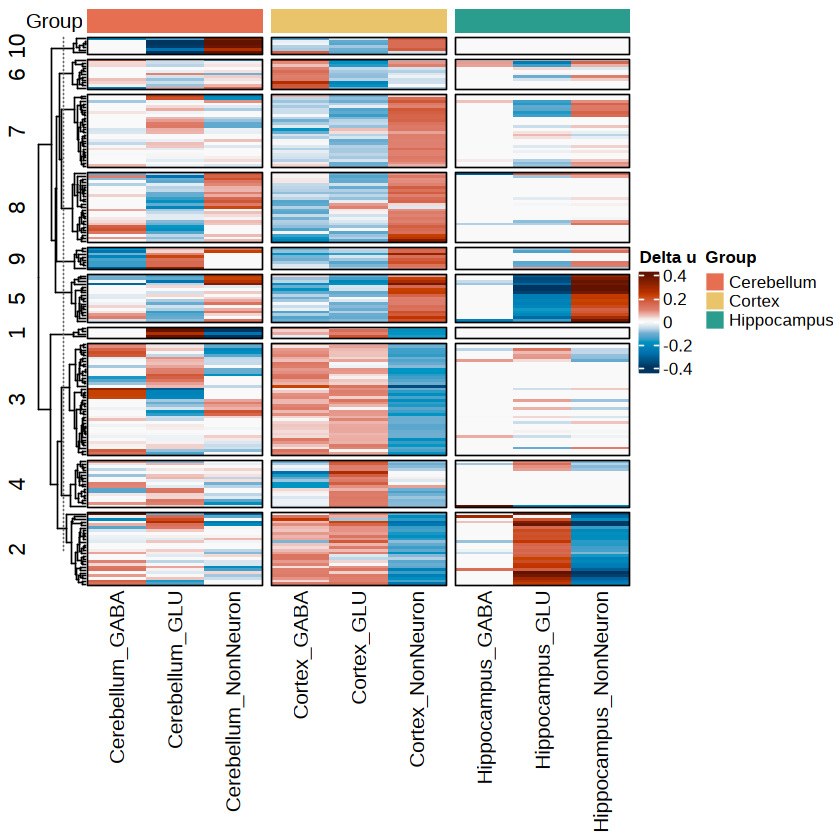

In [ ]:

isosigi = isosigls$class
isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
transt.fil = transt[transt$transcript_id %in% hubtrans,]
head(transt.fil)

transt.fil = transt.fil %>% group_by(transcript_id) %>% filter(length(unique(group)) > 1)
isomx = dcast(transt.fil,transcript_id~group+areatr,value.var = "dr",fun.aggregate = sum)
rownames(isomx) = isomx$transcript_id;isomx = isomx[,-1]
col_groups <- sapply(strsplit(colnames(isomx), "_"), function(x) x[1])
library(circlize)
col_groups <- sapply(strsplit(colnames(isomx), "_"), function(x) x[1])


top_annotation <- HeatmapAnnotation(
  Group = col_groups,
  col = list(Group = c("Cerebellum" = "#e76f51", "Cortex" = "#e9c46a", "Hippocampus" = "#2a9d8f")),
  annotation_name_side = "left"
)
col_fun = colorRamp2(c(-0.4,-0.1, 0,0.1, 0.4), hcl_palette = "RdBu",reverse = T)

pht = Heatmap(isomx,name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,row_km = 10,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht
ggexport(pht,filename = "result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_25_11_04.pdf",width = 6,height = 8)

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_fil_25_11_04.pdf



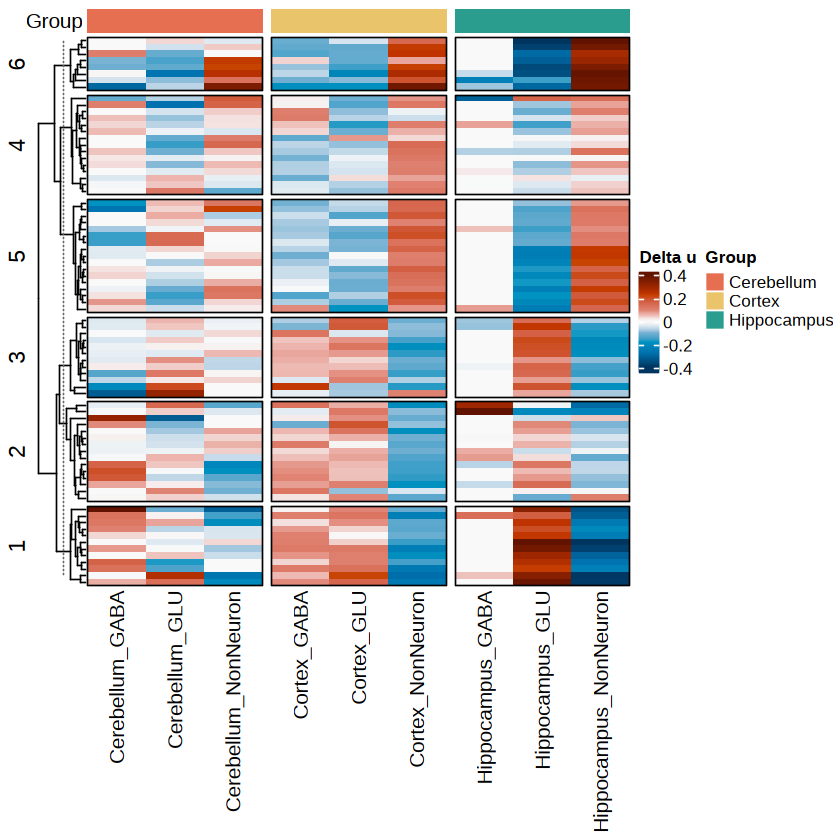

In [67]:
pht = Heatmap(isomx[rowSums(isomx != 0) > 6,],name = "Delta u",
              show_row_names = F,border = TRUE,
              cluster_columns = FALSE,row_km = 6,
              column_split = col_groups,
              top_annotation = top_annotation,
              column_title = NULL,  col = col_fun,
              column_gap = unit(2, "mm"))
pht
ggexport(pht,filename = "result/figure_revision/subcortical_cell_class_DTU_compare_heatmap_fil_25_11_04.pdf",width = 6,height = 7)

##  Cell Case Plot

In [200]:
library(randomcoloR)
pref = qread("../ref/area_figure_an.qs")
subcoran = unique(fsraw.cor[,c("region","subcortical")])
edgesdf = pref$areaedges
edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
names(mycolor) = unique(edgesdf$subcortical)

In [208]:
head(edgesdf)

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1|2,14137,8201,13719,27125,13805,27151,13748.72,27181.92,13821.84,26940.06,0,0,Cortex
2,1|2,6544,36469,13921,27127,14028,27183,13984.86,27135.20,14070.35,26971.87,0,0,Cortex
3,1|2,23042,28818,14240,27193,14298,27255,14311.90,27183.87,14657.62,26860.46,0,0,Cortex
4,1|2,7559,14391,13318,27000,13548,27076,13463.00,26947.21,13962.13,25436.69,0,0,Cortex
5,1|2,11606,7559,13277,27001,13318,27000,13298.28,27032.41,13281.32,26337.29,0,0,Cortex
6,1|2,37516,11606,13227,27004,13277,27001,13253.47,27026.95,13226.19,26572.31,0,0,Cortex


In [ ]:
#head(subcoran)
# pref = qread("../ref/area_figure_an.qs")
# subcoran = unique(fsraw.cor[,c("region","subcortical")])
# edgesdf = pref$areaedges
# edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
# edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
# mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
# names(mycolor) = unique(edgesdf$subcortical)


#head(edgesdf)
#backpt = qread("longread_cell_isoform_")
SpCasePlot = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    # mkdf.st = mkdf %>% group_by(transcript_id) %>% summarise(count = length(readid))
    # mkdf.st = mkdf.st[order(mkdf.st$count),]
    # transorder = unique(mkdf.st$transcript_id)
    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    #edgesdf.zoom = edgesdf[,]
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),size = ptsize,stroke = NA,shape = 21) + 
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
      #            size = 0.5,alpha = 0.75) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 

      theme_void() +
      #scale_fill_discreterainbow() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      #scale_color_manual(values = mycolor) +
      #scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()
    return(pmkpti1)
}

SpCasePlot = function(fsraw.cor, geneex, hubtrans, edgesdf, ptsize = 1, mycolor, downsample = 0) {

    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex, ]
    if (downsample != 0) {
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans, ]
    mkdf$transcript_id = factor(mkdf$transcript_id, levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)), ]
    

    isoform_counts <- table(mkdf$transcript_id)
    isoform_prop <- prop.table(isoform_counts)
    pie_data <- data.frame(
        transcript_id = names(isoform_prop),
        proportion = as.numeric(isoform_prop),
        stringsAsFactors = FALSE
    )
    

    pie_plot <- ggplot(pie_data, aes(x = "", y = proportion, fill = transcript_id)) +
        geom_bar(width = 1, stat = "identity", color = "white") +
        coord_polar("y", start = 0) +
        scale_fill_manual(values = mycolor[2:1]) +
        theme_void() +
        theme(legend.position = "none")

    pmkpti1 <- ggplot() +
        geom_segment(data = edgesdf, 
                     aes(x = x1, y = y1, xend = x2, yend = y2, color = subcortical),
                     size = 0.2, alpha = 1) +
        geom_point(data = mkdf,
                   aes(x, y, fill = transcript_id), size = ptsize, stroke = NA, shape = 21) + 
        theme_void() +
        scale_color_flatui() +
        scale_fill_manual(values = mycolor) +
        theme_presentation() + 
        theme(legend.position = "top", legend.title = element_blank(),
              legend.text = element_text(size = 8)) +
        guides(color = "none",
              fill = guide_legend(override.aes = list(size = 6), nrow = 2), size = 7) +
        scale_y_reverse() + 
        scale_x_reverse()
    

    pmkpti1 <- pmkpti1 + 
        annotation_custom(
            ggplotGrob(pie_plot),
            xmin = max(mkdf$x, na.rm = TRUE) - diff(range(mkdf$x, na.rm = TRUE)) * 0.3,
            xmax = max(mkdf$x, na.rm = TRUE) + diff(range(mkdf$x, na.rm = TRUE)) * 0.1,
            ymin = min(mkdf$y, na.rm = TRUE) - diff(range(mkdf$y, na.rm = TRUE)) * 0.3,
            ymax = min(mkdf$y, na.rm = TRUE) + diff(range(mkdf$y, na.rm = TRUE)) * 0.1
        )
    
    return(pmkpti1)
}

In [208]:
fsraw.cor.case = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",]
edgesdf.zoom = edgesdf[edgesdf$subcortical == "Cerebellum",]
fsraw.cor.case2 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",]
edgesdf.zoom2 = edgesdf[edgesdf$subcortical == "Hippocampus",]
fsraw.cor.case3 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",]
edgesdf.zoom3 = edgesdf[edgesdf$subcortical == "Cortex",]
CaseTotalPlot = function(geneex,hubtrans){
    pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
    pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
    pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
    pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
    pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
    pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
    pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
    pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
    pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
    pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                         pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                         pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                         ncol = 3,nrow = 3,
                         common.legend = TRUE,legend = "right")
    return(pci.zoom)
}
geneex = "CFL2"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005561059.2","NM_001284960.1")
pci.zoom = CaseTotalPlot(geneex,hubtrans)
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_20.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

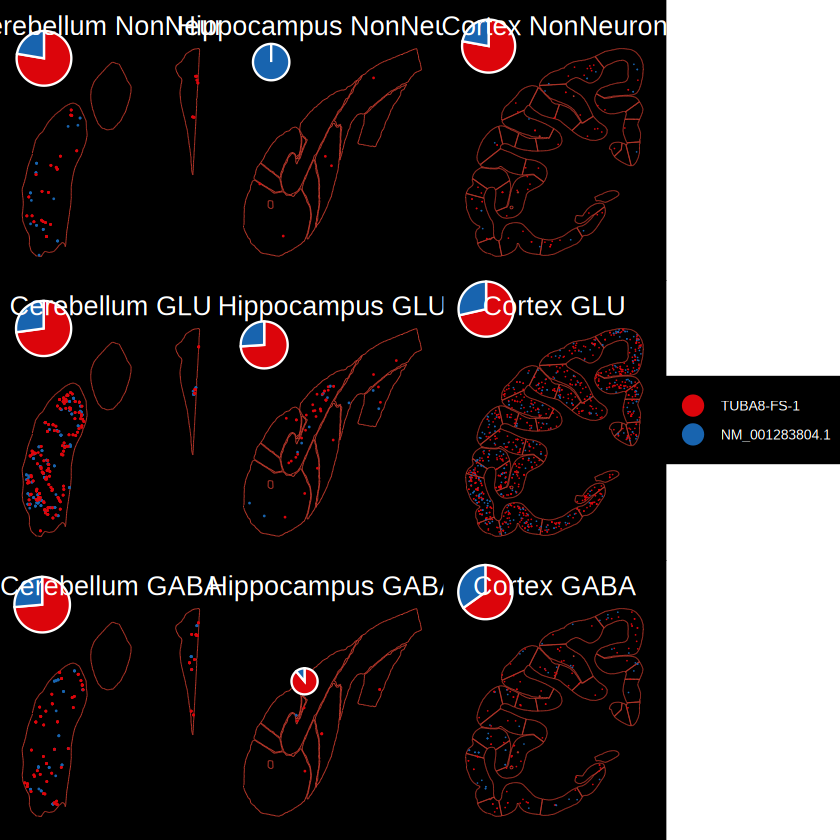

In [474]:
geneex = "TUBA8"
#mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("TUBA8-FS-1","NM_001283804.1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

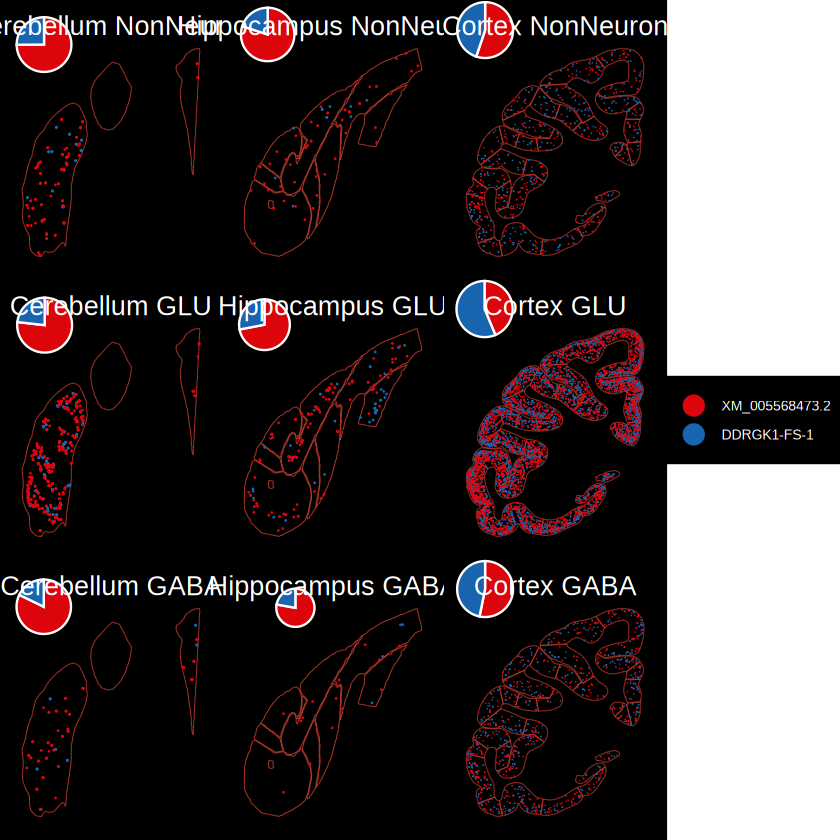

In [456]:
geneex = "DDRGK1"
#mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005568473.2","DDRGK1-FS-1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

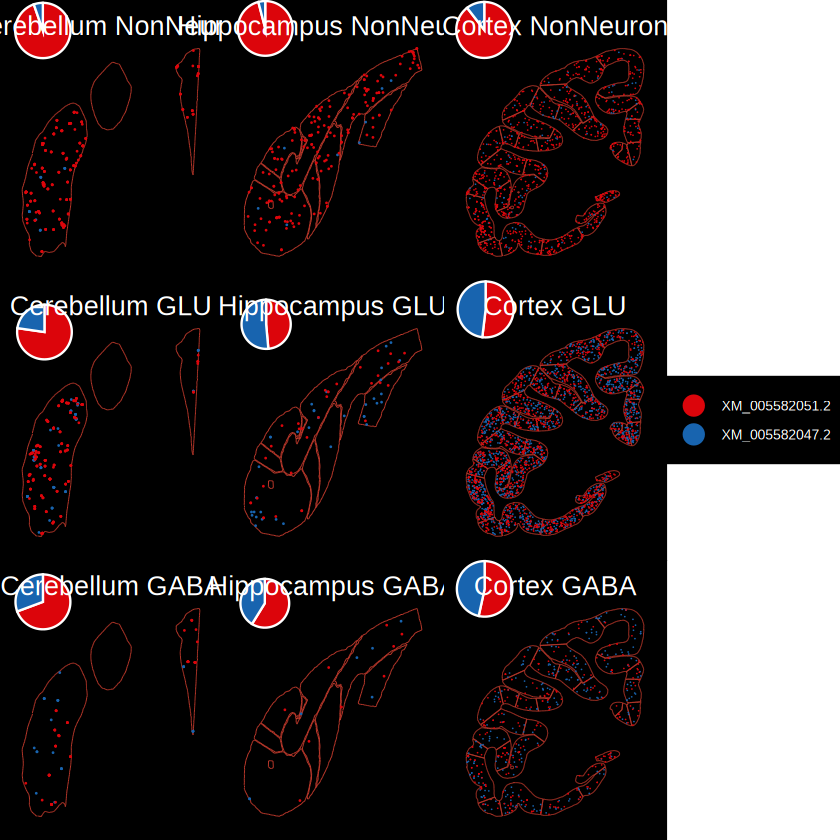

In [458]:
geneex = "NTRK2"
#mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005582051.2","XM_005582047.2")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


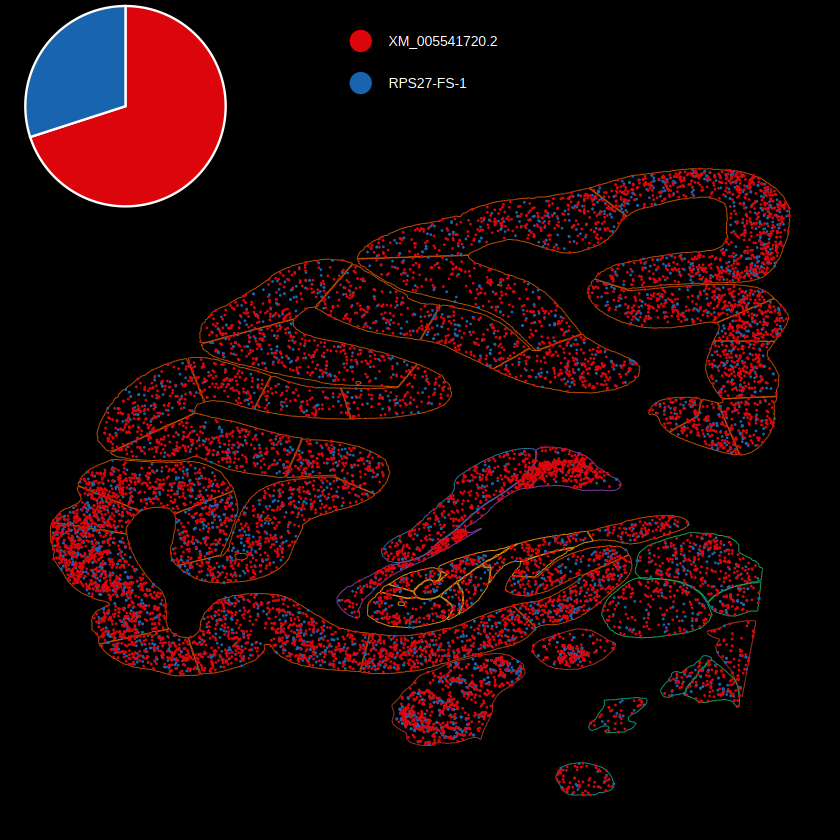

In [453]:
library(randomcoloR)
geneex = "RPS27"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005541720.2","RPS27-FS-1")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 0.5,mycolor)
pci

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


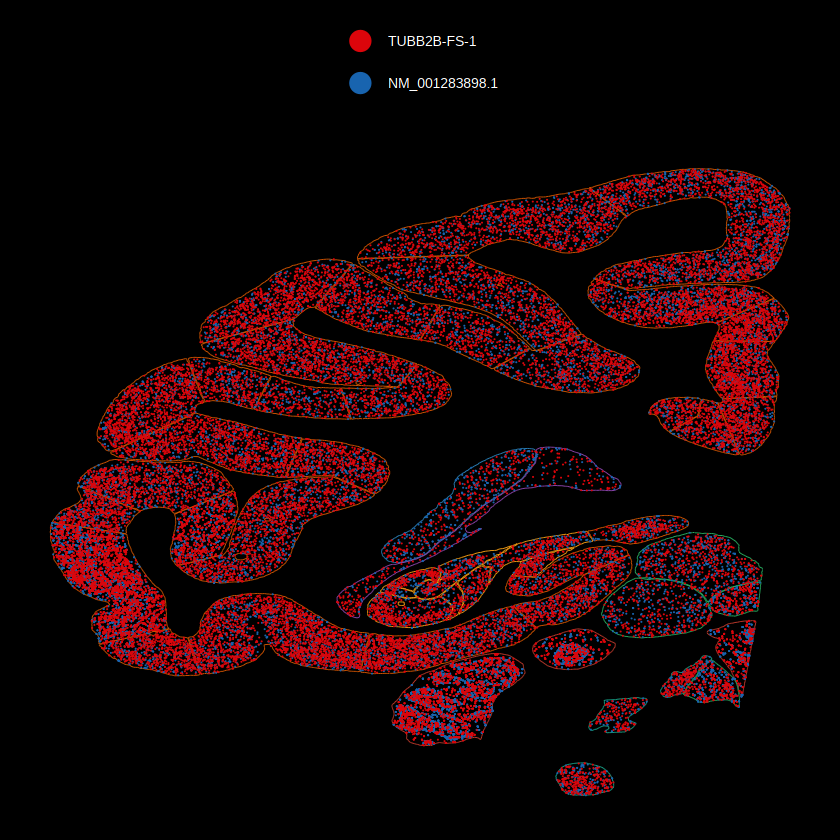

In [298]:
library(randomcoloR)
geneex = "TUBB2B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("TUBB2B-FS-1","NM_001283898.1")
pci = SpCasePlot(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 0.3,mycolor)
pci

In [299]:
# fsraw.cor.case = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cerebellum",]
# edgesdf.zoom = edgesdf[edgesdf$subcortical == "Cerebellum",]
fsraw.cor.case2 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Hippocampus",]
edgesdf.zoom2 = edgesdf[edgesdf$subcortical == "Hippocampus",]
fsraw.cor.case3 = fsraw.cor.sub[fsraw.cor.sub$subcortical == "Cortex",]
edgesdf.zoom3 = edgesdf[edgesdf$subcortical == "Cortex",]

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

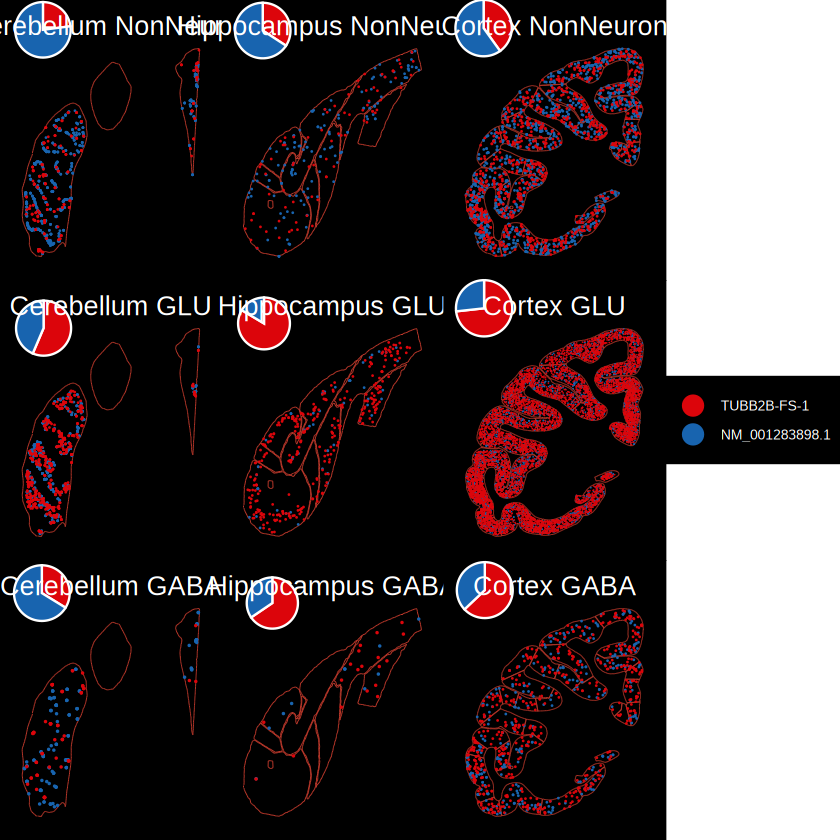

In [438]:
geneex = "TUBB2B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("TUBB2B-FS-1","NM_001283898.1")
# pci.zoom1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],geneex,hubtrans,edgesdf.zoom,ptsize = 1,mycolor)
# pci.zoom1
# pci.zoom2 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],geneex,hubtrans,edgesdf.zoom,ptsize = 1,mycolor)
# pci.zoom2
# pci.zoom3 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],geneex,hubtrans,edgesdf.zoom,ptsize = 1,mycolor)
# pci.zoom3
# pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$subclass == "Bergmann",],
#                        geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum Bergmann")
# pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$subclass == "ASC",],
#                        geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus ASC")
# pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$subclass == "ASC",],
#                        geneex,hubtrans,edgesdf.zoom3,ptsize = 0.5,mycolor) + ggtitle("Cortex ASC")
# pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
#                        geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
# pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
#                        geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
# pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
#                        geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.5,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
# pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
#                      pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,ncol = 3,nrow = 2,
#                      common.legend = TRUE,legend = "right")
pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

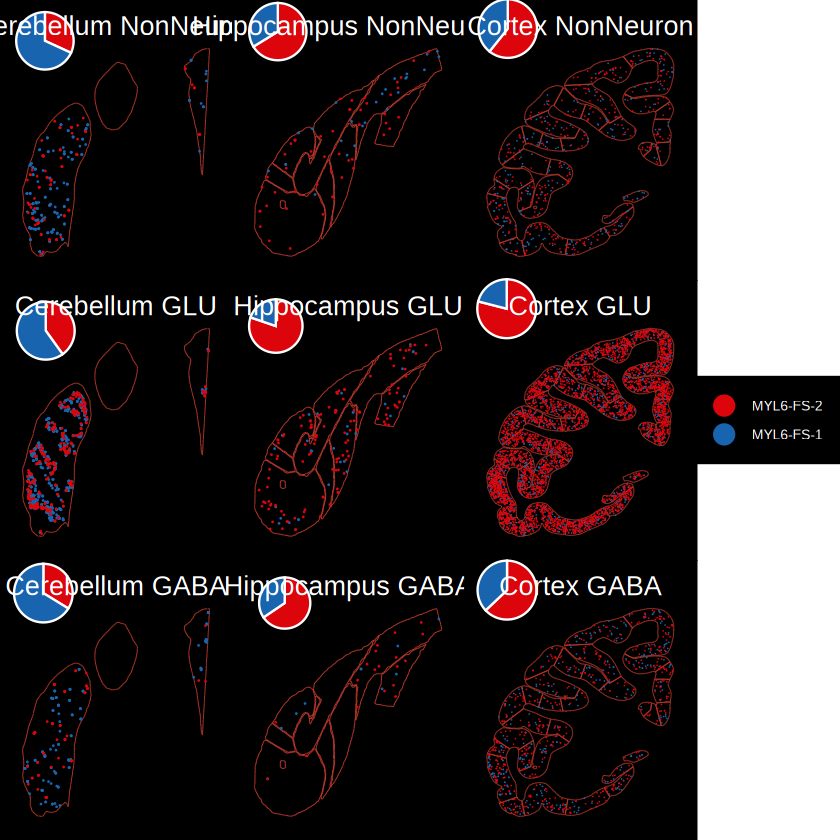

In [459]:
geneex = "MYL6"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("MYL6-FS-2","MYL6-FS-1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
#         width = 8,height = 6)
#pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

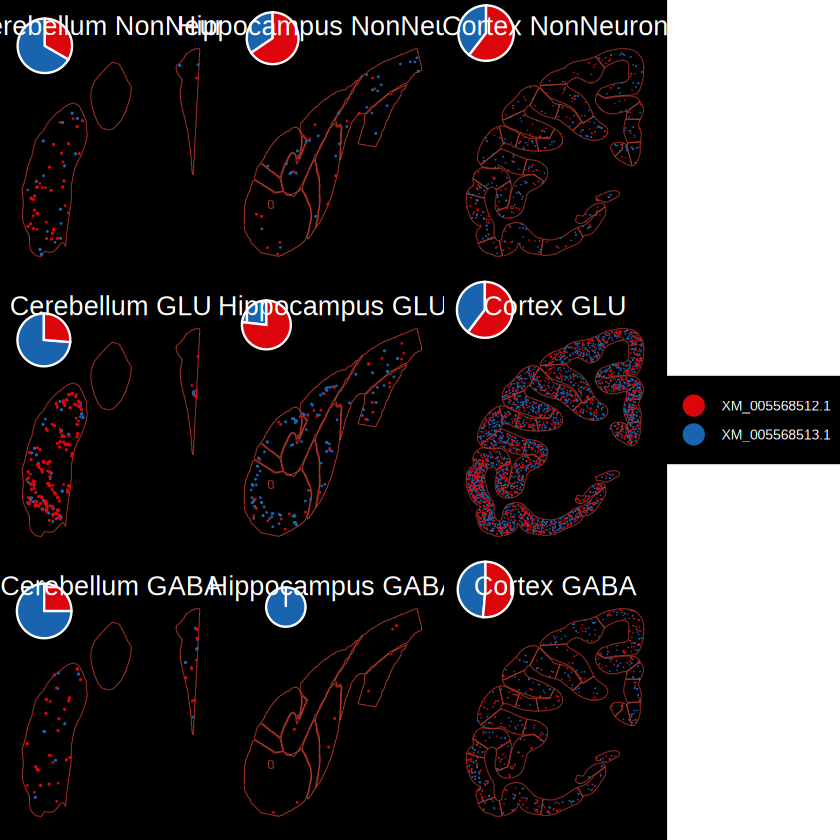

In [460]:
geneex = "IDH3B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005568512.1","XM_005568513.1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
#         width = 8,height = 6)
#pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

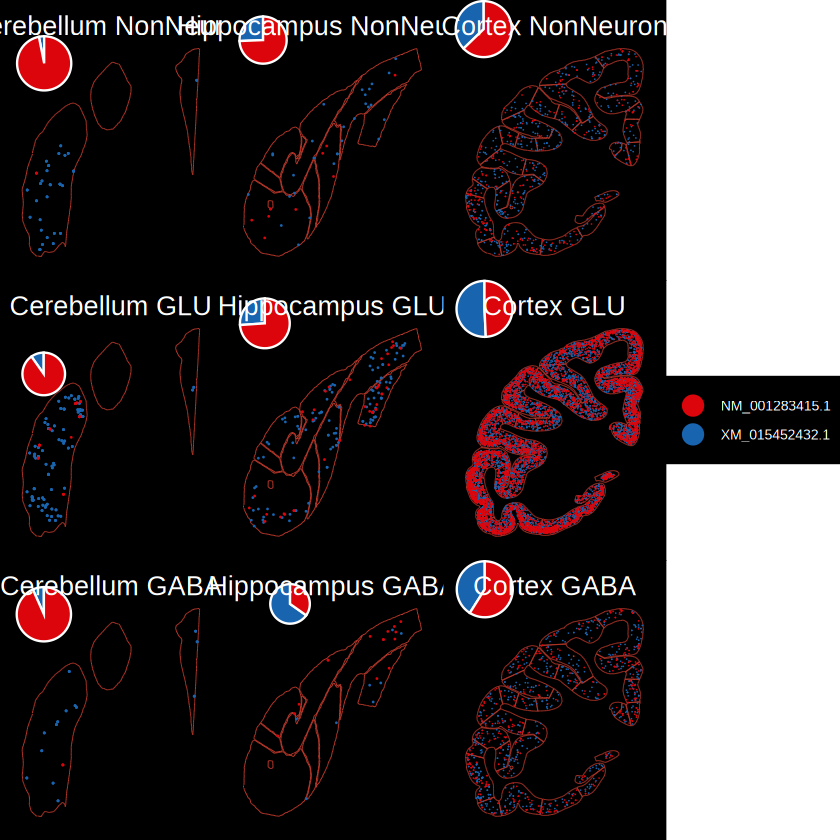

In [461]:
geneex = "ARPP19"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1")
pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron")
pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron")
pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron")
pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU")
pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU")
pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU")
pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA")
pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA")
pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                       geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA")
pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,
                     pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,
                     pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,
                     ncol = 3,nrow = 3,
                     common.legend = TRUE,legend = "right")
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
#         width = 8,height = 6)
#pci.zoom
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_05.pdf"),
        width = 9/2,height = 8/2)


file saved to result/figure_revision/case_subcortical_subclass_isoform_rate_stat_pie_25_11_07.pdf



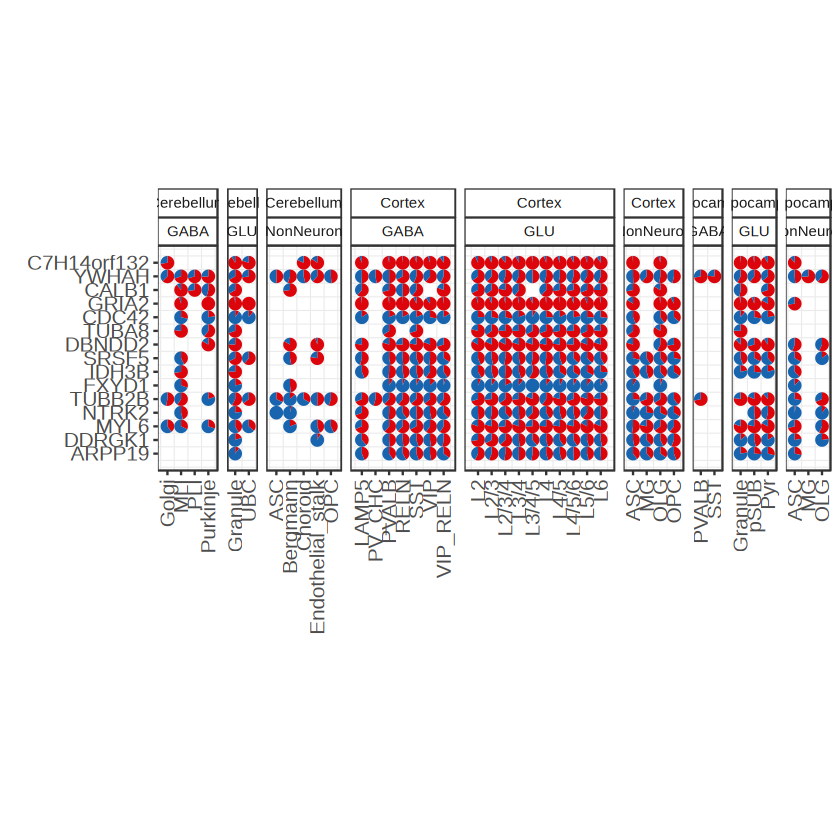

In [536]:
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","MYL6","NTRK2","TUBB2B","FXYD1",
            "IDH3B","SRSF5","DBNDD2","TUBA8","CDC42","GRIA2","CALB1","YWHAH","C7H14orf132")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "XM_005569136.2","XM_015429879.1","XM_015454192.1","XM_015454193.1",
             "XR_001487780.1","XM_005594227.2",
             "XM_015454768.1","NM_001284560.1","NM_001284100.1","XM_015456947.1",
             "TUBA8-FS-1","NM_001283804.1","NM_001283401.1","CDC42-FS-1",
             "XM_005556162.2","XM_005556163.2",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_005545480.2","XM_015444956.1",
             "XM_005588819.1","XM_005588818.2",
             "TUBB2B-FS-1","NM_001283898.1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005544192.2","XM_005544198.2",
             "MYL6-FS-2","MYL6-FS-1",
             "XM_005541224.2","XM_005541226.2",
             "GPX4-FS-2","XM_005587358.2",
             "NKX6-2-FS-1","NKX6-2-FS-3",
             "PDHA1-FS-1","XM_005593119.2",
             "XM_005541720.2","RPS27-FS-1",
            "XM_005567237.2","XM_005567239.2",
            "XM_015455847.1","XM_015455855.1",
            "XM_005576034.2","XM_005576035.2",
            "NM_001284957.1","RPL7A-FS-1",
            "XM_005561612.2","SRSF5-FS-1","XM_005582047.2","XM_005582051.2")
#caseg = colnames(isosigimx)
isosigi2 = transt.cl2
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans,]
casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative",fun.aggregate = sum)
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = unique(casectl$areatr)))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))


library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
#casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$sig = "Y"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
casectl$subcortical = MySplit(casectl$areatr,"-",1)
casectl$class = MySplit(casectl$areatr,"-",2)
casectl$subclass = MySplit(casectl$areatr,"-",3)

plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid, r = 0.5),
                      cols= colnames(casectl)[3:(3+ison-1)],color=NA) + 
      coord_fixed() +
      facet_grid(~ subcortical+class,space = "free",scale = "free") + 
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = casectl$subclass[!duplicated(casectl$areatr)]) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure_revision/case_subcortical_subclass_isoform_rate_stat_pie_25_11_07.pdf",width = 8,height = 6)

## Replicates analysis

In [ ]:
fsraw.t42 = qread("data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")
fsraw.t47 = qread("data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")
isosigls.t42 = qread("data/dtu_analysis/T42_dtu_isoform_ls_fsraw_cor_25_12_01.qs")
isosigls.t47 = qread("data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_01.qs")

cidPos,readid,tranid,type,transcript_id,gene_id,sample,cell_label,gene_area,x,y,origin_name,cell_type,subclass,class,region,layer,group,subcortical
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10000_105826,read_6160281|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_105826,read_16822062|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_108587,read_5998725|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_108587,read_16660506|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_109072,read_6443305|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_109072,read_17105086|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex


cidPos,readid,tranid,type,sample,transcript_id,gene_id,V1,x,y,⋯,cell_id,cell_type_id,cell_type,subclass,class,global_region_id,origin_name,layer,region,subcortical
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>
10000_22991,read_239684|adapterG-adapterH|2088-2802(+),83152,compatible,T42_revo,XM_015438047.1,UNC119,515913347,10000,22991,⋯,NA,NA,,,,289,L-3a/b-l2,l2,3a/b,Cortex
10000_22991,read_8896334|adapterG-adapterH|2088-2802(+),83152,compatible,T42_revo,XM_015438047.1,UNC119,515913347,10000,22991,⋯,NA,NA,,,,289,L-3a/b-l2,l2,3a/b,Cortex
10000_23139,read_8525178|adapterE-adapterF|2211-3063(+),51661,compatible,T42_revo,XM_005555626.2,PAPSS1,278799601,10000,23139,⋯,594174,17,GLU L2/3.6 ART3/EMILIN3,L2/3,GLU,290,L-3a/b-l3,l3,3a/b,Cortex
10000_23139,read_17181828|adapterE-adapterF|2211-3063(+),51661,compatible,T42_revo,XM_005555626.2,PAPSS1,278799601,10000,23139,⋯,594174,17,GLU L2/3.6 ART3/EMILIN3,L2/3,GLU,290,L-3a/b-l3,l3,3a/b,Cortex
10000_23216,read_6325032|adapterD_RC|5464-5889(-),69651,compatible,T42_revo,XM_005586664.2,MBD2,515369179,10000,23216,⋯,NA,NA,,,,290,L-3a/b-l3,l3,3a/b,Cortex
10000_23216,read_14981682|adapterD_RC|5464-5889(-),69651,compatible,T42_revo,XM_005586664.2,MBD2,515369179,10000,23216,⋯,NA,NA,,,,290,L-3a/b-l3,l3,3a/b,Cortex


In [51]:
#calculate DTUs
transtls = list()

FullLengthTranSt = function(fs.info){
      transtl = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transtl = transtl[transtl$areatr != "" &
                          !is.na(transtl$areatr),]
      return(transtl)
}
    
CalSigIsoform = function(transt){
    transt = transt[!is.na(transt$areatr),]
    transt = transt[transt$areatr != "",]
    transt$relative = transt$count/transt$genecount
    #transtf = transt[transt$count > 5,]
    transtf = transt[transt$genecount > 20,]
    transtf = transtf %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
    transtf = transtf[which(transtf$meanrelative > 0.05),]

    arean = length(unique(transtf$areatr))

    #areanth = arean*(1/3)
   # print(areanth)
    transtf = transtf %>% group_by(transcript_id) %>% 
       filter(length(unique(areatr)) > 1)
    transtf = transtf %>% group_by(gene_id) %>% 
      filter(length(unique(transcript_id))>1)
    
    # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
    transtf$dr = transtf$relative - transtf$otherrelative
    transtf$sig = "N"
    table(transtf$sig)
    
    #transtf$pvalue = 1
    MyChiqTest = function(transcript_id, areatr, count){
      dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                       count = count)
      dat = dcast(dat, areatr~transcript_id,
                  value.var = "count",
                  fun.aggregate = sum)
      rownames(dat) = dat$areatr;dat = dat[-1]
      p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                   error = function(e) NA)
      return(p)
    }
    pvdf = transtf %>% group_by(gene_id) %>% summarise(pvalue = MyChiqTest(transcript_id, areatr, count))
    pvdf$padj = p.adjust(pvdf$pvalue,method = "BH")
    transtf = merge(transtf,pvdf,by = "gene_id")
    #print(head(transtf))
    # table(transtf[transtf$padj < 0.05,]$sig)
    #transtf[transtf$padj < 0.05,]$sig = "Y"
    transtf[which(transtf$dr > 0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Up"
    transtf[which(transtf$dr < -0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Down"
    return(transtf)
}

fsraw.t42$areatr = fsraw.t42$subcortical
transt = FullLengthTranSt(fsraw.t42)
isosig.t42 = CalSigIsoform(transt)

fsraw.t47$areatr = fsraw.t47$subcortical
transt = FullLengthTranSt(fsraw.t47)
isosig.t47 = CalSigIsoform(transt)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 874 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAMDC"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 873 remaining warnings."
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2180 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AACS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2179 remaining warnings."


In [26]:
fsraw.t42$areatr = fsraw.t42$subcortical
isosigt.t42 = fsraw.t42[fsraw.t42$areatr != "",] %>% group_by(areatr,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
isosigt.t42 = isosigt.t42 %>% group_by(transcript_id) %>% 
              mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1),
                dr = relative - otherrelative)


fsraw.t47$areatr = fsraw.t47$subcortical
isosigt.t47 = fsraw.t47[fsraw.t47$areatr != "",] %>% group_by(areatr,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
isosigt.t47 = isosigt.t47 %>% group_by(transcript_id) %>% 
              mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1),
                dr = relative - otherrelative)

`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.


In [42]:
library(alphahull)
areaedges = NULL

refpos = unique(fsraw.t42[,c("x","y","region","layer","subcortical")])
refpos = refpos[order(refpos$subcortical),]
areaorder = unique(refpos$region)
nrow(refpos)
for (areai in areaorder) {
    print(areai)
    reftmp = refpos[refpos$region == areai,]
    reftmp = unique(reftmp[c("x","y")])
    myalpha = ashape(reftmp,alpha = 200)
    areaedgei = as.data.frame(myalpha$edges)
    areaedgei$areaid = areai
    areaedges = rbind(areaedges,areaedgei)
}
# areaedges = myrange$areaedges
# areaedges = areaedges[areaedges$areaid %in% refpos$region,]
qsave(areaedges,file = paste0("ref/areaedge_density_T42_12_02.qs"))


In [7]:
library(alphahull)
areaedges = NULL

refpos = unique(fsraw.t47[,c("x","y","region","layer","subcortical")])
refpos = refpos[order(refpos$subcortical),]
refpos = refpos[sample(1:nrow(refpos),size = nrow(refpos)/3),]
areaorder = unique(refpos$region)
nrow(refpos)
for (areai in areaorder) {
    print(areai)
    reftmp = refpos[refpos$region == areai,]
    reftmp = unique(reftmp[c("x","y")])
    myalpha = ashape(reftmp,alpha = 200)
    areaedgei = as.data.frame(myalpha$edges)
    areaedgei$areaid = areai
    areaedges = rbind(areaedges,areaedgei)
}
# areaedges = myrange$areaedges
# areaedges = areaedges[areaedges$areaid %in% refpos$region,]
qsave(areaedges,file = paste0("ref/areaedge_density_T47_12_02.qs"))



Attaching package: 'alphahull'


The following object is masked from 'package:Biostrings':

    complement




[1] 7812677

[1] "IPa"
[1] "DG"
[1] "STGr"
[1] "RM"
[1] "F1"
[1] "lCla"
[1] "AV"
[1] "pu"
[1] "VLa"
[1] "36c"
[1] "preS"
[1] "TEav"
[1] "Id"
[1] "Ig"
[1] "CA1"
[1] "3a/b"
[1] "TEad"
[1] "24c'"
[1] "EC"
[1] "lv"
[1] "CA4"
[1] "cd"
[1] "RPB"
[1] "SII"
[1] "TPO"
[1] "VA"
[1] "r"
[1] "TEa"
[1] "CA3"
[1] "vCla"
[1] "Pcn"
[1] "zic"
[1] "exc"
[1] "TEm"
[1] "24b'"
[1] "SN"
[1] "TAa"
[1] "1/2"
[1] "GPi"
[1] "CA2"
[1] "GPe"
[1] "Sub"
[1] "STN"
[1] "Rh"
[1] "AL"
[1] "24a'"
[1] "R"
[1] "MV"
[1] "tCla"
[1] "mCla"
[1] "ven"
[1] "AM"
[1] "ec"
[1] "PHA"
[1] "dCla"
[1] "PGa"
[1] "VM"
[1] "dor"
[1] "paraS"
[1] "35"
[1] "CeM"
[1] "LHA"
[1] "proS"
[1] "shCla"
[1] "AHA'"
[1] "lat"
[1] "MM"
[1] "AD"
[1] "LM"
[1] "Pa"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message:
"Removed 374694 rows containing missing values or values outside the scale range
(`geom_scattermore()`)."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message:
"Removed 374694 rows containing missing values or values outside the scale range
(`geom_scattermore()`)."
file saved to result/figure6_other_cmp/T47_annotation_subcortical_25_12_10.pdf



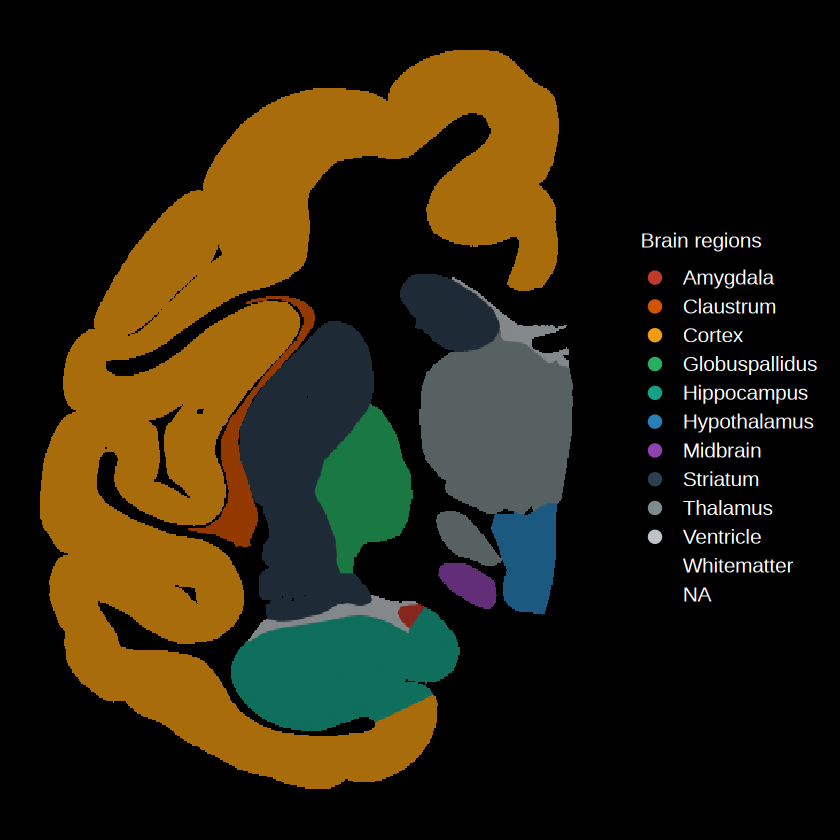

In [48]:
raster.dpi=c(512, 512)
refpos = unique(fsraw.t47[,c("x","y","subcortical")])

psubrgno = ggplot() +
    scattermore::geom_scattermore(
      data = refpos,
      aes(x, y, color = subcortical),
      pixels = raster.dpi,
      pointsize = 0.7
    ) +
    # geom_point(data = refpos,
    #            aes(x, y, color = arealayer),size = 0.01) + 
    # geom_text(data = reflabel, aes(y = ymid, x = xmid, label= areaid),
    #           color = "white") +
    scale_color_flatui() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Brain regions")) +
    theme_presentation() + scale_x_reverse()
psubrgno
ggexport(psubrgno,filename = "result/figure6_other_cmp/T47_annotation_subcortical_25_12_10.pdf",width = 6,height = 6)


refpos = unique(fsraw.t42[,c("x","y","subcortical")])
psubrgno = ggplot() +
    scattermore::geom_scattermore(
      data = refpos,
      aes(x, y, color = subcortical),
      pixels = raster.dpi,
      pointsize = 0.7
    ) +
    # geom_point(data = refpos,
    #            aes(x, y, color = arealayer),size = 0.01) + 
    # geom_text(data = reflabel, aes(y = ymid, x = xmid, label= areaid),
    #           color = "white") +
    scale_color_flatui() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Brain regions")) +
    theme_presentation() + scale_x_reverse() + scale_y_reverse()
psubrgno
ggexport(psubrgno,filename = "result/figure6_other_cmp/T42_annotation_subcortical_25_12_10.pdf",width = 6,height = 6)

,areatr,gene_id,1,2,3,groupid,geneidn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Cerebellum,ARPP19,0.1428571,0.07142857,0,3,1
2,Cerebellum,DDRGK1,0.1355932,0.86440678,0,3,2
3,Cerebellum,FXYD1,0.4084507,0.59154930,0,3,10
4,Cerebellum,IDH3B,0.6567164,0.25373134,0,3,7
5,Cerebellum,NKX6-2,0.5714286,0.00000000,0,3,9
6,Cerebellum,PDHA1,0.0000000,1.00000000,0,3,11


file saved to result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T42.pdf



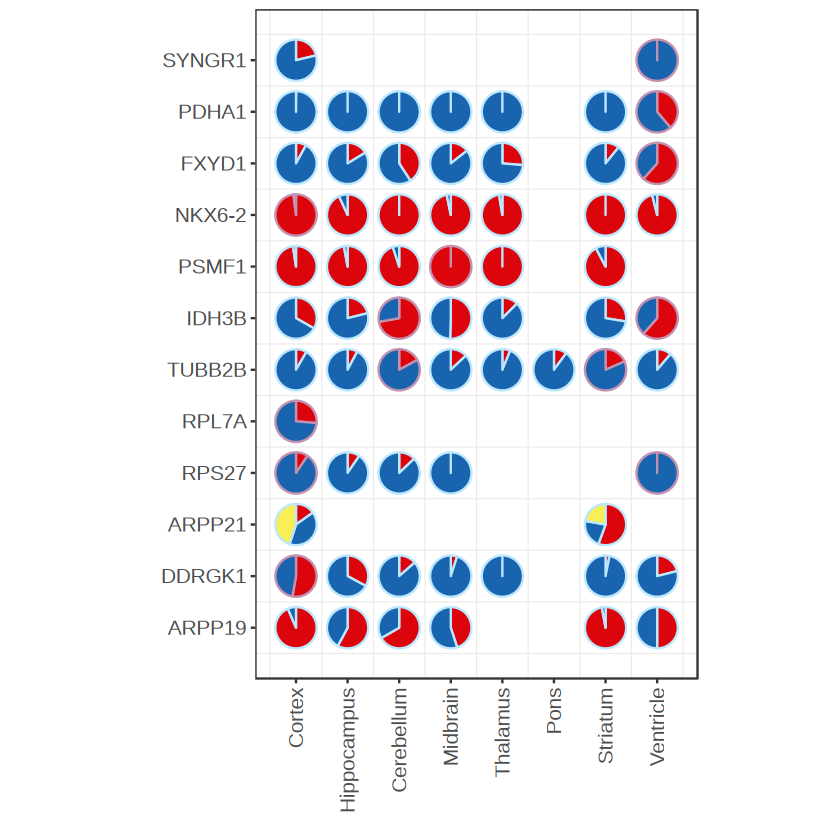

In [31]:
#case plot
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","ARPP21","RPS27","RPL7A","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
#caseg = colnames(isosigimx)
isosigi2 = isosigt.t42
suborder = c("Cortex","Hippocampus","Cerebellum","Midbrain","Thalamus","Pons","Striatum","Ventricle")
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans & isosigi2$genecount > 20,]

casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = suborder))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$major = 'Yes'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")

highlight = c("DDRGK1-Cortex","RPS27-Cortex","RPS27-Ventricle","RPL7A-Cortex",
              "TUBB2B-Cerebellum","TUBB2B-Striatum",
              "IDH3B-Cerebellum","IDH3B-Pons","IDH3B-Ventricle",
              "PSMF1-Midbrain","NKX6-2-Cortex",
              "FXYD1-Ventricle",
              "SYNGR1-Ventricle",
             "PDHA1-Ventricle")
casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$major = "No"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
xlabel = suborder
plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid,color = major,
                                           r = 0.4),
                      cols= colnames(casectl)[3:(3+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = xlabel) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("#C492B1","#BCE7FD")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T42.pdf",width = 7,height = 4)


,areatr,gene_id,1,2,3,groupid,geneidn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Amygdala,TUBB2B,0.1596639,0.84033613,0.0000000,7,6
2,Claustrum,ARPP19,0.8043478,0.05652174,0.0000000,10,1
3,Claustrum,ARPP21,0.0000000,0.35294118,0.1470588,10,3
4,Claustrum,DDRGK1,0.3402778,0.65972222,0.0000000,10,2
5,Claustrum,FXYD1,0.1449275,0.85507246,0.0000000,10,10
6,Claustrum,IDH3B,0.2500000,0.68243243,0.0000000,10,7


file saved to result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T47.pdf



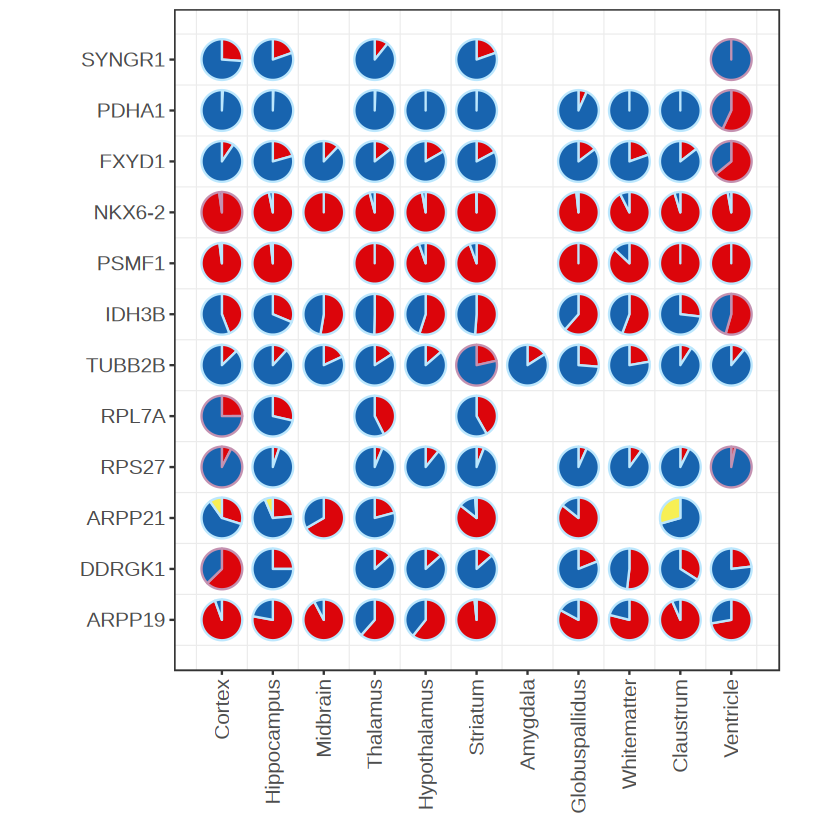

In [34]:
#case plot
#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","ARPP21","RPS27","RPL7A","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
#caseg = colnames(isosigimx)
isosigi2 = isosigt.t47
suborder = c('Cortex','Hippocampus','Midbrain','Thalamus','Hypothalamus','Striatum',
             'Amygdala','Globuspallidus','Whitematter','Claustrum','Ventricle')
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans & isosigi2$genecount > 20,]

casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = suborder))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))
head(casectl)

library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$major = 'Yes'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")

highlight = c("DDRGK1-Cortex","RPS27-Cortex","RPS27-Ventricle","RPL7A-Cortex",
              "TUBB2B-Cerebellum","TUBB2B-Striatum",
              "IDH3B-Cerebellum","IDH3B-Pons","IDH3B-Ventricle",
              "PSMF1-Midbrain","NKX6-2-Cortex",
              "FXYD1-Ventricle",
              "SYNGR1-Ventricle",
             "PDHA1-Ventricle")
casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$major = "No"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
xlabel = suborder
plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid,color = major,
                                           r = 0.4),
                      cols= colnames(casectl)[3:(3+ison-1)]) + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = xlabel) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("#C492B1","#BCE7FD")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure6_other_cmp//case_subcortical_isoform_rate_stat_pie_25_12_08_T47.pdf",width = 7,height = 4)


In [26]:
areaedges.t47 = qread(file = paste0("ref/areaedge_density_T47_12_02.qs"))
areaedges.t42 = qread(file = paste0("ref/areaedge_density_T42_12_02.qs"))
head(areaedges.t47)
edgesdf = areaedges.t47
suban = unique(fsraw.t47[sample(1:nrow(fsraw.t47),10000),c("region","subcortical")])
edgesdf = merge(edgesdf,suban,by.x = "areaid",by.y = "region")
head(edgesdf)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,49868,4534,44481,52614,44486,52552,45046.11,52628.37,44498.80,52584.23,0,0,IPa
2,49868,31959,44481,52614,44483,52678,44510.17,52645.12,45046.11,52628.37,0,0,IPa
3,72829,4534,44490,52506,44486,52552,44491.75,52529.33,45851.22,52647.54,0,0,IPa
4,55551,72829,44490,52485,44490,52506,44534.50,52495.50,44727.50,52495.50,0,0,IPa
5,47032,23675,44474,52843,44478,52754,44674.25,52807.41,44613.10,52804.66,0,0,IPa
6,10567,40670,44475,52887,44473,52918,44463.83,52901.84,49924.40,53254.14,0,0,IPa


,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,34845,64476,54733,82600,54787,82630,54333.65,83382.42,54717.50,82691.50,0,0,Cortex
2,1/2,34845,40137,54733,82600,54682,82576,54697.12,82610.07,54333.65,83382.42,0,0,Cortex
3,1/2,35416,10997,54396,82466,54305,82417,54317.55,82502.70,54121.58,82866.64,0,0,Cortex
4,1/2,18398,64476,54850,82663,54787,82630,54784.78,82710.87,54036.53,84139.35,0,0,Cortex
5,1/2,18398,9806,54850,82663,54887,82684,54036.53,84139.35,54860.03,82688.43,0,0,Cortex
6,1/2,14100,9806,54934,82705,54887,82684,54890.74,82738.72,21983.05,156389.27,0,0,Cortex


In [22]:
SpCasePlot = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    # hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]

    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      theme_void() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()  + ggtitle(geneex)
    return(pmkpti1)
}

In [46]:
hubgene = c("ARPP19","DDRGK1","RPS27","TUBB2B","IDH3B","PSMF1","NKX6-2","FXYD1","PDHA1","SYNGR1","RPL7A","ARPP21")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_015444952.1","XM_015444968.1",
             "XM_005541720.2","RPS27-FS-1",
             "NM_001283898.1","TUBB2B-FS-1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005567237.2","XM_005567239.2",
             "XM_005588819.1","XM_005588818.2",
             "XM_015457873.1","XM_015457875.1",
             "PDHA1-FS-1","XM_005593119.2",
             "NM_001284957.1","RPL7A-FS-1",
             "NKX6-2-FS-1","NKX6-2-FS-3")
edgesdf = areaedges.t42
suban = unique(fsraw.t42[sample(1:nrow(fsraw.t42),10000),c("region","subcortical")])
edgesdf = merge(edgesdf,suban,by.x = "areaid",by.y = "region")
head(edgesdf)
plmkt.sp = list()
# for (i in c(1,2,4)) {
#     print(hubgene[i])
#     plmkt.sp[[i]] = SpCasePlot(fsraw.t42,
#                                hubgene[i],hubtrans,ptsize = 0.5,mycolor,0.5)
# }
plmkt.sp = list()
for (i in c(4)) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.t42,
                               hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor,0.5)
}

for (i in c(1:3,5:length(hubgene))) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot(fsraw.t42,hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor = mycolor)
}
plmkt.spt = ggarrange(plotlist = plmkt.sp,ncol = 8,nrow = 2)
ggexport(plmkt.spt,filename = "result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_total_case_T42_25_12_08.pdf", 
         width = 12/4*8,height = 16/3*2)

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,528351,294999,9934,33790,9975,33787,9951.227,33743.77,9847.967,32332.55,0,0,Cortex
2,1/2,295627,296264,10061,33787,10171,33786,10114.986,33674.95,10113.879,33553.16,0,0,Cortex
3,1/2,293573,293587,9814,33805,9815,33805,9814.500,33809.00,9814.500,33422.33,0,0,Cortex
4,1/2,521226,283544,8668,33706,8624,33657,8798.255,33544.78,8676.158,33654.42,0,0,Cortex
5,1/2,292436,527158,9689,33815,9726,33815,9707.500,33804.95,9707.500,33469.50,0,0,Cortex
6,1/2,520410,520246,8544,33355,8524,33281,9217.421,33133.29,8596.770,33301.04,0,0,Cortex


[1] "TUBB2B"
[1] "ARPP19"
[1] "DDRGK1"
[1] "RPS27"
[1] "IDH3B"
[1] "PSMF1"
[1] "NKX6-2"
[1] "FXYD1"
[1] "PDHA1"
[1] "SYNGR1"
[1] "RPL7A"
[1] "ARPP21"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the ele

In [38]:
intersect(colnames(fsrawt.hub),colnames(fsraw.t42))
colnames(fsraw.t42)

[1] "cidPos"           "readid"           "tranid"           "type"            
 [5] "sample"           "transcript_id"    "gene_id"          "V1"              
 [9] "x"                "y"                "cell_label"       "gene_area"       
[13] "cell_id"          "cell_type_id"     "cell_type"        "subclass"        
[17] "class"            "global_region_id" "origin_name"      "layer"           
[21] "region"           "subcortical"

[1] "cidPos"           "readid"           "tranid"           "type"            
 [5] "sample"           "transcript_id"    "gene_id"          "V1"              
 [9] "x"                "y"                "cell_label"       "gene_area"       
[13] "cell_id"          "cell_type_id"     "cell_type"        "subclass"        
[17] "class"            "global_region_id" "origin_name"      "layer"           
[21] "region"           "subcortical"

In [45]:
fsrawt.t42 = qread("data/reads_full_anotation/T42_main_data_read_total_annotation_nodelete_total_25_12_01.qs")
fsrawt.hub = fsrawt.t42[fsrawt.t42$gene_id == "ARPP19",]
fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "NM_001283415.1" | sum(transcript_id %in% "NM_001283415.1") == 0)
nrow(fsraw.t42)
fsraw.t42 = rbind(fsraw.t42[fsraw.t42$gene_id != "ARPP19",],fsrawt.hub)
nrow(fsraw.t42)

fsrawt.hub = fsrawt.t42[fsrawt.t42$gene_id %in% "RTN1",]
fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "XM_005561388.2" | sum(transcript_id %in% "XM_005561388.2") == 0)
fsraw.t42 = rbind(fsraw.t42[fsraw.t42$gene_id != "RTN1",],fsrawt.hub)
nrow(fsraw.t42)

qsave(fsraw.t42,"data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_hubselect_25_12_10.qs")

[1] 15270278

[1] 15311204

[1] 15342614

In [42]:
fsrawt.t47 = qread("data/reads_full_anotation/T47_main_data_read_total_annotation_nodelete_total_25_12_01.qs")
fsrawt.hub = fsrawt.t47[fsrawt.t47$gene_id == "ARPP19",]
fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "NM_001283415.1" | sum(transcript_id %in% "NM_001283415.1") == 0)
nrow(fsraw.t47)
fsraw.t47 = rbind(fsraw.t47[fsraw.t47$gene_id != "ARPP19",],fsrawt.hub)
nrow(fsraw.t47)

# fsrawt.hub = fsrawt.t47[fsrawt.t47$gene_id %in% "RTN1",]
# fsrawt.hub = fsrawt.hub %>% group_by(readid) %>% filter(transcript_id == "XM_005561388.2" | sum(transcript_id %in% "XM_005561388.2") == 0)
# nrow(fsraw.t47)
# fsraw.t47 = rbind(fsraw.t47[fsraw.t47$gene_id != "RTN1",],fsrawt.hub)
# nrow(fsraw.t47)

qsave(fsraw.t47,"data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_hubselect_25_12_10.qs")

[1] 43585333

[1] 43757646

In [44]:
SpCasePlot2 = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # if(nrow(mkdf) > 3000){
    #     mkdf = mkdf[sample(1:nrow(mkdf),size = 3000,replace = F),]
    # }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    # hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]

    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      theme_void() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_x_reverse()  + ggtitle(geneex)
    return(pmkpti1)
}

edgesdf = areaedges.t47
suban = unique(fsraw.t47[sample(1:nrow(fsraw.t47),10000),c("region","subcortical")])
edgesdf = merge(edgesdf,suban,by.x = "areaid",by.y = "region")
head(edgesdf)
plmkt.sp = list()

for (i in c(4)) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot2(fsraw.t47,
                               hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor,0.2)
}

for (i in c(1:3,5:length(hubgene))) {
    print(hubgene[i])
    plmkt.sp[[i]] = SpCasePlot2(fsraw.t47,hubgene[i],hubtrans,edgesdf,ptsize = 0.5,mycolor = mycolor)
}

plmkt.spt = ggarrange(plotlist = plmkt.sp,ncol = 8,nrow = 2)
ggexport(plmkt.spt,filename = "result/figure6_other_cmp/dtu_case_ls_subcortical_spatial_point_total_case_T47_25_12_08.pdf", 
         width = 12/4*8,height = 16/3*2)

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,34845,64476,54733,82600,54787,82630,54333.65,83382.42,54717.50,82691.50,0,0,Cortex
2,1/2,34845,40137,54733,82600,54682,82576,54697.12,82610.07,54333.65,83382.42,0,0,Cortex
3,1/2,35416,10997,54396,82466,54305,82417,54317.55,82502.70,54121.58,82866.64,0,0,Cortex
4,1/2,18398,64476,54850,82663,54787,82630,54784.78,82710.87,54036.53,84139.35,0,0,Cortex
5,1/2,18398,9806,54850,82663,54887,82684,54036.53,84139.35,54860.03,82688.43,0,0,Cortex
6,1/2,14100,9806,54934,82705,54887,82684,54890.74,82738.72,21983.05,156389.27,0,0,Cortex


[1] "TUBB2B"
[1] "ARPP19"
[1] "DDRGK1"
[1] "RPS27"
[1] "IDH3B"
[1] "PSMF1"
[1] "NKX6-2"
[1] "FXYD1"
[1] "PDHA1"
[1] "SYNGR1"
[1] "RPL7A"
[1] "ARPP21"


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 11"
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"This manual palette can handle a maxi

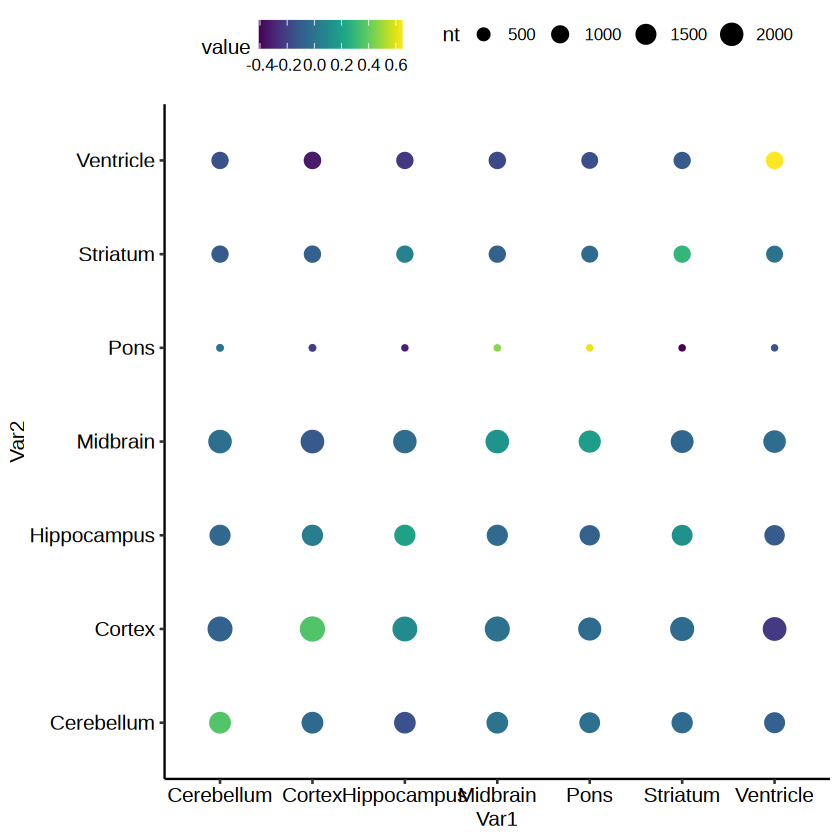

In [85]:
#calculate jaccard score
isosigi = isosigls$subcortical
# isosig.t42
# isosig.t47
jaccard_similarity <- function(vec1, vec2) {
  intersection <- length(intersect(vec1, vec2))
  union <- length(union(vec1, vec2))
  return(intersection/union)
}

isosigi1 = isosigi
isosigi2 = isosig.t42

DTUJaccard = function(isosigi1,isosigi2){
    comarea = intersect(isosigi1$areatr,isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea)){
        for(j in 1:length(comarea)){
            df1 = isosigi1[isosigi1$areatr == comarea[i],]
            df2 = isosigi2[isosigi2$areatr == comarea[j],]
            comgene = intersect(df1$gene_id,df2$gene_id)
            df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            vec1 = paste0(df1$transcript_id,"-",df1$sig)
            vec2 = paste0(df2$transcript_id,"-",df2$sig)
            nt = length(comgene)
            nt1 = length(vec1)
            nt2 = length(vec2)
            jcv = jaccard_similarity(vec1,vec2)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea[i],"Var2" = comarea[j],"value" = jcv,
                                         "nt" = nt,"nt" = nt1,"nt" = nt2))
        }
    }
    return(jcdf)
}


DTUCormx = function(isosigi1,isosigi2){
    comarea = unique(intersect(isosigi1$areatr,isosigi2$areatr))
    jcdf = NULL
    for(i in 1:length(comarea)){
        for(j in 1:length(comarea)){
            df1 = isosigi1[isosigi1$areatr == comarea[i],]
            df2 = isosigi2[isosigi2$areatr == comarea[j],]
            # comgene = intersect(df1$gene_id,df2$gene_id)
            # df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            # df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            df = merge(df1[,c("transcript_id","dr")],df2[,c("transcript_id","dr")],by = "transcript_id")
            nt = nrow(df)
            corv = cor(df$dr.x,df$dr.y)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea[i],"Var2" = comarea[j],"value" = corv,
                                         "nt" = nt))
        }
    }
    return(jcdf)
}

jcdf = DTUCormx(isosigi,isosig.t42)
ggplot(jcdf,aes(x = Var1,y = Var2, color = value,size = nt)) + geom_point() + scale_color_viridis() + theme_pubr()

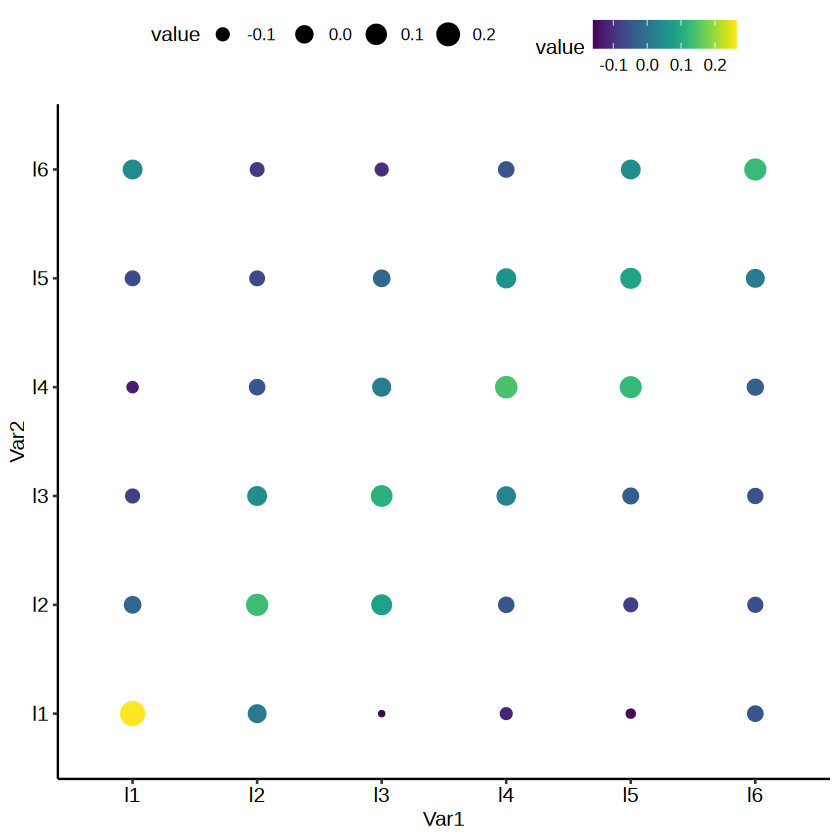

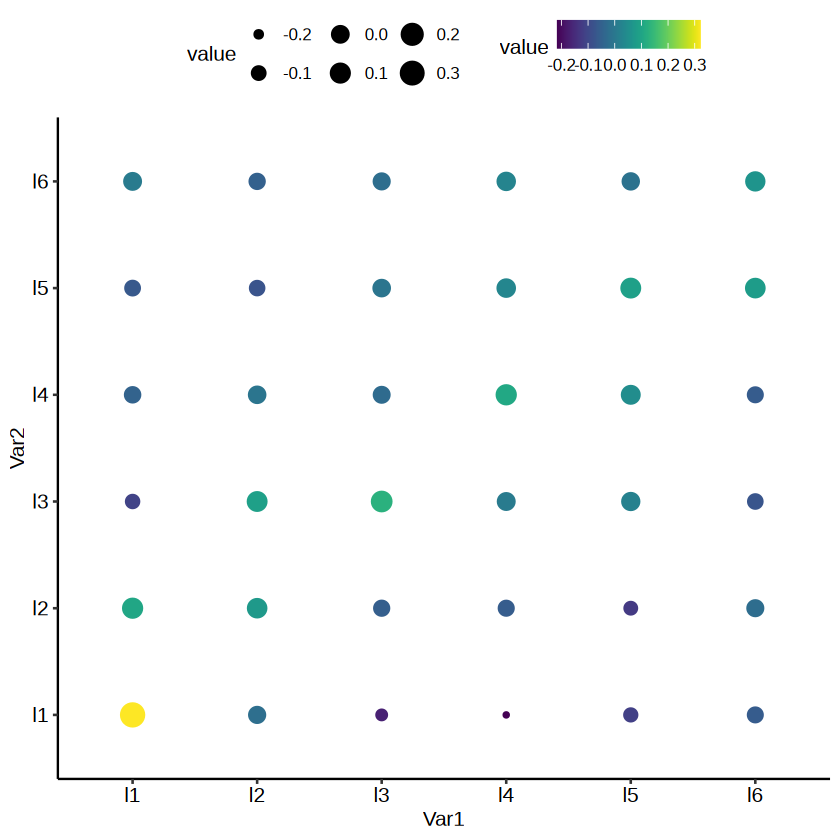

In [86]:
jcdf1 = DTUCormx(isosigls$layer,isosigls.t47$layer)
ggplot(jcdf1,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + scale_color_viridis() + theme_pubr()

jcdf2 = DTUCormx(isosigls$layer,isosigls.t42$layer)
ggplot(jcdf2,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + scale_color_viridis() + theme_pubr()